<!-- # Field Transformation HMC: `ftHMC` -->

**TODO**:
 - [ ] Still can't reproduce their acceptance rate when running with same parameters
   - [ ] even with `leakyReLU()` as in original implementation
   - [ ] check layers and samplers against original implementation
 - [ ] Keep tuning $\tau$ and $N_{\mathrm{LF}}$ in `ftHMC`
 - [ ] Add quantitative metric $\tau_{\mathrm{int}}$ for $Q$ and look at $\delta Q_{\mathbb{Z}}$
   - [ ] Add $Q_{\mathbb{R}}$ to list of metrics tracked
 - [ ] Build & Test `pytorch.DDP` implementation for data[ ]parallel training
 - [ ] Rewrite `ftHMC` and generic `HMC` to be compatible with batch of samples
   - [ ] Try something like $x_{i+1} = m \odot x'_{i} + (1 - m) \odot x_{i}$
   - [ ] Try rewriting `ftHMC` using generators like in `samplers.make_mcmc_ensemble`
 - [ ] Test symmetry and reversibility explicitly
 - [ ] Update tracking to clearly indicate if a model was loaded from some previously trained experiment
   - [ ] In this case, want to know the prior used to train initial model
   - [ ] `logdir` containing trained model
   - [ ] original `TrainConfig` and `SchedulerConfig`
 - [ ] Try adding `sacred` for additional experiment tracking
   
 
 



### Imports

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

if torch.cuda.is_available():
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
else:
    torch.set_default_tensor_type(torch.DoubleTensor)

import matplotlib as mpl
import matplotlib.pyplot as plt

from fthmc.train import train
from fthmc.config import Param, TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots
from fthmc.utils.logger import Logger

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False
%matplotlib inline

style_file = os.path.abspath('~/.matplotlib/stylelib/molokai.mplstyle')
if os.path.isfile(style_file):
    plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')
    plt.style.use(style_file)

[12:08:36]  TORCH DEVICE: cuda

            TORCH DTYPE: torch.float32

In [2]:
import seaborn as sns

#sns.set_palette('bright')
sns.set_style('whitegrid')
colors = ['#228BE6', '#FA5252', '#40C057',
          '#FF920B', '#BE4BDB', '#FAB005',
          '#E64980', '#6A777E', '#4C6EF5']
sns.set_palette(colors)

## Define `Param` and `TrainConfig` for training the flow

In [3]:
import numpy as np

from fthmc.config import SchedulerConfig
from fthmc.main import main

#plt.style.use('~/.matplotlib/stylelib/molokai.mplstyle')

L = 8 
BETA = 7.

# -------------------------------------------
# Specify `param` and `train_config` objects
# -------------------------------------------
param = Param(**{
    'L': L, 
    'tau': 0.5,
    'nrun': 1,
    'beta': BETA,
    'nstep': 16,
    'ntraj': 1000,
    'nprint': 100,
    'seed': 1331,
    #'nth': 0,
    #'nth_interop': 0
})

train_config = TrainConfig(**{
    'L': L,
    'beta': BETA,
    'n_era': 10,
    'n_epoch': 100,
    'activation_fn': 'silu',
    'n_layers': 16,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 1024,
    'print_freq': 500,
    'plot_freq': 100,
    'log_freq': 100,
})

scheduler_config = SchedulerConfig(**{
    'factor': 0.95,
    'patience': 500,
    'min_lr': 5e-6,
    'verbose': True,
})

os.environ["KMP_BLOCKTIME"] = "0"
os.environ["KMP_SETTINGS"] = "1"
os.environ["KMP_AFFINITY"]= (
    "granularity=fine,verbose,compact,1,0"
)
#torch.set_num_threads(int(param.nth))
#torch.set_num_interop_threads(int(param.nth_interop))
#os.environ["OMP_NUM_THREADS"] = str(param.nth)

## Run HMC using `Param` defined above

───────────────────── Running HMC for 1 runs, of 1000 trajectories each ─────────────────────

[12:14:02]  Creating directory: ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s16/plots

[12:14:02]  Param:                                                                           
            ----------------                                                                 
            beta=7.0                                                                         
            L=8                                                                              
            tau=0.5                                                                          
            nstep=16                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.03125                                                                       
            logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n
            1000_t0.5_s16

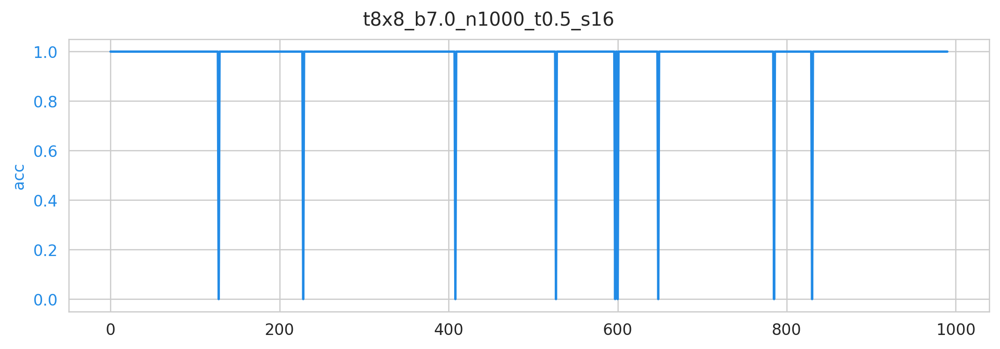

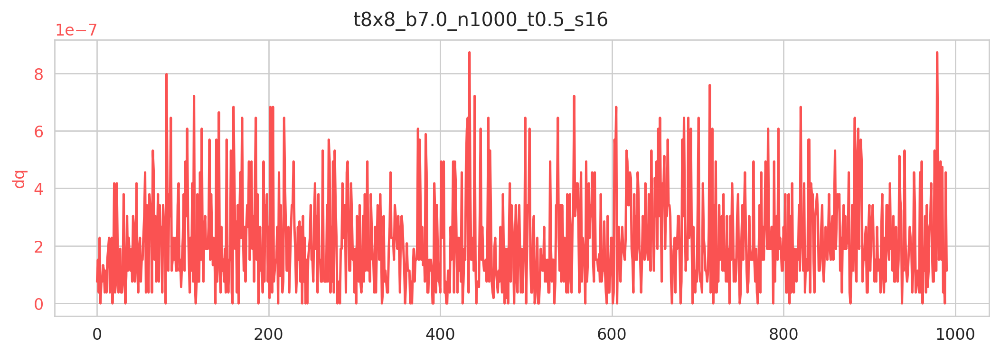

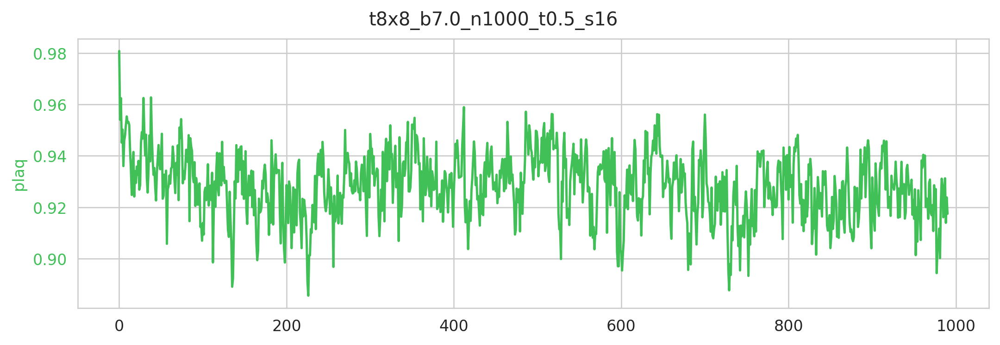

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

[12:14:05]  plaq=1.000 q=0.000

[12:14:06]  traj=2 dt=0.010 acc=1.000 dH=-0.055 plaq=0.954 q=0 dq=0.000

[12:14:13]  traj=102 dt=0.010 acc=1.000 dH=-0.027 plaq=0.909 q=0 dq=0.000

[12:14:20]  traj=202 dt=0.009 acc=1.000 dH=-0.019 plaq=0.921 q=0 dq=0.000

[12:14:27]  traj=302 dt=0.010 acc=1.000 dH=-0.001 plaq=0.942 q=0 dq=0.000

[12:14:35]  traj=402 dt=0.009 acc=1.000 dH=0.028 plaq=0.935 q=0 dq=0.000

[12:14:42]  traj=502 dt=0.010 acc=1.000 dH=-0.036 plaq=0.932 q=0 dq=0.000

[12:14:50]  traj=602 dt=0.010 acc=1.000 dH=-0.013 plaq=0.895 q=0 dq=0.000

[12:14:57]  traj=702 dt=0.009 acc=1.000 dH=-0.027 plaq=0.946 q=0 dq=0.000

[12:15:05]  traj=802 dt=0.009 acc=1.000 dH=0.031 plaq=0.943 q=0 dq=0.000

[12:15:13]  traj=902 dt=0.009 acc=1.000 dH=0.001 plaq=0.924 q=0 dq=0.000

[12:15:20]  Creating directory:                                                              
            ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s16/plots/run0

[12:15:20]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s16/plots/run0/traj.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s16/plots/run0/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s16/plots/run0/acc.png

[12:15:21]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s16/plots/run0/dH.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s16/plots/run0/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s16/plots/run0/q.png

[12:15:22]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat8x8/beta7.0/
            t8x8_b7.0_n1000_t0.5_s16/plots/run0/dq.png

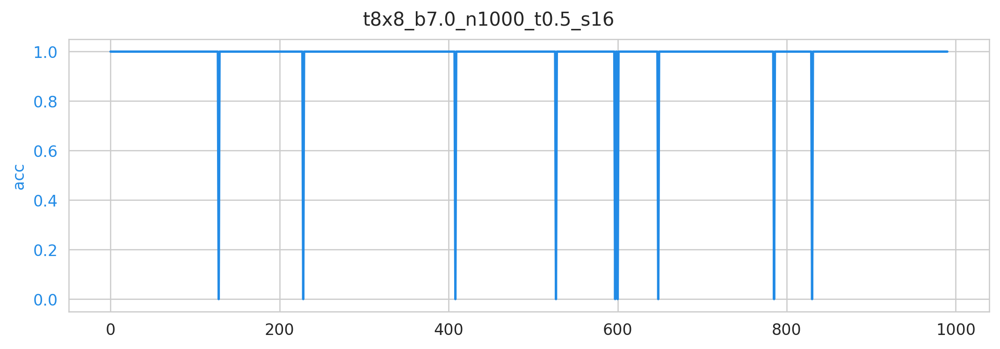

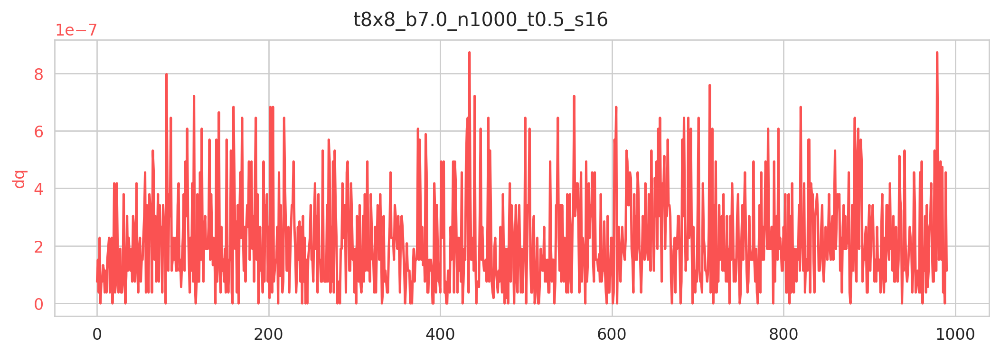

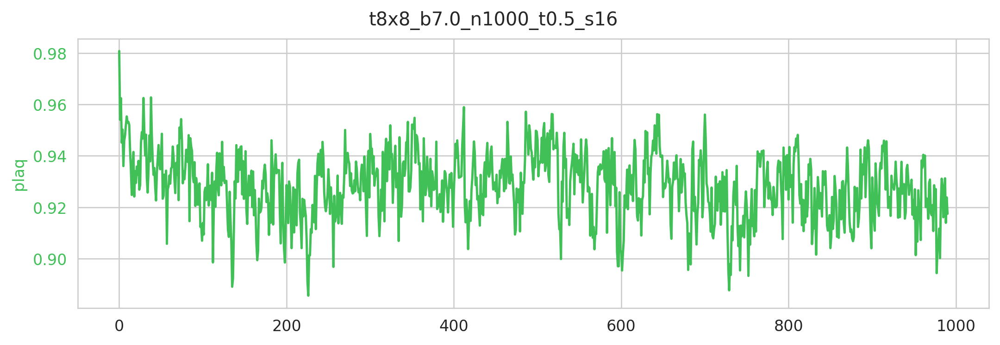

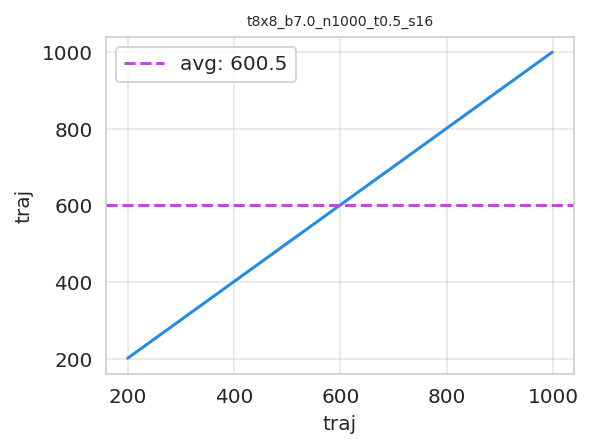

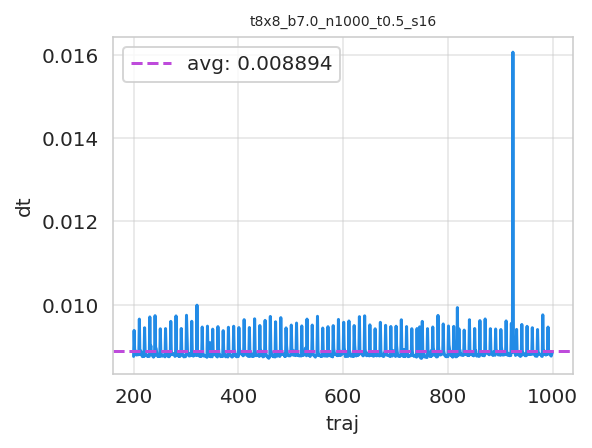

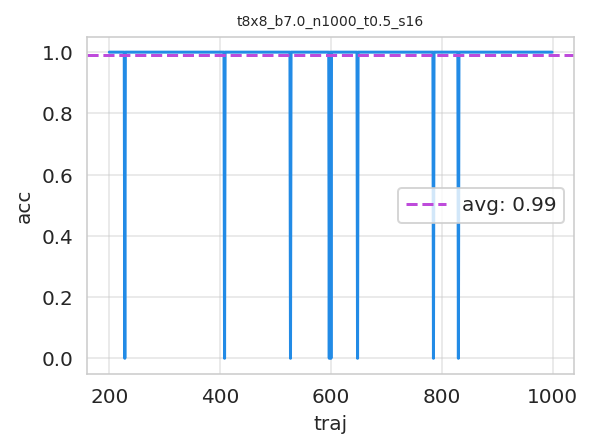

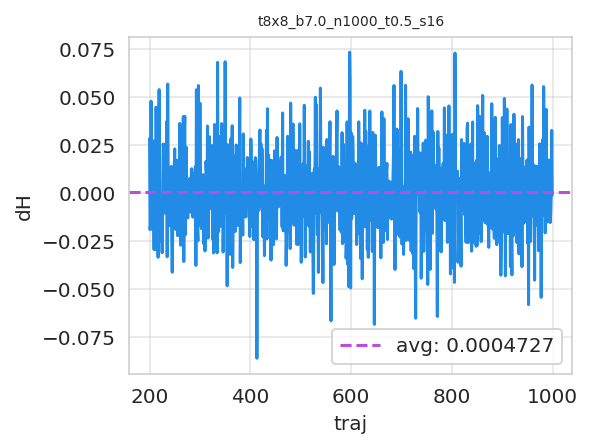

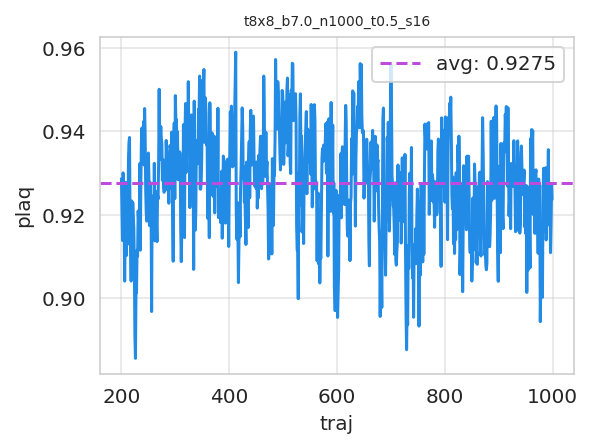

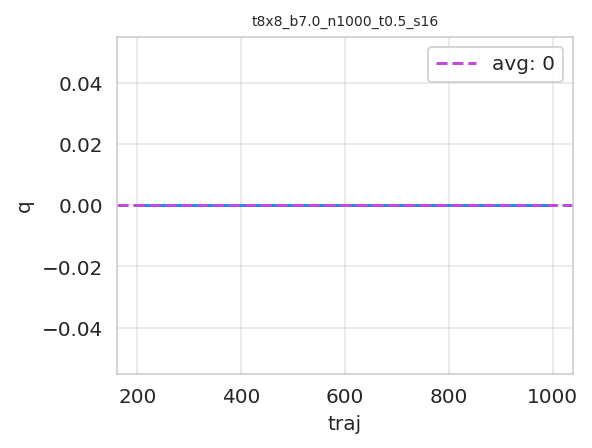

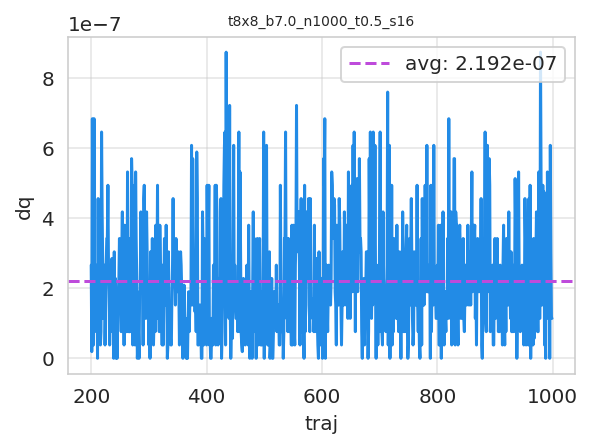

[12:15:23]  Run times: ['76.8582']

            Per trajectory: ['0.0769']

[12:15:23]  Saving hmc_histories to                                                          
            ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s16/hmc_histories.z.

[12:15:24]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/lat8x8/beta7.0/t8x8_b7.0_n1000_t0.5_s16/hmc_fields_arr.z.

In [4]:
from fthmc.hmc import run_hmc
#plt.style.use('/home/foremans/.matplotlib/stylelib/molokai.mplstyle')

logger.rule(f'Running HMC for {param.nrun} runs, '
            f'of {param.ntraj} trajectories each')
hmc_fields, hmc_history = run_hmc(param, plot_metrics=True, figsize=(9, 3.))

## Train flow model using `TrainConfig` and `SchedulerConfig` defined above

─────────────────────── Training FlowModel for 10 eras and 100 epochs ───────────────────────

[12:16:52]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-121652

[12:16:52]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-121652/plots

[12:16:52]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-121652/checkpoints

[12:16:52]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-121652/summaries

[12:16:52]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/summaries

            Scheduler created!

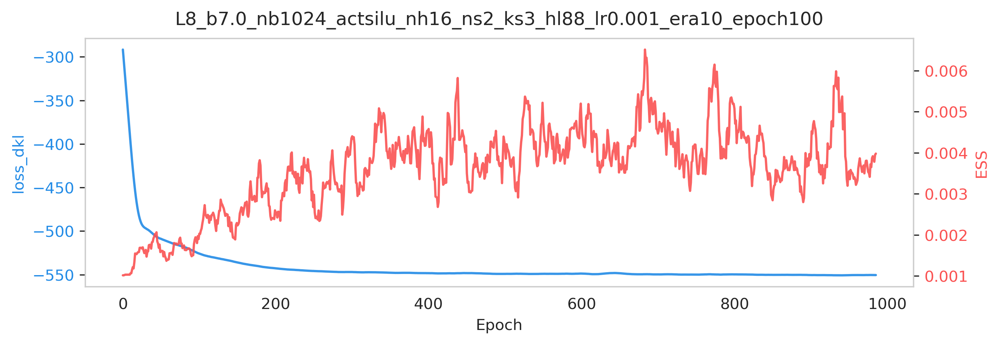

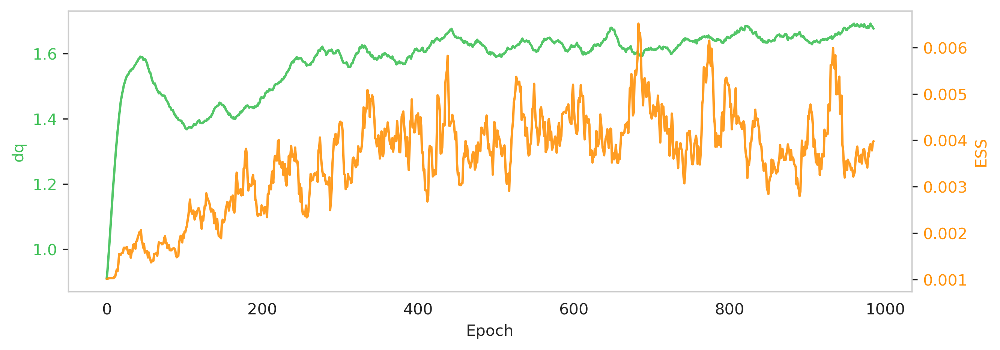

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[12:17:01]  epoch=100 dt=0.084 ess=0.001 logp=368.749 logq=-154.248 loss_dkl=-522.997        
            dq=1.423 plaq=0.823

[12:17:02]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era0-epoch99.tar

───────────────────────────── ERA=1, last took: 0 min 9.233 sec ─────────────────────────────

[12:17:11]  epoch=200 dt=0.085 ess=0.003 logp=391.590 logq=-150.503 loss_dkl=-542.092        
            dq=1.447 plaq=0.874

[12:17:11]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era1-epoch99.tar

───────────────────────────── ERA=2, last took: 0 min 9.343 sec ─────────────────────────────

[12:17:20]  epoch=300 dt=0.085 ess=0.002 logp=398.340 logq=-148.362 loss_dkl=-546.703        
            dq=1.649 plaq=0.889

[12:17:21]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era2-epoch99.tar

───────────────────────────── ERA=3, last took: 0 min 9.314 sec ─────────────────────────────

[12:17:30]  epoch=400 dt=0.085 ess=0.001 logp=400.164 logq=-148.479 loss_dkl=-548.642        
            dq=1.645 plaq=0.893

[12:17:30]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era3-epoch99.tar

───────────────────────────── ERA=4, last took: 0 min 9.428 sec ─────────────────────────────

[12:17:39]  epoch=500 dt=0.085 ess=0.004 logp=400.475 logq=-148.417 loss_dkl=-548.892        
            dq=1.596 plaq=0.894

[12:17:40]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era4-epoch99.tar

───────────────────────────── ERA=5, last took: 0 min 9.353 sec ─────────────────────────────

[12:17:48]  epoch=600 dt=0.085 ess=0.008 logp=401.488 logq=-147.775 loss_dkl=-549.263        
            dq=1.593 plaq=0.896

[12:17:49]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era5-epoch99.tar

───────────────────────────── ERA=6, last took: 0 min 9.356 sec ─────────────────────────────

[12:17:58]  epoch=700 dt=0.085 ess=0.002 logp=401.555 logq=-148.412 loss_dkl=-549.966        
            dq=1.599 plaq=0.896

[12:17:59]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era6-epoch99.tar

───────────────────────────── ERA=7, last took: 0 min 9.43 sec ──────────────────────────────

[12:18:08]  epoch=800 dt=0.086 ess=0.004 logp=402.056 logq=-147.908 loss_dkl=-549.964        
            dq=1.646 plaq=0.897

[12:18:08]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era7-epoch99.tar

───────────────────────────── ERA=8, last took: 0 min 9.476 sec ─────────────────────────────

[12:18:17]  epoch=900 dt=0.086 ess=0.002 logp=402.905 logq=-147.471 loss_dkl=-550.376        
            dq=1.675 plaq=0.899

[12:18:18]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era8-epoch99.tar

───────────────────────────── ERA=9, last took: 0 min 9.395 sec ─────────────────────────────

[12:18:27]  epoch=1000 dt=0.086 ess=0.003 logp=402.662 logq=-148.099 loss_dkl=-550.760       
            dq=1.585 plaq=0.899

[12:18:28]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era9-epoch99.tar

            Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/checkpoints/ckpt-era10-epoch101.tar

[12:18:28]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2
            021-07-12-121652/plots

[12:18:29]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/ess.png

[12:18:30]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/loss_dkl.png

[12:18:31]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/q.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/dq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-
            07-12-121652/plots/plaq.png

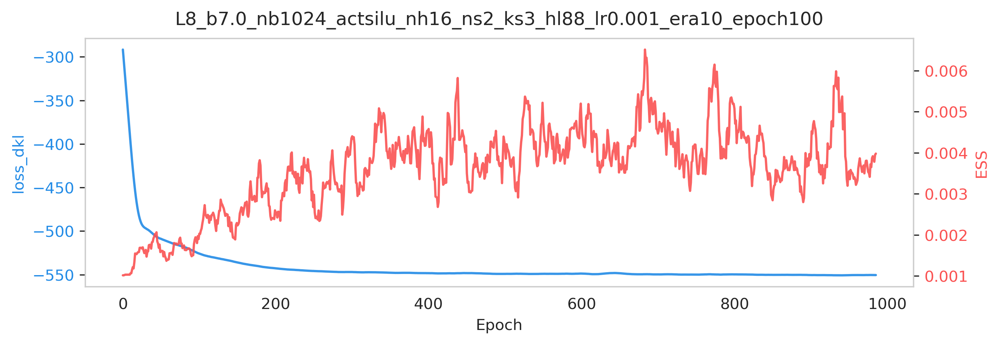

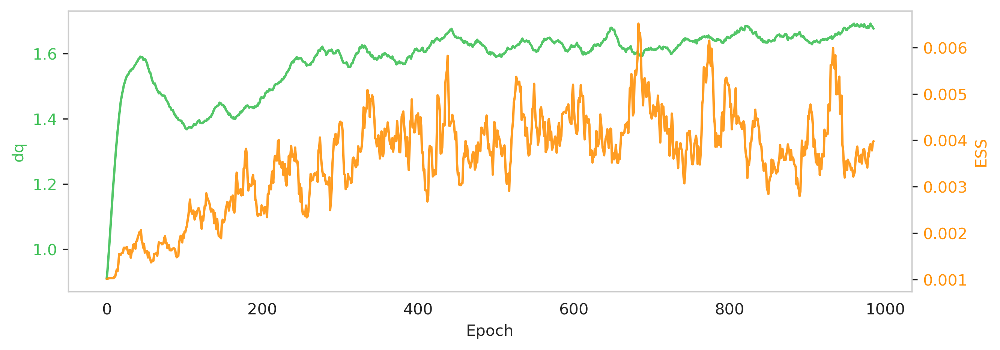

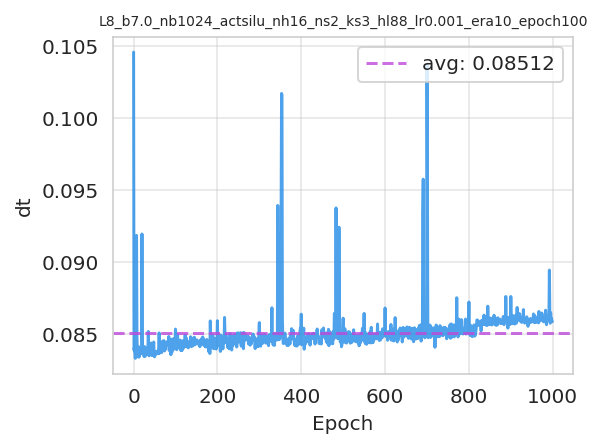

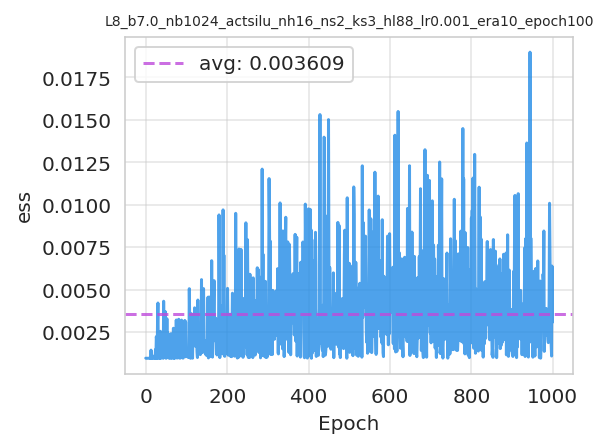

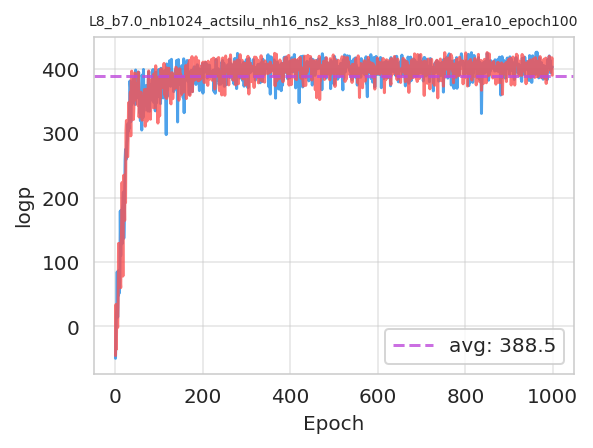

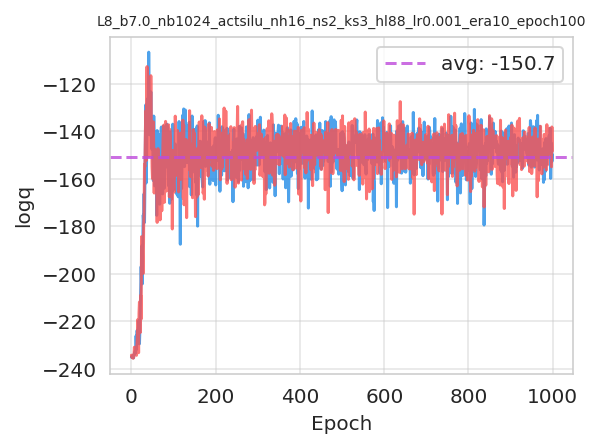

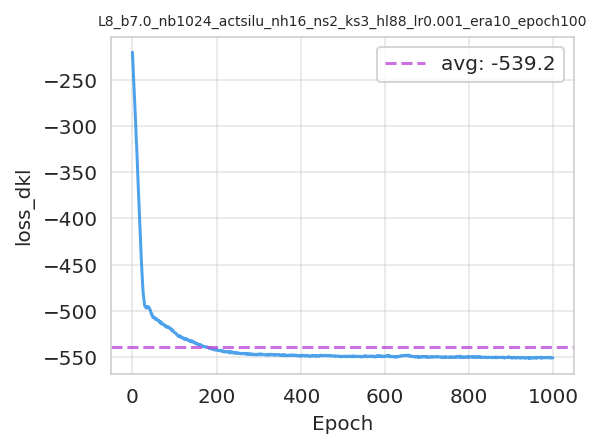

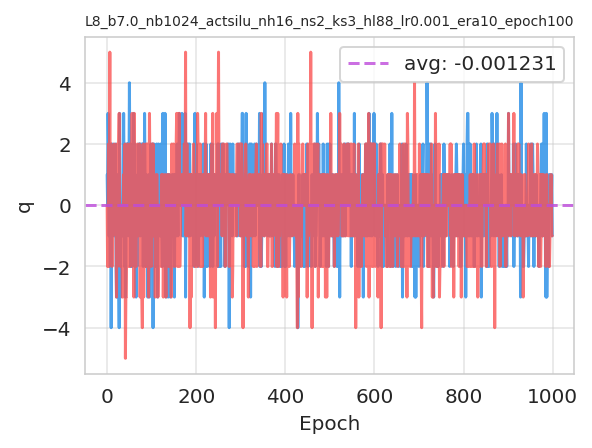

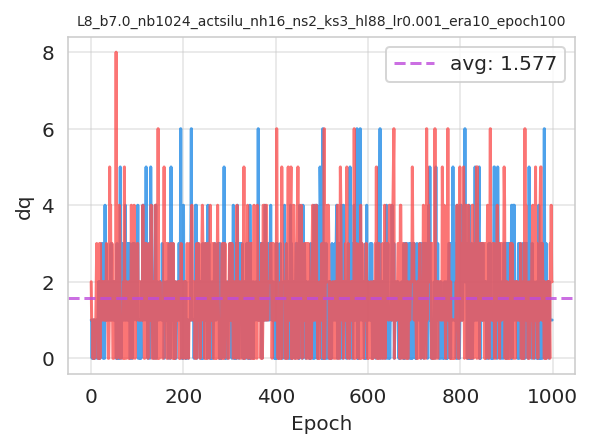

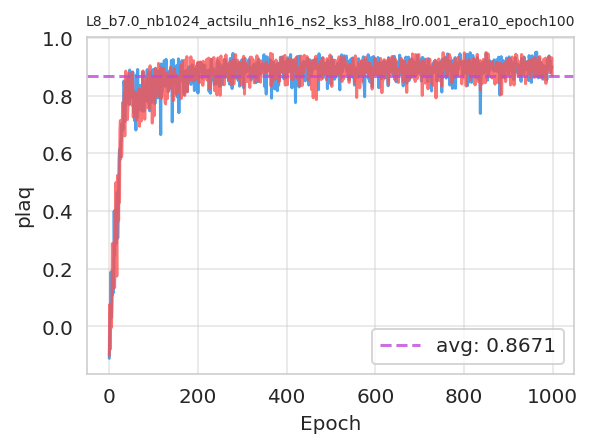

[12:18:33]  Saving train_history to ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_n
            h16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-121652/train_history.
            z.

In [6]:
from fthmc.train import train

logger.rule(f'Training FlowModel for {train_config.n_era} '
            f'eras and {train_config.n_epoch} epochs')
train_outputs = train(config=train_config,
                      model=None,  # train_outputs['model'],
                      pre_model=None,  # train_outputs['model'],
                      dpi=150,
                      figsize=(9, 3.),
                      scheduler_config=None)

## Run inference on trained model and evaluate / plot metrics

──────────────────── Running inference on trained model for 8192 samples ────────────────────

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/utils/inference.py:116: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[12:20:14]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots

[12:20:14]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plot
            s/x.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plot
            s/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plot
            s/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plot
            s/accepted.png

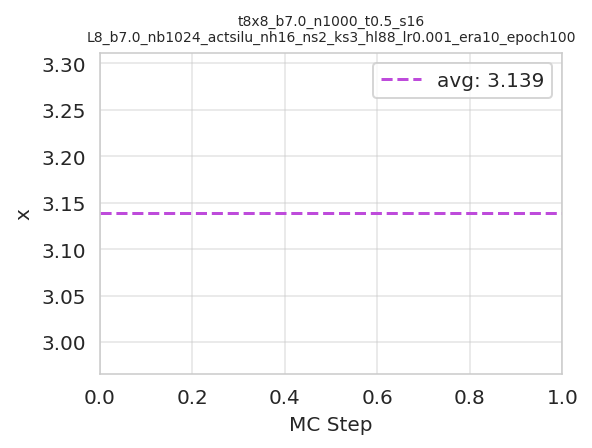

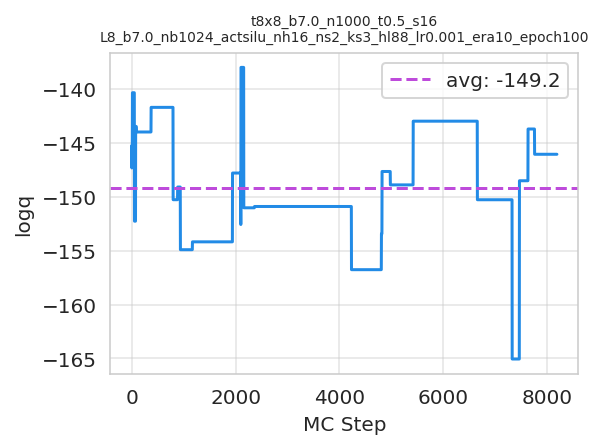

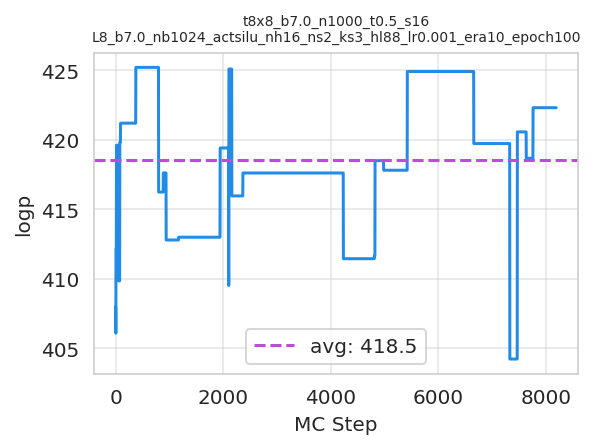

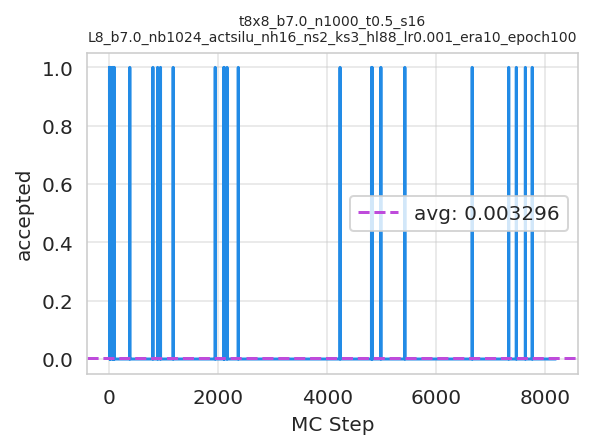

In [7]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
#from fthmc.utils.samplers import make_mcmc_ensemble
from fthmc.utils.inference import U1GaugeAction, make_mcmc_ensemble
from torch.utils.tensorboard import SummaryWriter

NUM_SAMPLES = 8192

logger.rule(f'Running inference on trained model for '
            f'{NUM_SAMPLES} samples')

model = train_outputs['model']
#action_fn = qed.BatchAction(train_config.beta)
action_fn = U1GaugeAction(train_config.beta)
logdir = train_config.logdir

inf_dir = os.path.join(logdir, 'inference')
inf_pdir = os.path.join(inf_dir, 'plots')
inf_sdir = os.path.join(inf_dir, 'summaries')

writer = SummaryWriter(log_dir=inf_sdir)

nb = train_config.batch_size
#model = train_outputs['model']
history = make_mcmc_ensemble(model,
                             #action=action_fn,
                             action_fn,
                             batch_size=nb, 
                             num_samples=NUM_SAMPLES,
                             writer=writer)
                                 #num_samples=NUM_SAMPLES,
                                 #writer=writer)
plot_history(history=history,
             hline=True,
             param=param, config=train_config, #skip=['epoch', 'x'],
             num_chains=4, therm_frac=0., xlabel='MC Step',
             outdir=inf_pdir)

[12:21:08]  slope 1 linear regression S = S_eff + -550.6213

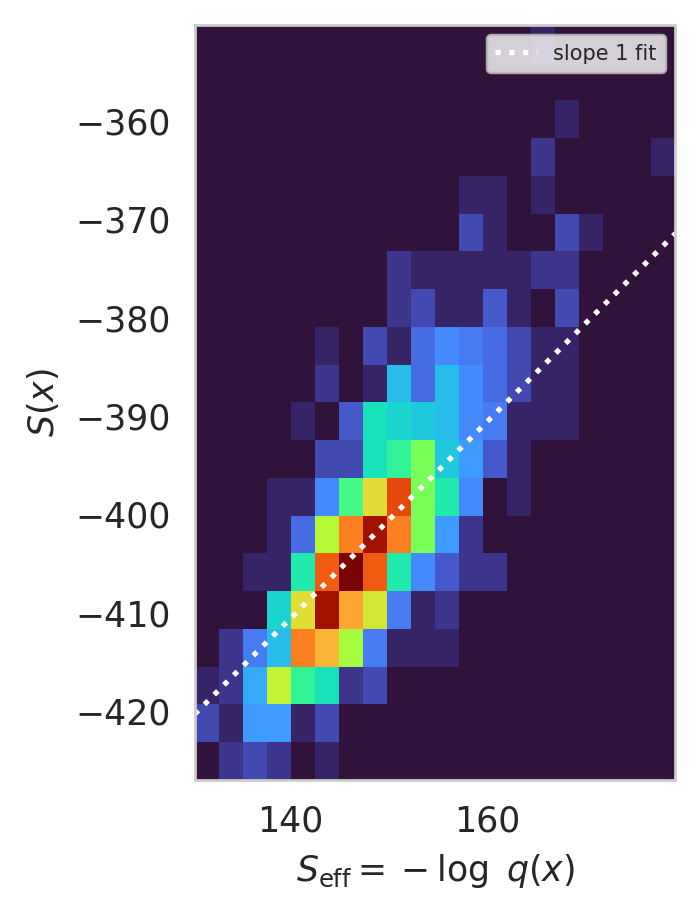

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plot
            s/action_linear_regression.pdf

<Figure size 432x288 with 0 Axes>

In [8]:
from fthmc.config import grab
import fthmc.utils.qed_helpers as qed
from fthmc.utils.samplers import apply_flow_to_prior


model = train_outputs['model']
prior = model.prior
layers = model.layers

action = qed.BatchAction(train_config.beta)

x_, xi_, logq_ = apply_flow_to_prior(prior,
                                     layers,
                                     batch_size=1024)
x = grab(x_)
S_eff = -grab(logq_)
S = grab(action(x_))
#S = grab(phi4_action(torch_x))
fit_b = np.mean(S) - np.mean(S_eff)

logger.log(
    f'slope 1 linear regression S = S_eff + {fit_b:.4f}'
);

S_eff_lims = (np.min(S_eff), np.max(S_eff))
S_lims = (np.min(S), np.max(S))
axrange = [S_eff_lims, S_lims]

fig, ax = plt.subplots(1,1, dpi=125, figsize=(4,4))
ax.hist2d(S_eff, S, bins=20, cmap='turbo', range=axrange)

          #range=[[150, 195], [-230, -195]]);
ax.set_xlabel(r'$S_{\mathrm{eff}} = -\log~q(x)$');
ax.set_ylabel(r'$S(x)$');
ax.set_aspect('equal');
xs = np.linspace(np.min(S_eff), np.max(S_eff),
                 num=4, endpoint=True)
ax.plot(xs, xs + fit_b, ':',
        color='w', label='slope 1 fit');
plt.legend(prop={'size': 6});
plt.show();
outfile = os.path.join(inf_pdir,
                       'action_linear_regression.pdf')
logger.log(f'Saving figure to: {outfile}')
plt.savefig(outfile, dpi=250, bbox_inches='tight');

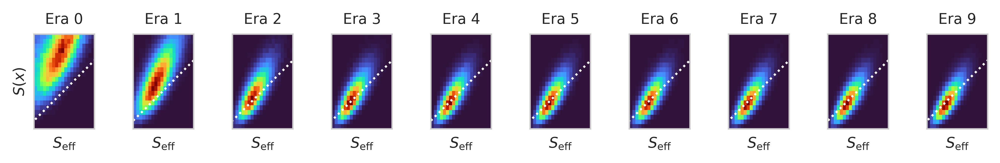

In [9]:
history = train_outputs['history']
n_era = train_config.n_era

fig, axes = plt.subplots(1, 10, dpi=250, sharey=True, figsize=(10, 1))
                         #constrained_layout=True)

logq_hist = np.array(history['logq']).reshape(n_era, -1)[::n_era//10]
logp_hist = np.array(history['logp']).reshape(n_era, -1)[::n_era//10]

for i, (ax, logq, logp) in enumerate(zip(axes, logq_hist, logp_hist)):
    ax.hist2d(-logq, -logp, bins=20, range=axrange, cmap='turbo');
    xs = np.linspace(np.min(-logq), np.max(-logq),
                     num=4, endpoint=True)
    ax.plot(xs, xs + fit_b, ':', lw=1.2,
            color='w', label='slope 1 fit');
    if i == 0:
        ax.set_ylabel(r'$S(x)$', fontsize='small');
    ax.set_xlabel(r'$S_{\mathrm{eff}}$', fontsize='small');
    ax.set_title(f'Era {i * (n_era//10)}', fontsize='small');
    ax.set_xticks([]);
    ax.set_yticks([]);
    #ax.legend(prop={'size': 6});
    ax.set_aspect('equal');
plt.show();

## Run `FieldTransformation` HMC with trained model

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[12:35:58]  Running ftHMC with tau=0.7, nsteps=8

            plaq=0.688 q=4.000

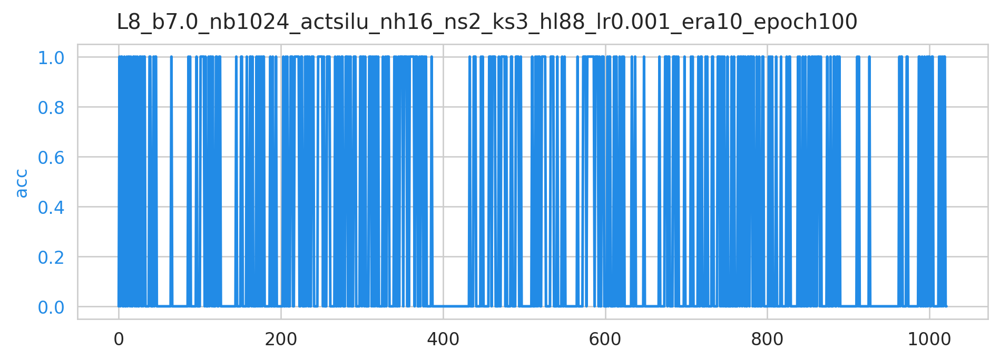

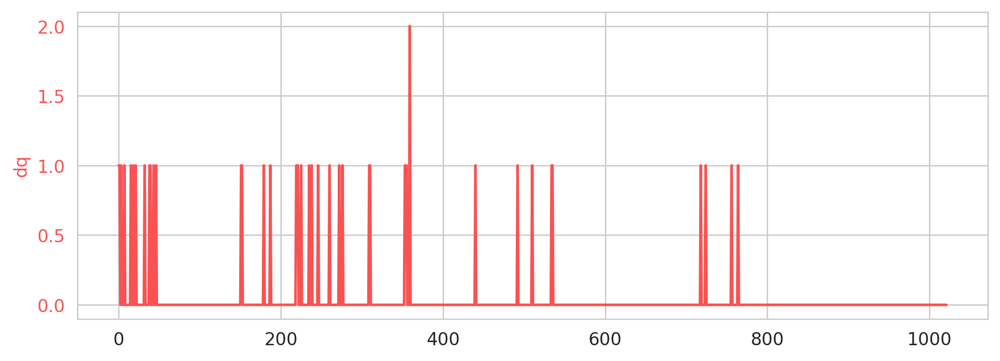

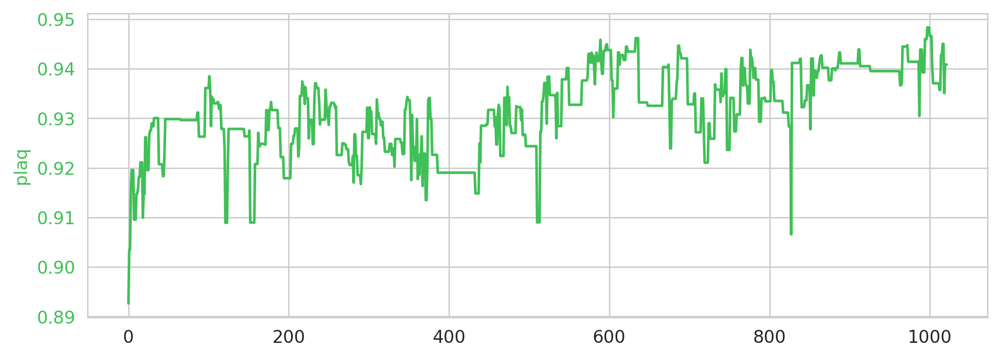

[12:35:59]  traj=0 dt=0.588 acc=0.000 dh=1.471 plaq=0.893 q=3.000 dq=1.000

[12:36:33]  traj=50 dt=0.586 acc=0.000 dh=9.660 plaq=0.930 q=0.000 dq=0.000

[12:37:07]  traj=100 dt=0.585 acc=0.000 dh=5.677 plaq=0.936 q=0.000 dq=0.000

[12:37:41]  traj=150 dt=0.585 acc=0.000 dh=9.806 plaq=0.926 q=0.000 dq=0.000

[12:38:15]  traj=200 dt=0.586 acc=0.000 dh=4.748 plaq=0.918 q=-0.000 dq=0.000

[12:38:49]  traj=250 dt=0.587 acc=1.000 dh=0.659 plaq=0.929 q=1.000 dq=0.000

[12:39:23]  traj=300 dt=0.587 acc=0.000 dh=0.377 plaq=0.926 q=0.000 dq=0.000

[12:39:57]  traj=350 dt=0.585 acc=1.000 dh=0.418 plaq=0.934 q=-0.000 dq=0.000

[12:40:32]  traj=400 dt=0.586 acc=0.000 dh=5.770 plaq=0.919 q=1.000 dq=0.000

[12:41:06]  traj=450 dt=0.586 acc=0.000 dh=15.935 plaq=0.932 q=0.000 dq=0.000

[12:41:40]  traj=500 dt=0.585 acc=0.000 dh=4.546 plaq=0.924 q=1.000 dq=0.000

[12:42:14]  traj=550 dt=0.586 acc=1.000 dh=-0.717 plaq=0.933 q=0.000 dq=0.000

[12:42:49]  traj=600 dt=0.587 acc=0.000 dh=4.620 plaq=0.944 q=0.000 dq=0.000

[12:43:23]  traj=650 dt=0.587 acc=0.000 dh=19.473 plaq=0.933 q=0.000 dq=0.000

[12:43:58]  traj=700 dt=0.588 acc=0.000 dh=1.859 plaq=0.933 q=-0.000 dq=0.000

[12:44:32]  traj=750 dt=0.587 acc=0.000 dh=5.683 plaq=0.924 q=0.000 dq=0.000

[12:45:07]  traj=800 dt=0.586 acc=0.000 dh=8.687 plaq=0.933 q=0.000 dq=0.000

[12:45:41]  traj=850 dt=0.586 acc=0.000 dh=10.347 plaq=0.937 q=0.000 dq=0.000

[12:46:15]  traj=900 dt=0.588 acc=0.000 dh=4.095 plaq=0.941 q=-0.000 dq=0.000

[12:46:50]  traj=950 dt=0.588 acc=0.000 dh=3.680 plaq=0.940 q=0.000 dq=0.000

[12:47:24]  traj=1000 dt=0.588 acc=1.000 dh=0.123 plaq=0.947 q=0.000 dq=0.000

[12:47:40]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_dt0.0875/plots

[12:47:40]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7
            _s8_dt0.0875/plots

[12:47:42]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_
            dt0.0875/plots/traj.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_
            dt0.0875/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_
            dt0.0875/plots/acc.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_
            dt0.0875/plots/dh.png

[12:47:43]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_
            dt0.0875/plots/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_
            dt0.0875/plots/q.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.7_s8_
            dt0.0875/plots/dq.png

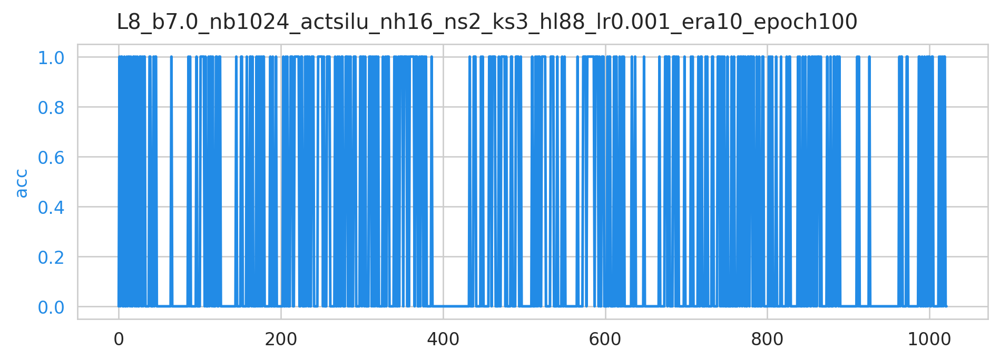

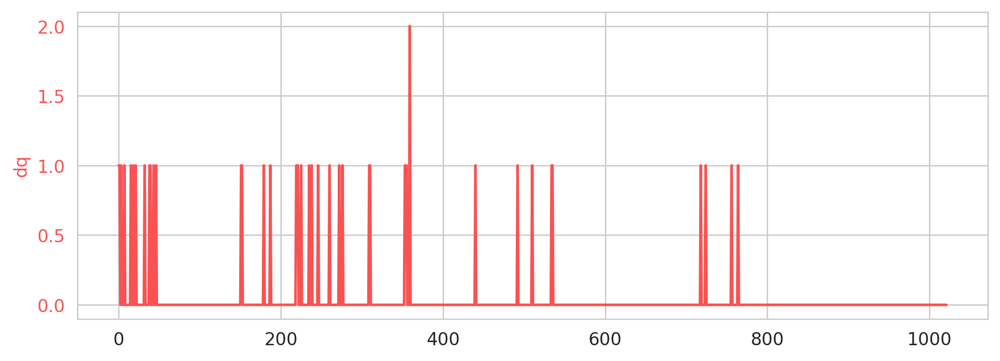

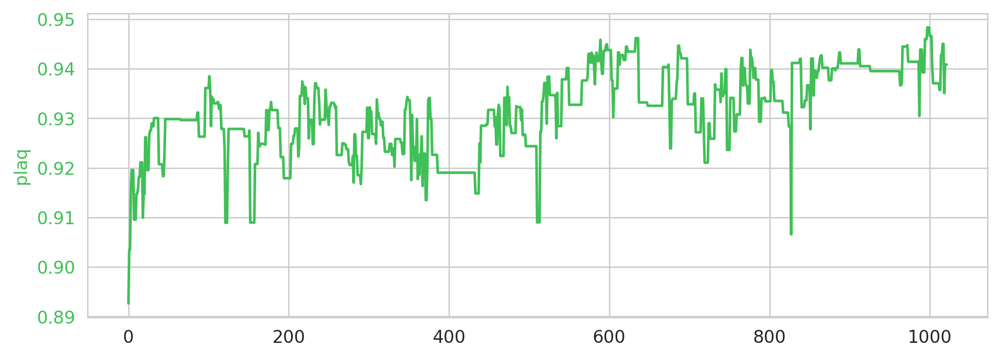

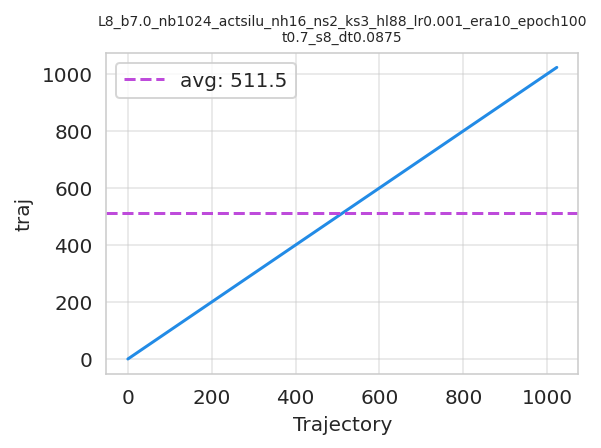

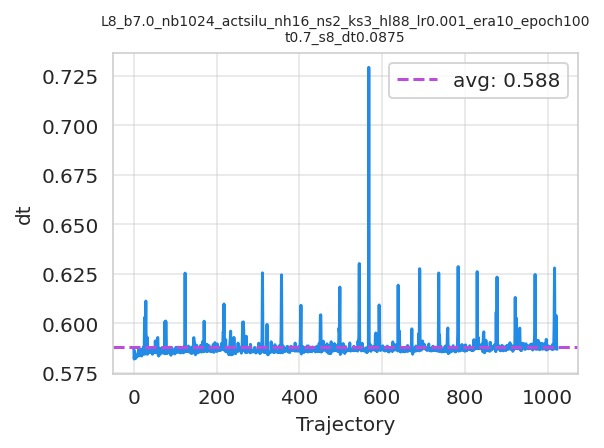

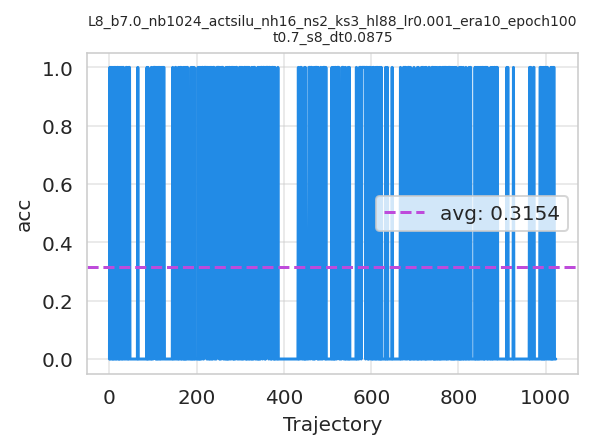

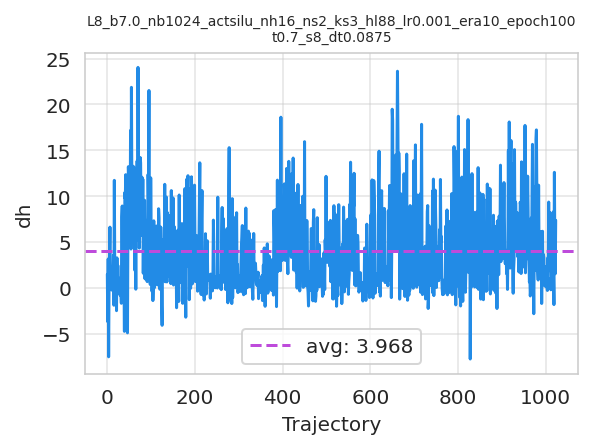

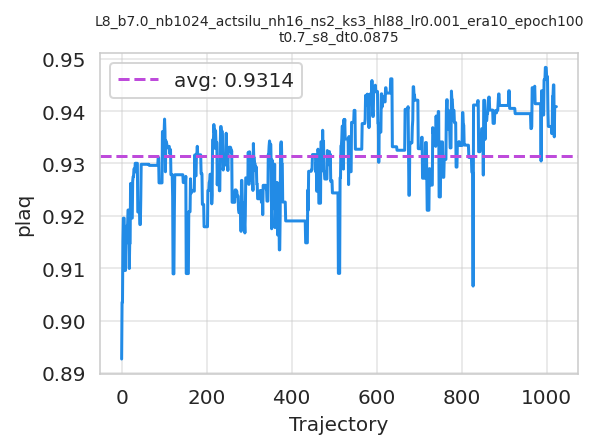

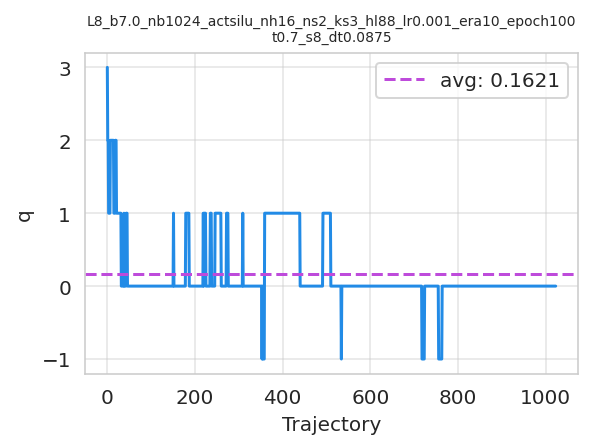

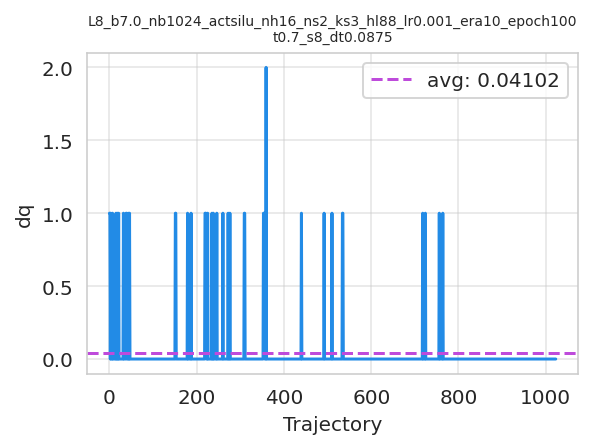

In [15]:
from fthmc.main import run_fthmc
from fthmc.config import ftConfig

flow = train_outputs['model'].layers

ftconfig = ftConfig(tau=0.7, nstep=8)
fthmc_outputs = run_fthmc(flow=flow,
                          num_trajs=1024,
                          config=train_config,
                          ftconfig=ftconfig)


───────────────────────────────────────── nstep: 2 ──────────────────────────────────────────

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[06:56:46]  Running ftHMC with tau=0.1, nsteps=2

            plaq=0.729 q=0.000

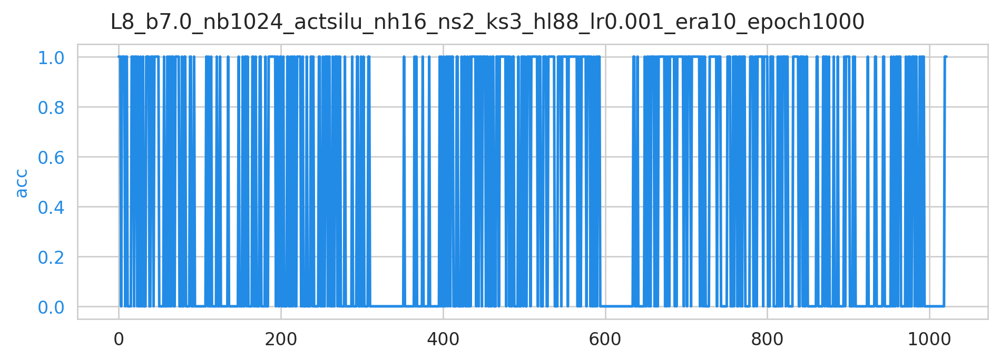

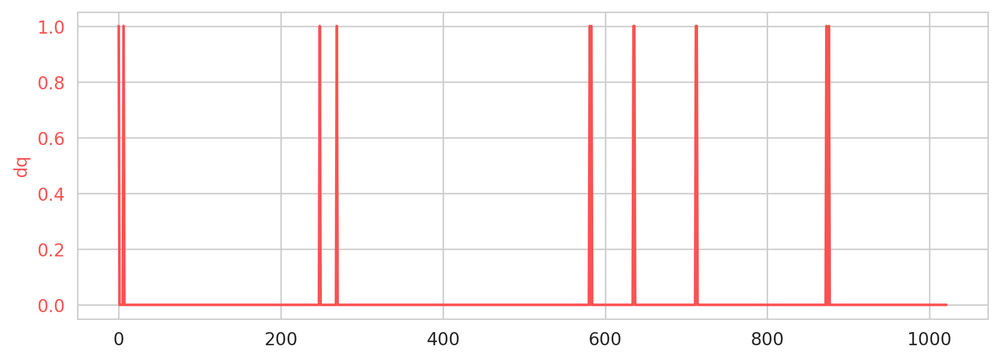

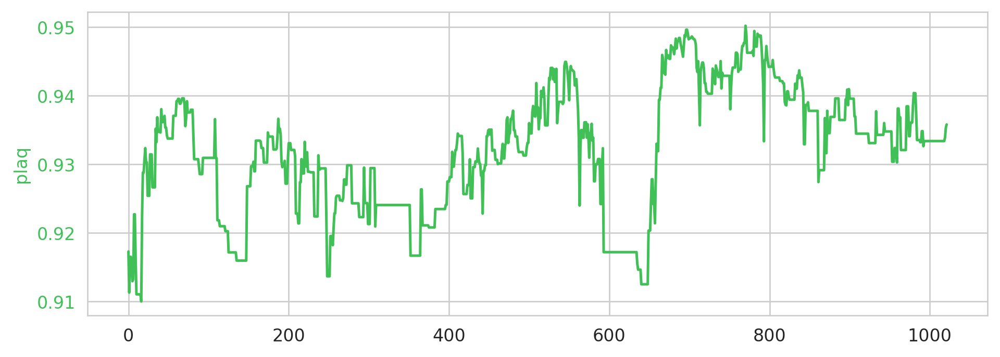

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[06:56:47]  traj=0 dt=0.274 acc=1.000 dh=0.339 plaq=0.917 q=1.000 dq=1.000

[06:57:01]  traj=50 dt=0.191 acc=0.000 dh=2.312 plaq=0.934 q=-0.000 dq=0.000

[06:57:15]  traj=100 dt=0.192 acc=0.000 dh=3.157 plaq=0.931 q=0.000 dq=0.000

[06:57:30]  traj=150 dt=0.192 acc=0.000 dh=3.158 plaq=0.927 q=0.000 dq=0.000

[06:57:44]  traj=200 dt=0.192 acc=1.000 dh=0.495 plaq=0.933 q=0.000 dq=0.000

[06:57:59]  traj=250 dt=0.192 acc=0.000 dh=10.333 plaq=0.914 q=1.000 dq=0.000

[06:58:13]  traj=300 dt=0.192 acc=0.000 dh=3.259 plaq=0.921 q=-0.000 dq=0.000

[06:58:28]  traj=350 dt=0.192 acc=0.000 dh=3.807 plaq=0.924 q=0.000 dq=0.000

[06:58:43]  traj=400 dt=0.192 acc=0.000 dh=7.413 plaq=0.927 q=-0.000 dq=0.000

[06:58:58]  traj=450 dt=0.192 acc=1.000 dh=-0.687 plaq=0.935 q=0.000 dq=0.000

[06:59:12]  traj=500 dt=0.192 acc=1.000 dh=-0.762 plaq=0.936 q=0.000 dq=0.000

[06:59:27]  traj=550 dt=0.193 acc=1.000 dh=-0.909 plaq=0.939 q=-0.000 dq=0.000

[06:59:41]  traj=600 dt=0.193 acc=0.000 dh=7.195 plaq=0.917 q=0.000 dq=0.000

[06:59:56]  traj=650 dt=0.193 acc=0.000 dh=0.892 plaq=0.920 q=-0.000 dq=0.000

[07:00:11]  traj=700 dt=0.193 acc=1.000 dh=-0.366 plaq=0.948 q=-0.000 dq=0.000

[07:00:26]  traj=750 dt=0.193 acc=0.000 dh=1.021 plaq=0.943 q=0.000 dq=0.000

[07:00:41]  traj=800 dt=0.193 acc=1.000 dh=0.418 plaq=0.944 q=-0.000 dq=0.000

[07:00:56]  traj=850 dt=0.193 acc=0.000 dh=8.753 plaq=0.938 q=0.000 dq=0.000

[07:01:10]  traj=900 dt=0.196 acc=1.000 dh=-0.107 plaq=0.940 q=0.000 dq=0.000

[07:01:25]  traj=950 dt=0.193 acc=0.000 dh=5.806 plaq=0.935 q=-0.000 dq=0.000

[07:01:40]  traj=1000 dt=0.193 acc=0.000 dh=1.108 plaq=0.933 q=0.000 dq=0.000

[07:01:47]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2_dt0.05/plots

[07:01:47]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.
            1_s2_dt0.05/plots

[07:01:48]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/traj.png

[07:01:49]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/acc.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/dh.png

[07:01:50]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/q.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/ftHMC/t0.1_s2
            _dt0.05/plots/dq.png

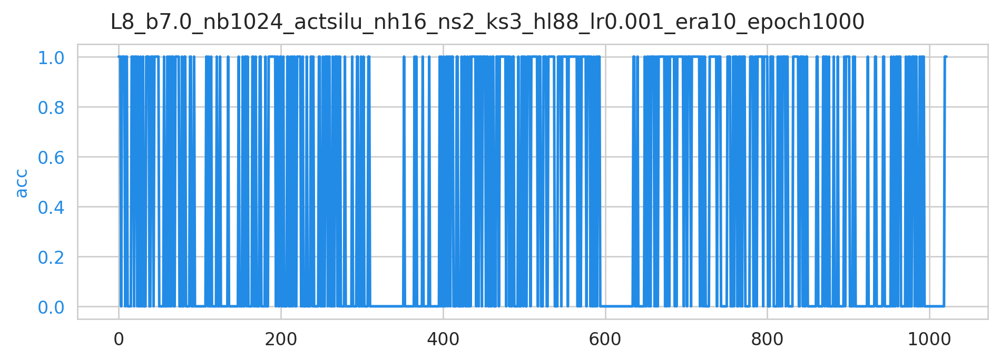

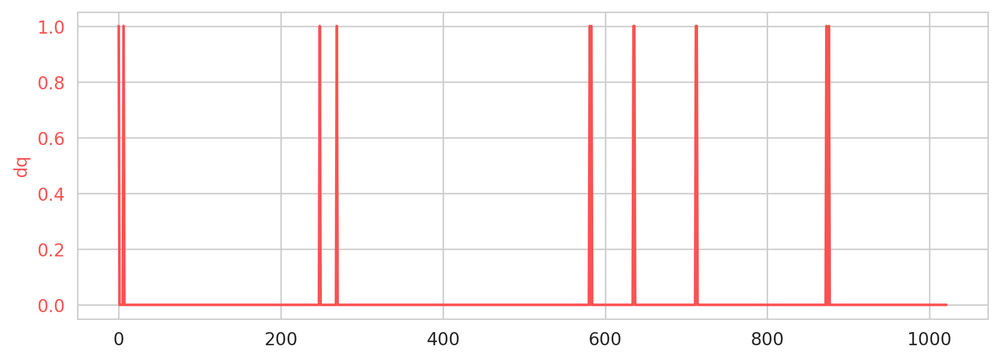

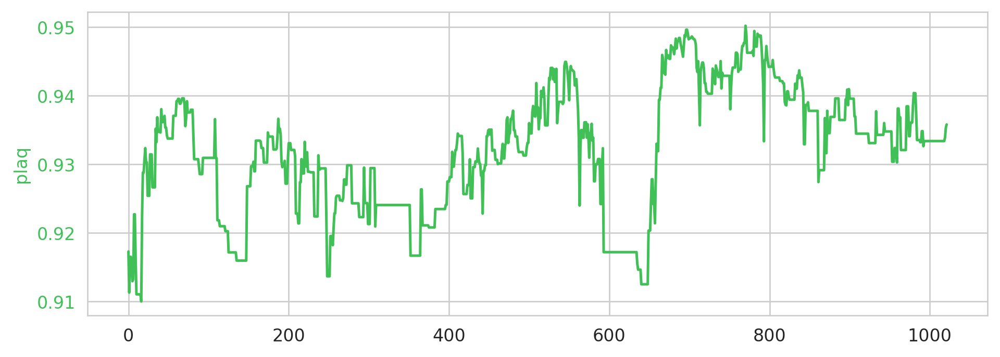

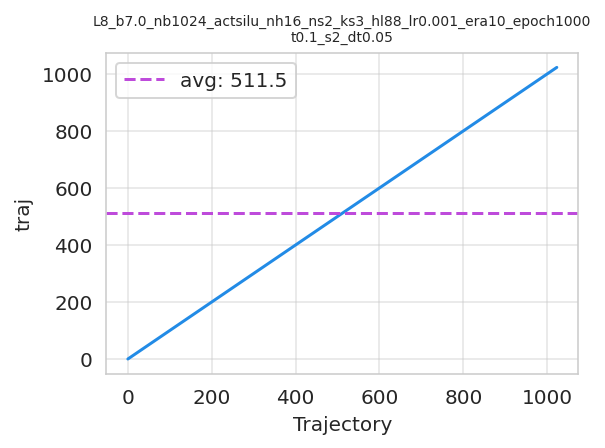

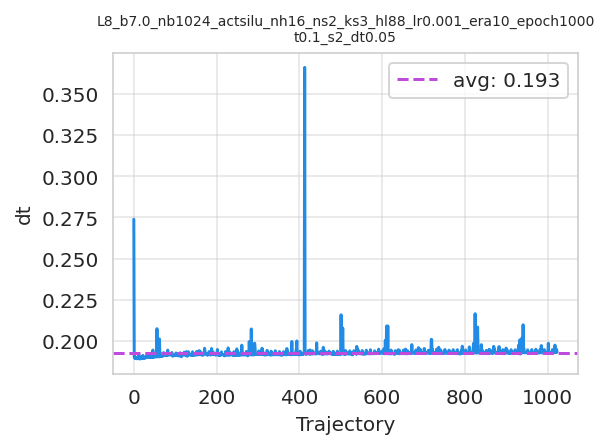

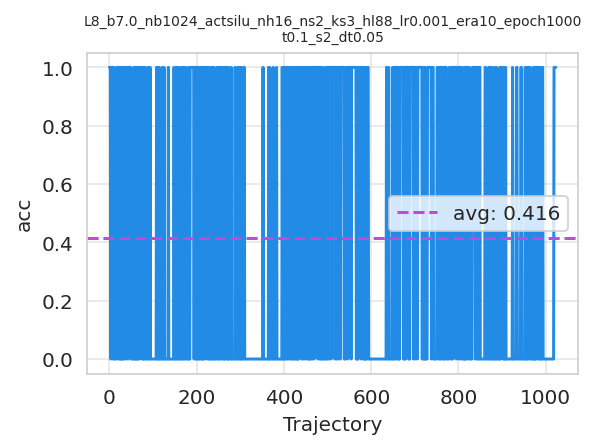

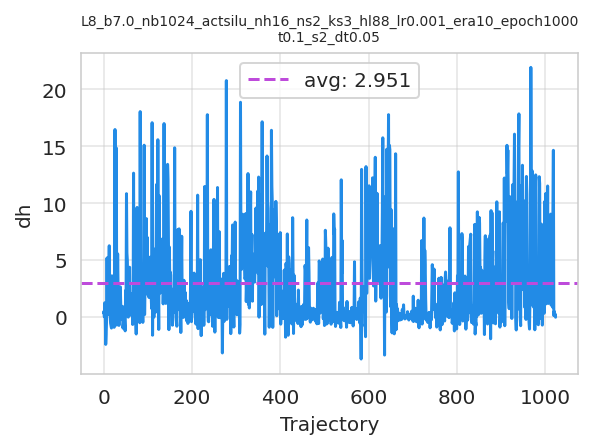

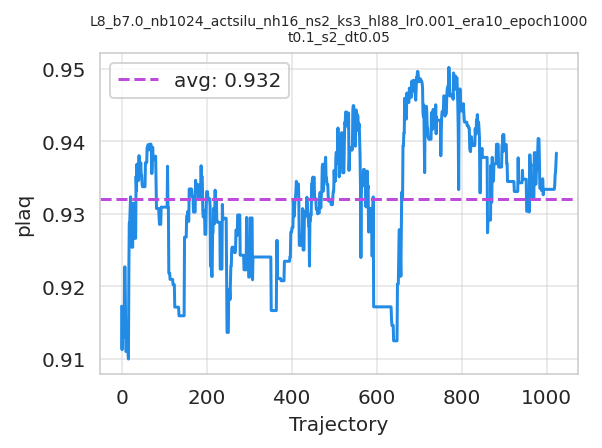

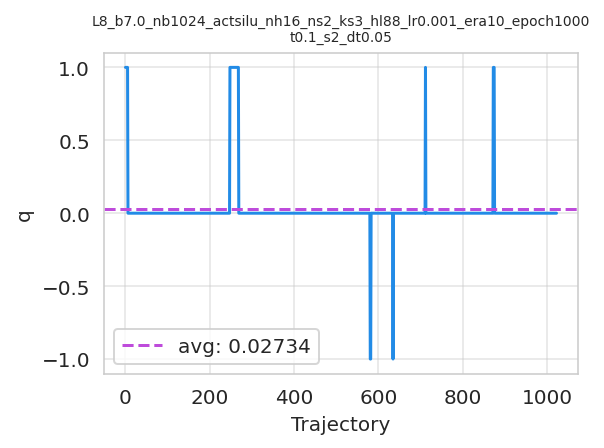

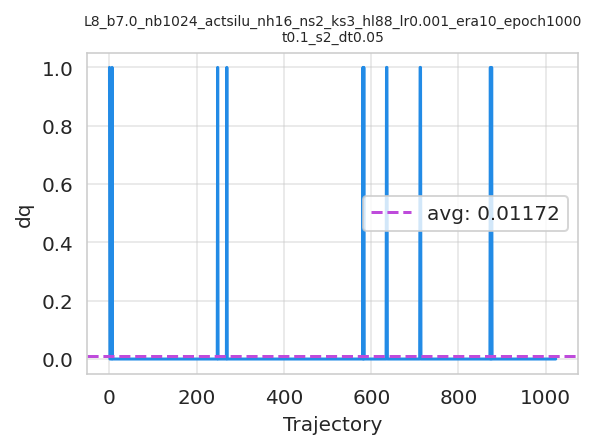

───────────────────────────────────────── nstep: 5 ──────────────────────────────────────────

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[07:01:52]  Running ftHMC with tau=0.1, nsteps=5

            plaq=0.725 q=1.000

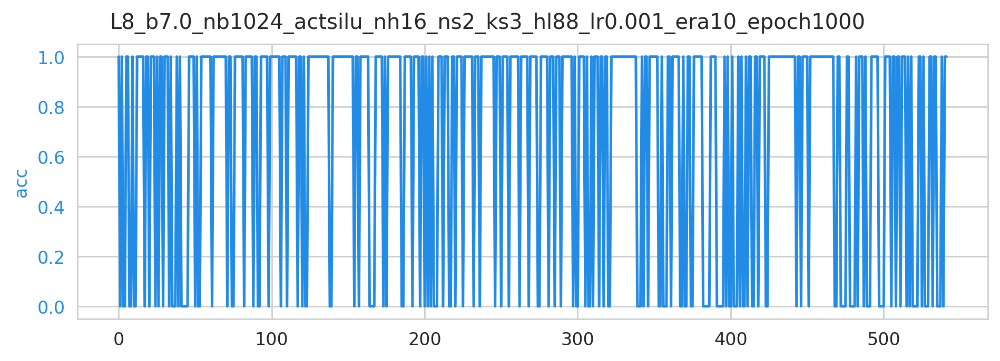

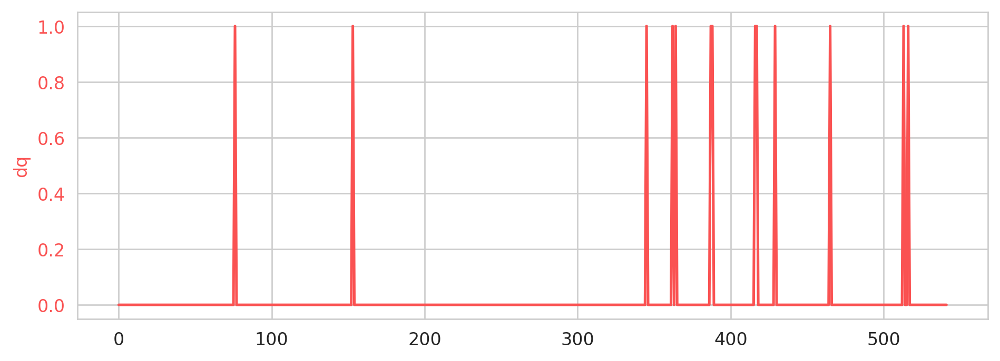

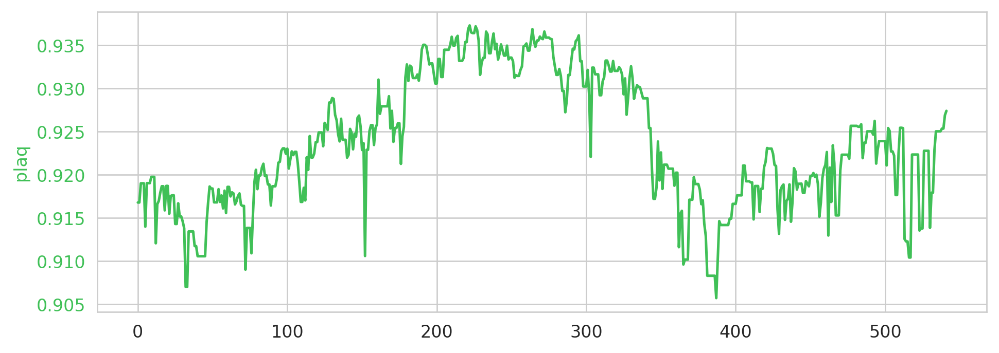

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[07:01:53]  traj=0 dt=0.442 acc=1.000 dh=0.295 plaq=0.917 q=1.000 dq=0.000

[07:02:18]  traj=50 dt=0.413 acc=0.000 dh=0.203 plaq=0.918 q=1.000 dq=0.000

[07:02:43]  traj=100 dt=0.409 acc=1.000 dh=0.200 plaq=0.923 q=0.000 dq=0.000

[07:03:09]  traj=150 dt=0.416 acc=1.000 dh=-0.103 plaq=0.923 q=0.000 dq=0.000

[07:03:34]  traj=200 dt=0.410 acc=0.000 dh=4.702 plaq=0.931 q=-1.000 dq=0.000

[07:04:00]  traj=250 dt=0.410 acc=0.000 dh=0.449 plaq=0.934 q=-1.000 dq=0.000

[07:04:25]  traj=300 dt=0.416 acc=0.000 dh=6.855 plaq=0.930 q=-1.000 dq=0.000

[07:04:51]  traj=350 dt=0.411 acc=1.000 dh=-0.635 plaq=0.923 q=0.000 dq=0.000

[07:05:17]  traj=400 dt=0.410 acc=0.000 dh=1.748 plaq=0.917 q=0.000 dq=0.000

[07:05:42]  traj=450 dt=0.411 acc=1.000 dh=-0.418 plaq=0.920 q=-1.000 dq=0.000

[07:06:08]  traj=500 dt=0.410 acc=0.000 dh=0.331 plaq=0.924 q=0.000 dq=0.000

KeyboardInterrupt: 

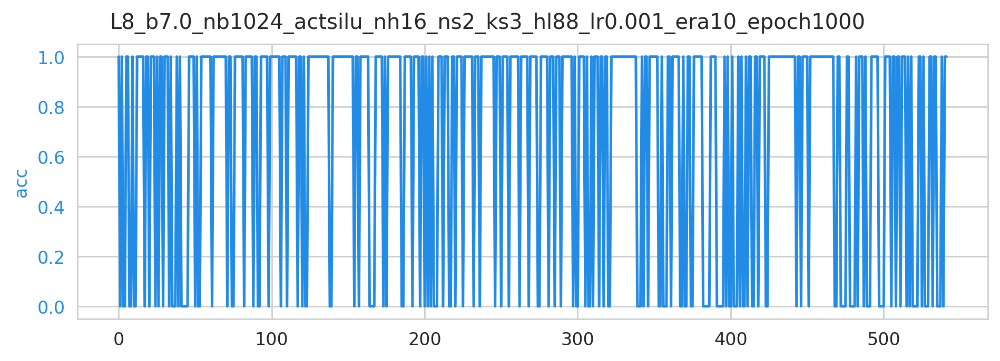

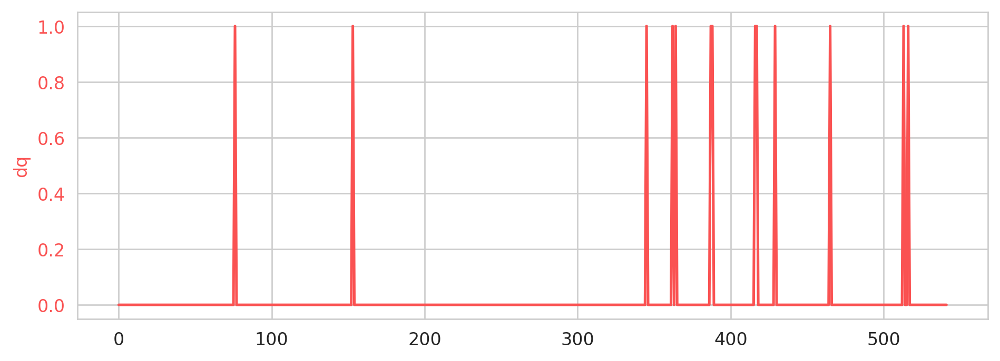

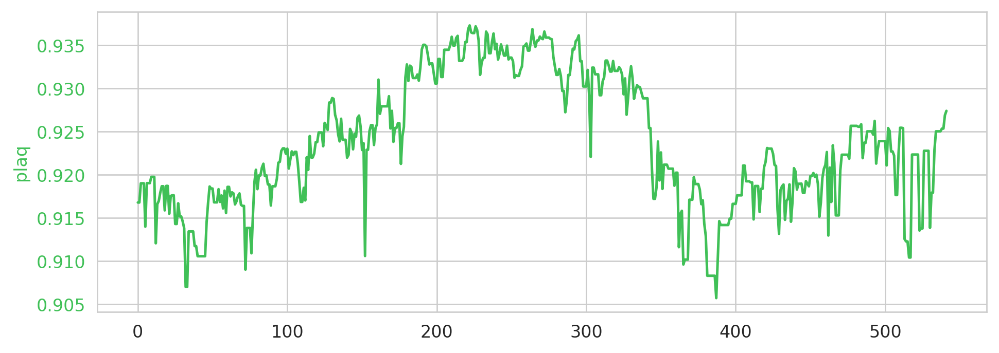

In [12]:
from fthmc.main import run_fthmc
from fthmc.config import ftConfig

#tau = 0.5
nstep_arr = [2, 5, 10, 15, 20]
fts = {}
dirs = {}
runs_histories = {}
flow = train_outputs['model'].layers
for tau in [0.1, 0.5, 1.0]:
    for nstep in nstep_arr:
        logger.rule(f'nstep: {nstep}')
        ftconfig = ftConfig(tau=tau, nstep=nstep)
        fthmc_outputs = run_fthmc(flow=flow,
                                  num_trajs=1024,
                                  config=train_config,
                                  ftconfig=ftconfig)



#  Transfer to larger lattice


──────────────────────── Transferring trained model to 16x16 lattice ────────────────────────

───────────────────── Running HMC for 1 runs, each of 1000 trajectories ─────────────────────

[13:23:27]  Creating directory:                                                              
            ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s16/plots

[13:23:27]  Param:                                                                           
            ----------------                                                                 
            beta=7.0                                                                         
            L=16                                                                             
            tau=0.5                                                                          
            nstep=16                                                                         
            ntraj=1000                                                                       
            nrun=1                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth_interop=2                                                                    
            nth=2                                                                            
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            dt=0.03125                                                                       
            logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.0/t16x16_b7
            .0_n1000_t0.5_s16

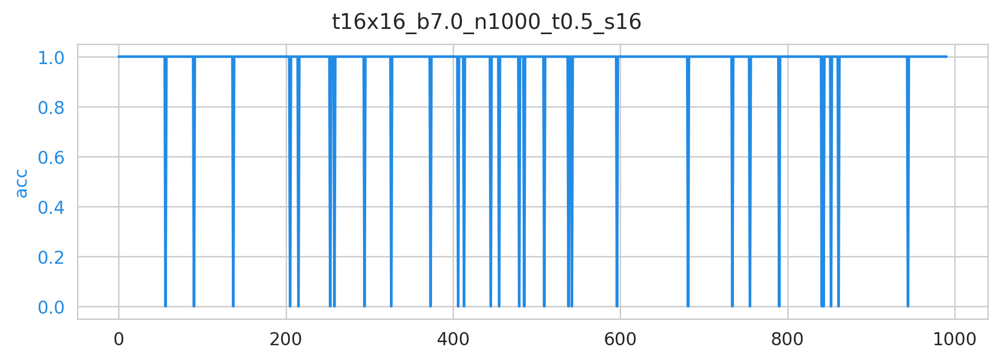

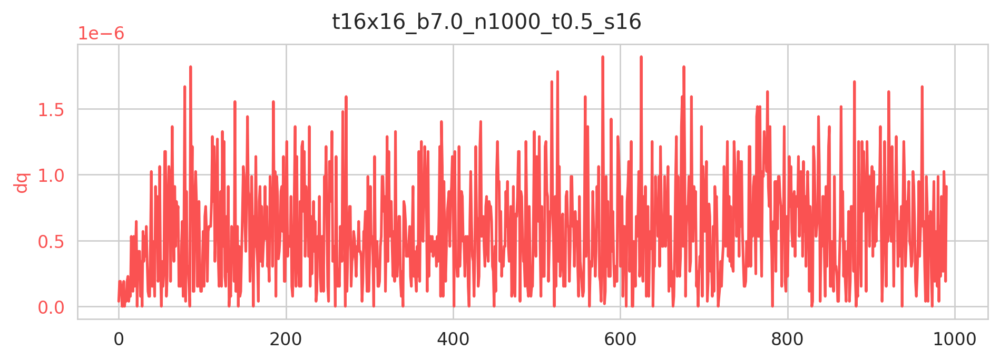

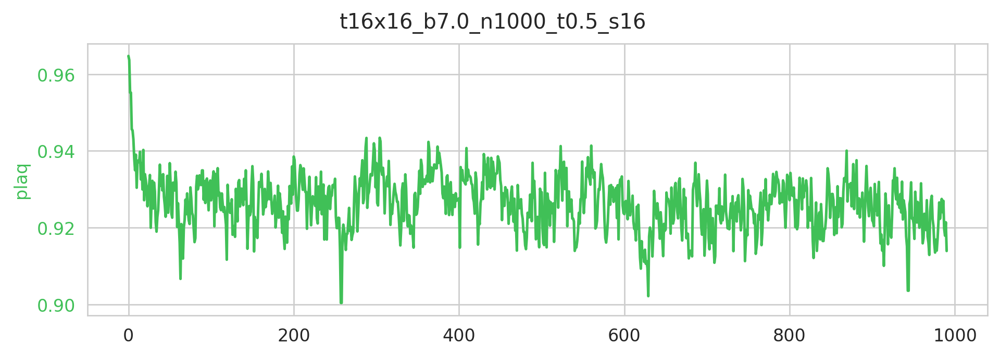

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

[13:23:29]  plaq=1.000 q=0.000

[13:23:30]  traj=2 dt=0.010 acc=1.000 dH=-0.060 plaq=0.964 q=0 dq=0.000

[13:23:37]  traj=102 dt=0.010 acc=1.000 dH=0.017 plaq=0.928 q=0 dq=0.000

[13:23:44]  traj=202 dt=0.010 acc=1.000 dH=0.009 plaq=0.938 q=0 dq=0.000

[13:23:51]  traj=302 dt=0.011 acc=1.000 dH=-0.057 plaq=0.926 q=0 dq=0.000

[13:23:58]  traj=402 dt=0.010 acc=1.000 dH=-0.043 plaq=0.915 q=0 dq=0.000

[13:24:05]  traj=502 dt=0.010 acc=1.000 dH=-0.075 plaq=0.920 q=0 dq=0.000

[13:24:13]  traj=602 dt=0.010 acc=1.000 dH=-0.010 plaq=0.927 q=0 dq=0.000

[13:24:20]  traj=702 dt=0.010 acc=1.000 dH=-0.029 plaq=0.929 q=0 dq=0.000

[13:24:28]  traj=802 dt=0.010 acc=1.000 dH=0.091 plaq=0.934 q=0 dq=0.000

[13:24:35]  traj=902 dt=0.010 acc=1.000 dH=-0.010 plaq=0.921 q=0 dq=0.000

[13:24:42]  Creating directory:                                                              
            ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s16/plots/run0

[13:24:42]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.
            0/t16x16_b7.0_n1000_t0.5_s16/plots/run0/traj.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.
            0/t16x16_b7.0_n1000_t0.5_s16/plots/run0/dt.png

[13:24:43]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.
            0/t16x16_b7.0_n1000_t0.5_s16/plots/run0/acc.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.
            0/t16x16_b7.0_n1000_t0.5_s16/plots/run0/dH.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.
            0/t16x16_b7.0_n1000_t0.5_s16/plots/run0/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.
            0/t16x16_b7.0_n1000_t0.5_s16/plots/run0/q.png

[13:24:44]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat16x16/beta7.
            0/t16x16_b7.0_n1000_t0.5_s16/plots/run0/dq.png

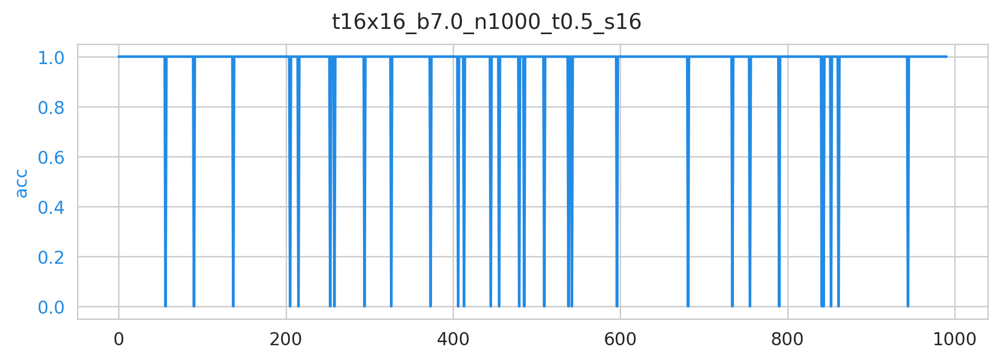

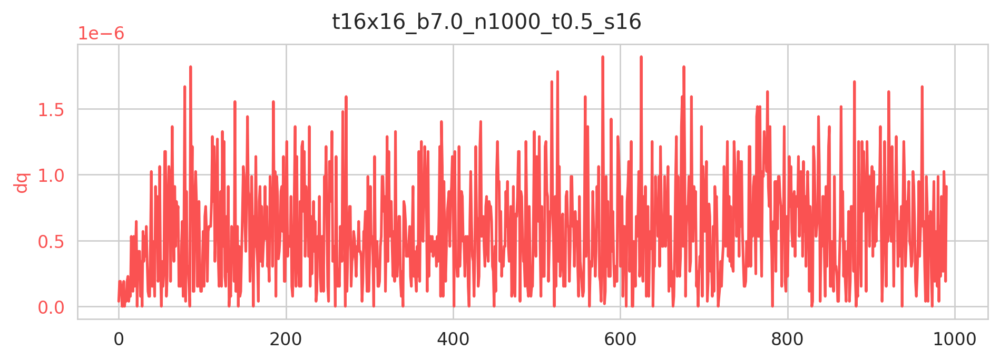

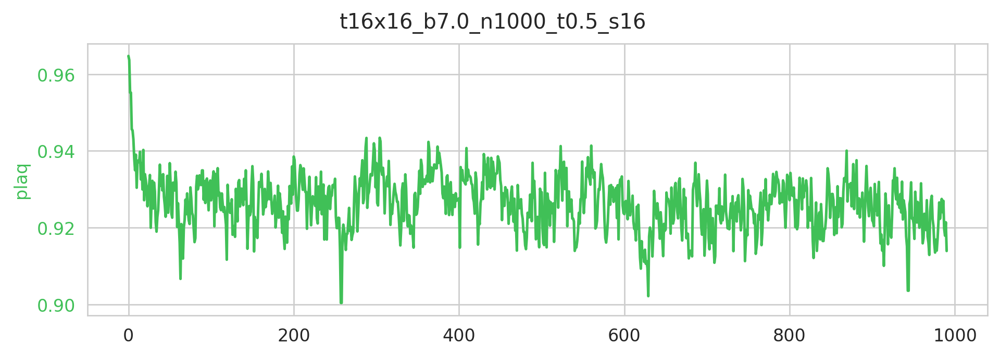

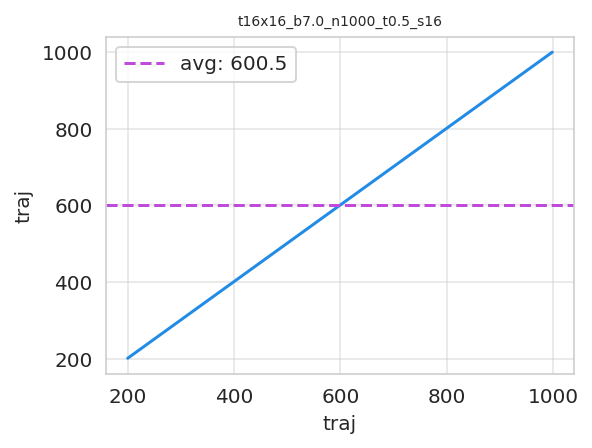

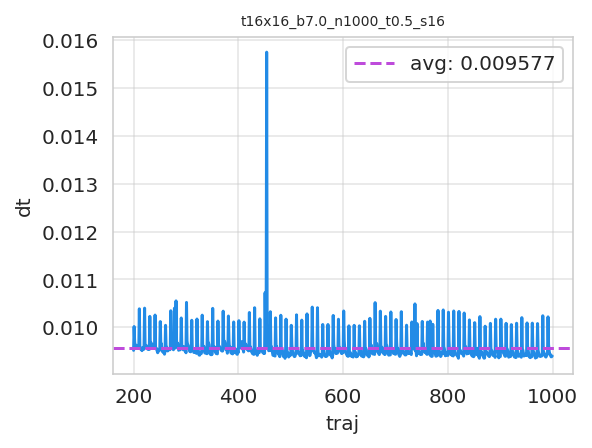

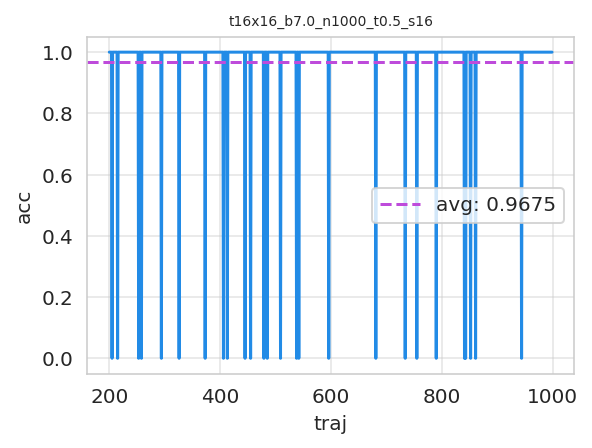

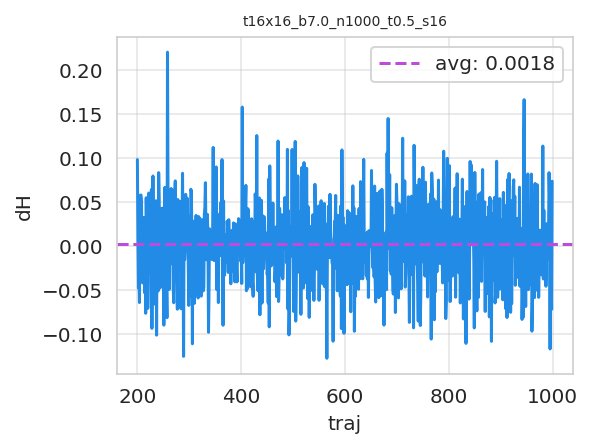

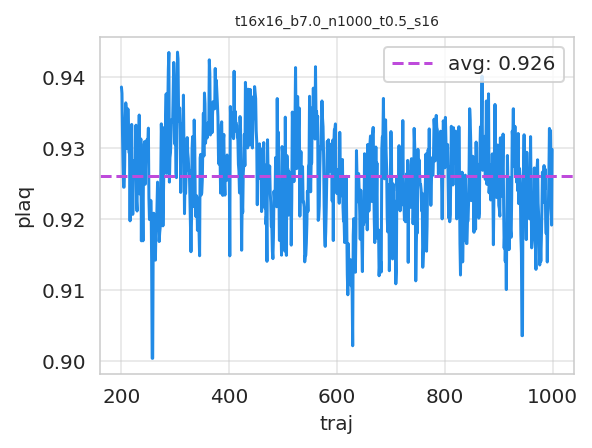

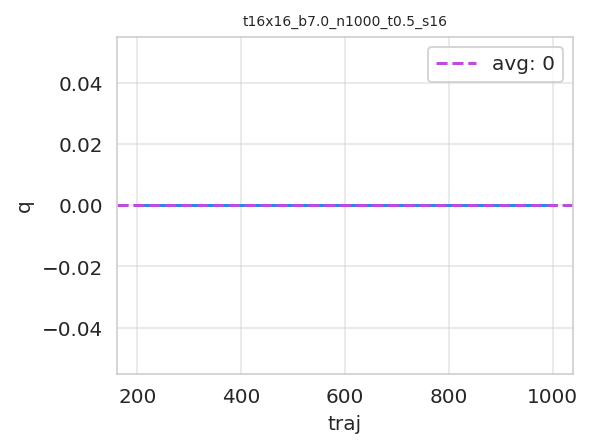

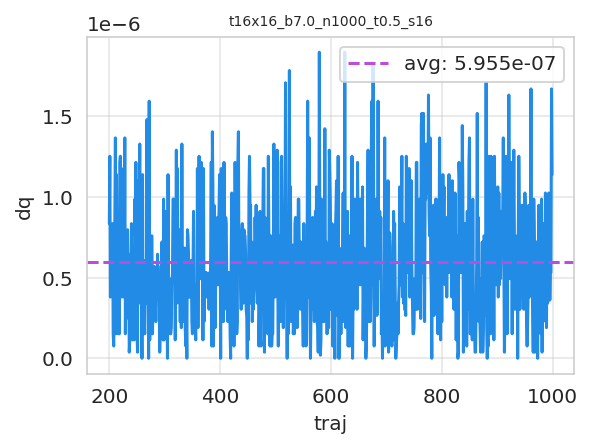

[13:24:45]  Run times: ['73.2624']

            Per trajectory: ['0.0733']

[13:24:45]  Saving hmc_histories to                                                          
            ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s16/hmc_histories.z.

[13:24:46]  Saving hmc_fields_arr to                                                         
            ../../logs/hmc/lat16x16/beta7.0/t16x16_b7.0_n1000_t0.5_s16/hmc_fields_arr.z.

───────────────────── Training FlowModel for 10 era, each of 100 epochs ─────────────────────

[13:24:46]  TrainConfig:                                                                     
            ------------                                                                     
            L=16                                                                             
            beta=7.0                                                                         
            restore=False                                                                    
            activation_fn=silu                                                               
            n_era=10                                                                         
            n_epoch=100                                                                      
            batch_size=1024                                                                  
            base_lr=0.001                                                                    
            n_s_nets=2                                                                       
            n_layers=16                                                                      
            kernel_size=3                                                                    
            with_force=False                                                                 
            print_freq=500                                                                   
            plot_freq=100                                                                    
            log_freq=100                                                                     
            hidden_sizes=[8, 8]                                                              
            lat=[16, 16]                                                                     
            nd=2                                                                             
            shape=[2, 16, 16]                                                                
            volume=256                                                                       
            logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7.0_
            nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0
            /L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100                
            dirs:                                                                            
            -----                                                                            
            logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7.0_
            nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0
            /L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100                
            training=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7.
            0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7
            .0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training     
            inference=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7
            .0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta
            7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/inference   
            ckpts=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7.0_n
            b1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/
            L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/checkpo
            ints

[13:24:46]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024_act
            silu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-132446

[13:24:46]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024_act
            silu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-132446/plots

[13:24:46]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024_act
            silu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-132446/checkpoi
            nts

[13:24:46]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024_act
            silu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-132446/summarie
            s

[13:24:47]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/summaries

            Scheduler created!

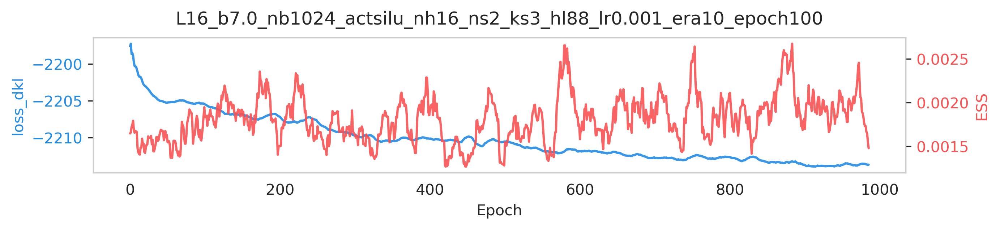

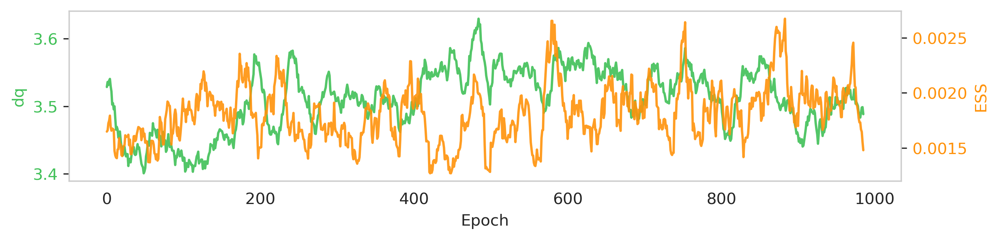

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[13:24:59]  epoch=100 dt=0.089 ess=0.003 logp=1615.590 logq=-589.865 loss_dkl=-2205.456      
            dq=3.291 plaq=0.902

[13:24:59]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era0-epoch99.tar

───────────────────────────── ERA=1, last took: 0 min 11.75 sec ─────────────────────────────

[13:25:09]  epoch=200 dt=0.089 ess=0.001 logp=1615.306 logq=-591.780 loss_dkl=-2207.086      
            dq=3.522 plaq=0.901

[13:25:10]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era1-epoch99.tar

───────────────────────────── ERA=2, last took: 0 min 9.749 sec ─────────────────────────────

[13:25:19]  epoch=300 dt=0.089 ess=0.001 logp=1618.811 logq=-590.191 loss_dkl=-2209.002      
            dq=3.577 plaq=0.903

[13:25:20]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era2-epoch99.tar

───────────────────────────── ERA=3, last took: 0 min 9.772 sec ─────────────────────────────

[13:25:29]  epoch=400 dt=0.090 ess=0.002 logp=1617.169 logq=-592.415 loss_dkl=-2209.583      
            dq=3.480 plaq=0.902

[13:25:30]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era3-epoch99.tar

───────────────────────────── ERA=4, last took: 0 min 9.803 sec ─────────────────────────────

[13:25:39]  epoch=500 dt=0.090 ess=0.001 logp=1617.749 logq=-592.773 loss_dkl=-2210.522      
            dq=3.328 plaq=0.903

[13:25:40]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era4-epoch99.tar

───────────────────────────── ERA=5, last took: 0 min 9.772 sec ─────────────────────────────

[13:25:51]  epoch=600 dt=0.090 ess=0.004 logp=1619.163 logq=-592.679 loss_dkl=-2211.843      
            dq=3.530 plaq=0.904

[13:25:52]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era5-epoch99.tar

───────────────────────────── ERA=6, last took: 0 min 9.886 sec ─────────────────────────────

[13:26:01]  epoch=700 dt=0.091 ess=0.002 logp=1616.651 logq=-595.177 loss_dkl=-2211.828      
            dq=3.510 plaq=0.902

[13:26:02]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era6-epoch99.tar

───────────────────────────── ERA=7, last took: 0 min 9.844 sec ─────────────────────────────

[13:26:11]  epoch=800 dt=0.090 ess=0.001 logp=1618.606 logq=-593.265 loss_dkl=-2211.872      
            dq=3.458 plaq=0.903

[13:26:12]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era7-epoch99.tar

───────────────────────────── ERA=8, last took: 0 min 9.86 sec ──────────────────────────────

[13:26:21]  epoch=900 dt=0.090 ess=0.003 logp=1620.112 logq=-593.370 loss_dkl=-2213.483      
            dq=3.537 plaq=0.904

[13:26:22]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era8-epoch99.tar

───────────────────────────── ERA=9, last took: 0 min 9.821 sec ─────────────────────────────

[13:26:31]  epoch=1000 dt=0.091 ess=0.001 logp=1618.507 logq=-594.642 loss_dkl=-2213.149     
            dq=3.368 plaq=0.903

[13:26:32]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era9-epoch99.tar

            Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/checkpoints/ckpt-era10-epoch101.tar

[13:26:32]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            training/2021-07-12-132446/plots

[13:26:33]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/ess.png

[13:26:34]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/loss_dkl.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/q.png

[13:26:35]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/dq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/trai
            ning/2021-07-12-132446/plots/plaq.png

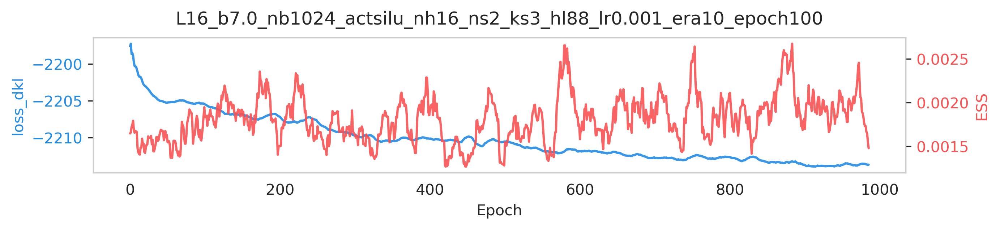

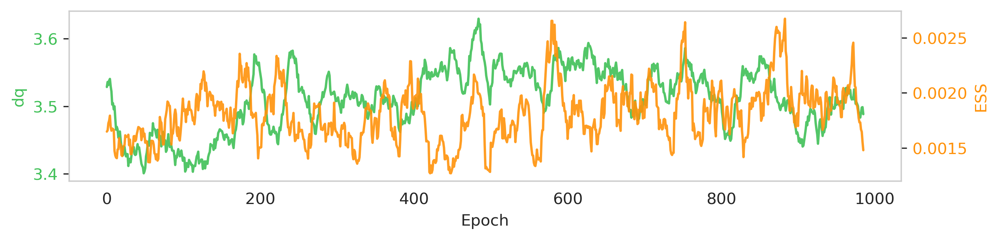

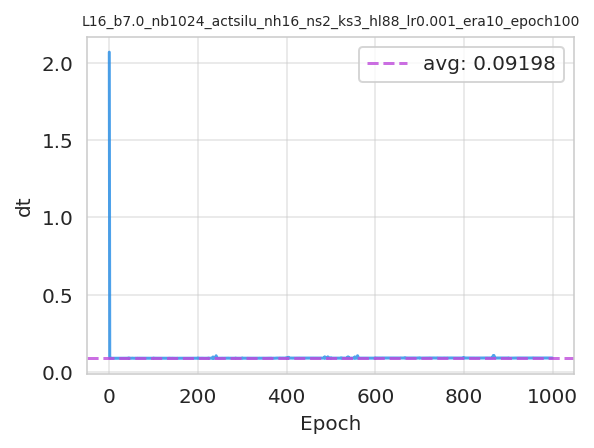

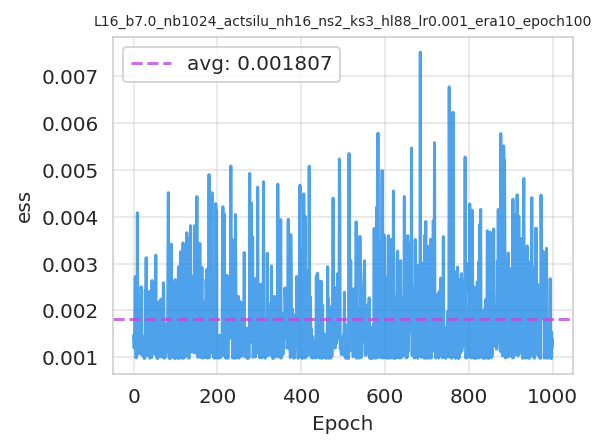

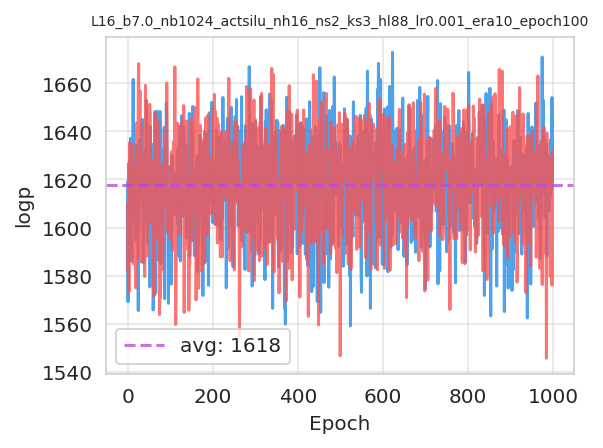

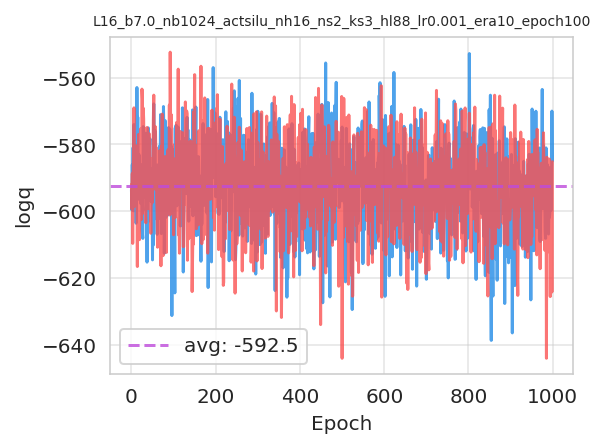

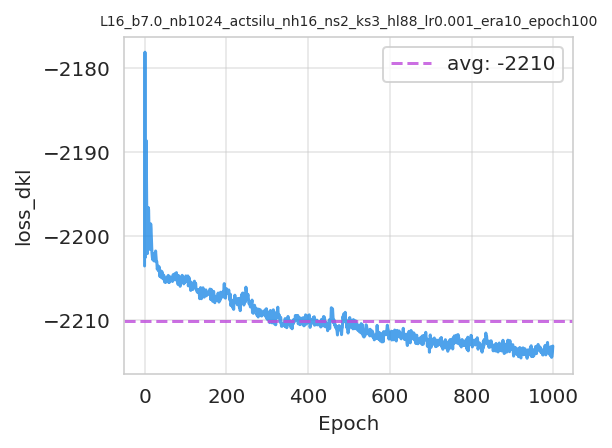

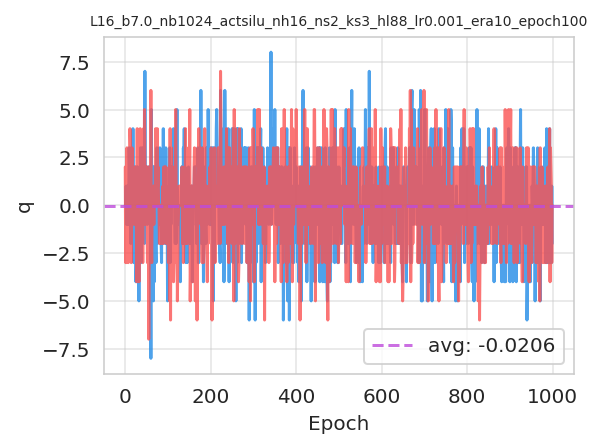

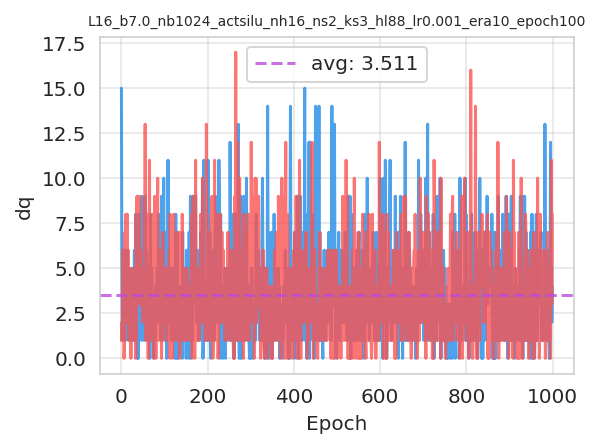

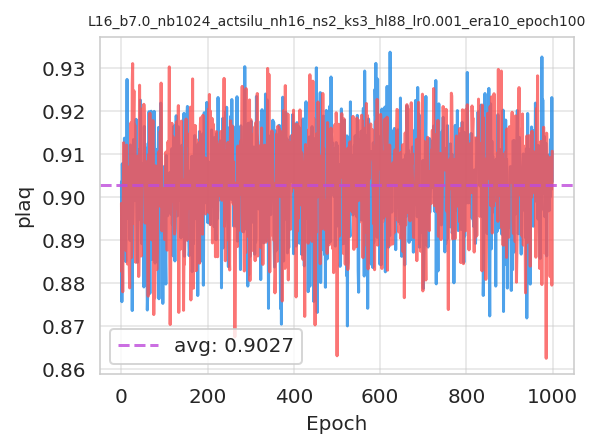

[13:26:37]  Saving train_history to ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_n
            h16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024
            _actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-12-132446/trai
            n_history.z.

─────────────────────── Using trained model to generate 8192 samples ────────────────────────

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/utils/inference.py:116: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[13:26:41]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024_act
            silu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/inference/plots

[13:26:41]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/infe
            rence/plots/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/infe
            rence/plots/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/infe
            rence/plots/accepted.png

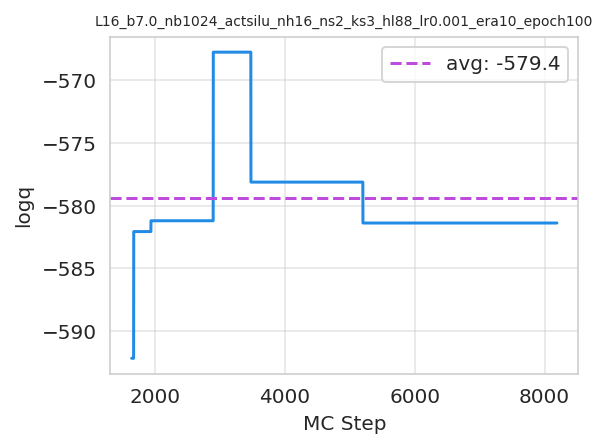

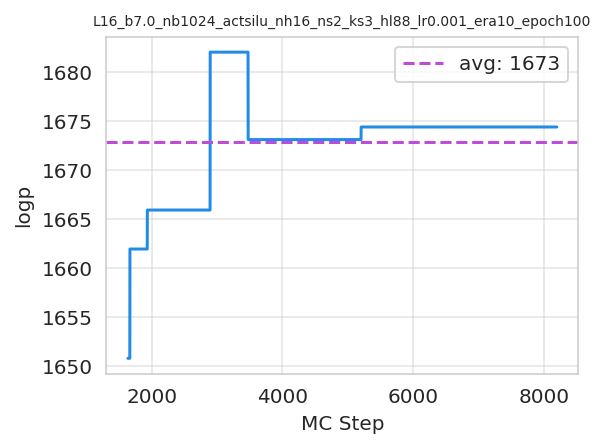

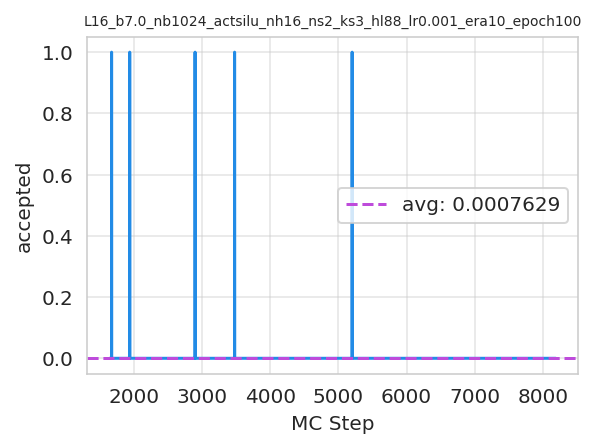

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[13:26:43]  Running ftHMC with tau=1.0, nsteps=10

            plaq=0.714 q=3.000

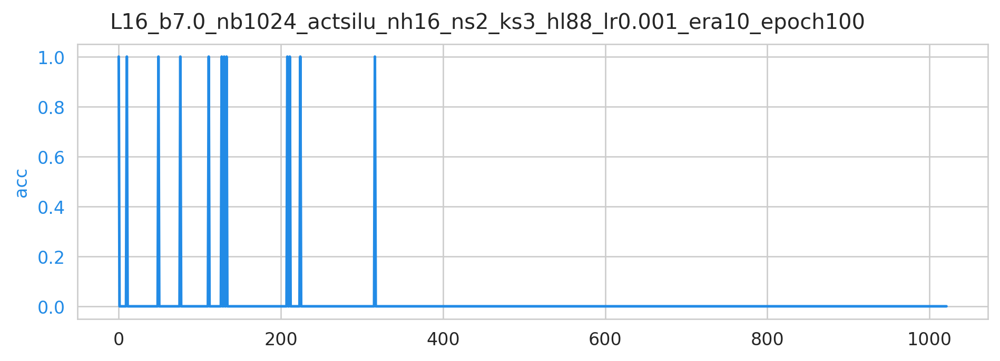

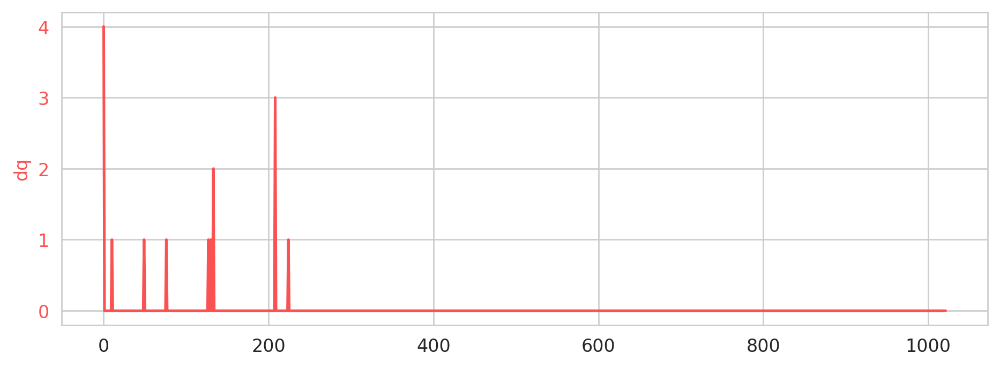

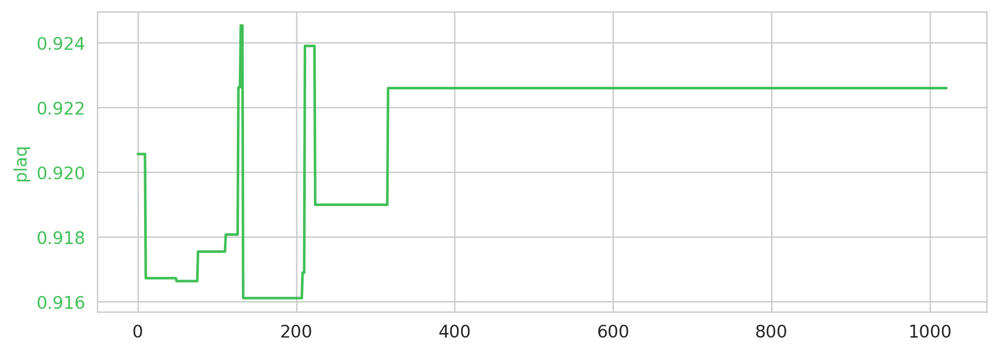

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[13:26:44]  traj=0 dt=0.925 acc=1.000 dh=-20.951 plaq=0.921 q=-1.000 dq=4.000

[13:27:30]  traj=50 dt=0.826 acc=0.000 dh=23.284 plaq=0.917 q=-1.000 dq=0.000

[13:28:17]  traj=100 dt=0.832 acc=0.000 dh=16.025 plaq=0.918 q=0.000 dq=0.000

[13:29:03]  traj=150 dt=0.831 acc=0.000 dh=5.265 plaq=0.916 q=2.000 dq=0.000

[13:29:49]  traj=200 dt=0.832 acc=0.000 dh=44.596 plaq=0.916 q=2.000 dq=0.000

[13:30:36]  traj=250 dt=0.833 acc=0.000 dh=10.748 plaq=0.919 q=0.000 dq=0.000

[13:31:22]  traj=300 dt=0.834 acc=0.000 dh=2.109 plaq=0.919 q=0.000 dq=0.000

[13:32:09]  traj=350 dt=0.834 acc=0.000 dh=22.566 plaq=0.923 q=0.000 dq=0.000

[13:32:55]  traj=400 dt=0.834 acc=0.000 dh=33.578 plaq=0.923 q=0.000 dq=0.000

[13:33:42]  traj=450 dt=0.834 acc=0.000 dh=12.879 plaq=0.923 q=0.000 dq=0.000

[13:34:28]  traj=500 dt=0.835 acc=0.000 dh=28.372 plaq=0.923 q=0.000 dq=0.000

[13:35:15]  traj=550 dt=0.835 acc=0.000 dh=11.386 plaq=0.923 q=0.000 dq=0.000

[13:36:02]  traj=600 dt=0.836 acc=0.000 dh=26.467 plaq=0.923 q=0.000 dq=0.000

[13:36:48]  traj=650 dt=0.837 acc=0.000 dh=30.793 plaq=0.923 q=0.000 dq=0.000

[13:37:35]  traj=700 dt=0.837 acc=0.000 dh=23.033 plaq=0.923 q=0.000 dq=0.000

[13:38:22]  traj=750 dt=0.838 acc=0.000 dh=19.497 plaq=0.923 q=0.000 dq=0.000

[13:39:09]  traj=800 dt=0.837 acc=0.000 dh=8.932 plaq=0.923 q=0.000 dq=0.000

[13:39:56]  traj=850 dt=0.838 acc=0.000 dh=18.131 plaq=0.923 q=0.000 dq=0.000

[13:40:43]  traj=900 dt=0.837 acc=0.000 dh=16.401 plaq=0.923 q=0.000 dq=0.000

[13:41:29]  traj=950 dt=0.838 acc=0.000 dh=14.590 plaq=0.923 q=0.000 dq=0.000

[13:42:16]  traj=1000 dt=0.839 acc=0.000 dh=41.644 plaq=0.923 q=0.000 dq=0.000

[13:42:38]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024_act
            silu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t1.0_s10_dt0.1/plots

[13:42:38]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            ftHMC/t1.0_s10_dt0.1/plots

[13:42:39]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t1.0_s10_dt0.1/plots/traj.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t1.0_s10_dt0.1/plots/dt.png

[13:42:40]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t1.0_s10_dt0.1/plots/acc.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t1.0_s10_dt0.1/plots/dh.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t1.0_s10_dt0.1/plots/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t1.0_s10_dt0.1/plots/q.png

[13:42:41]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t1.0_s10_dt0.1/plots/dq.png

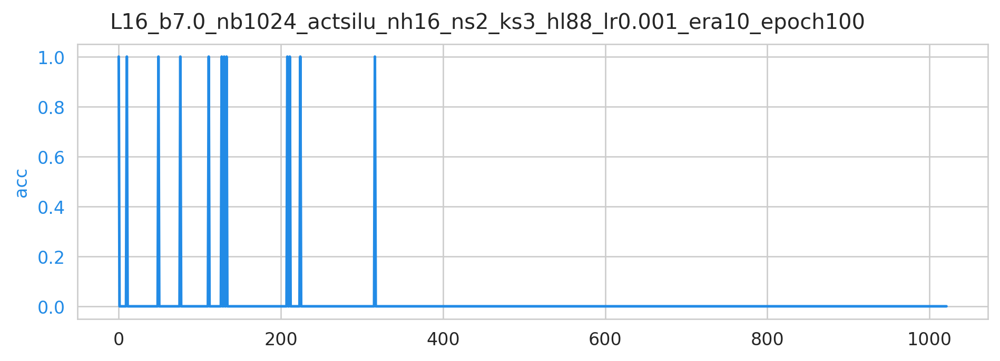

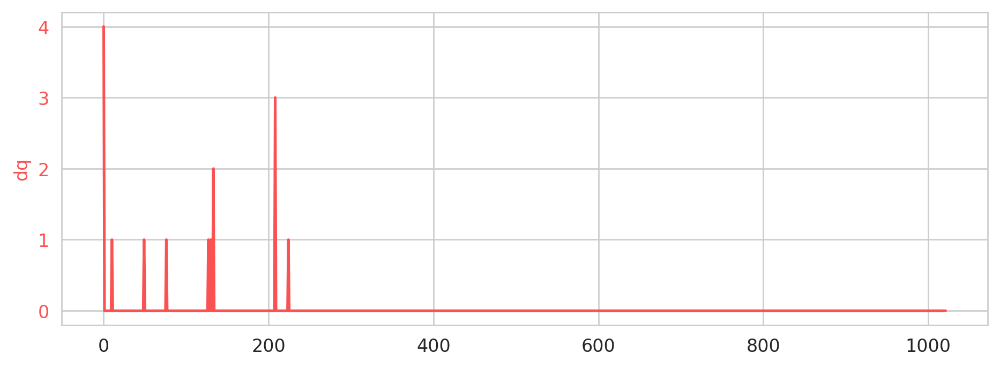

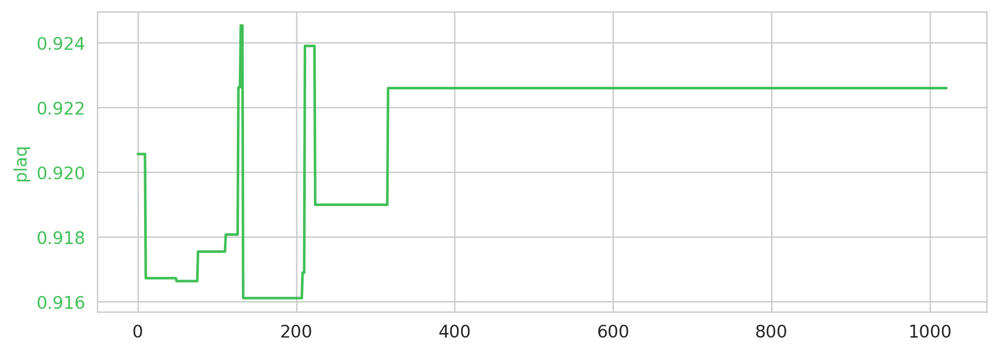

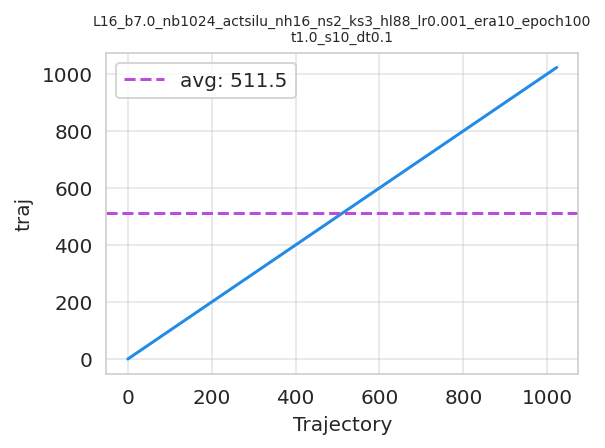

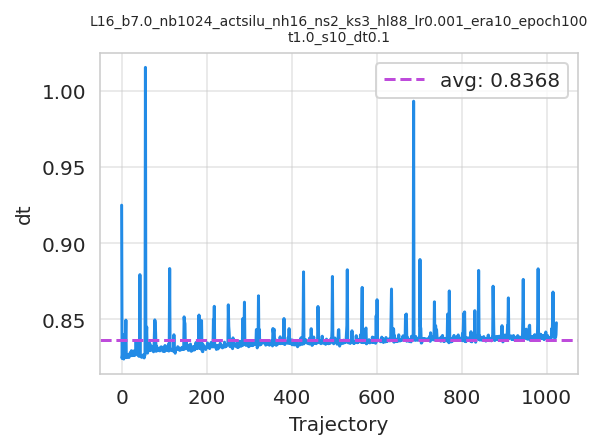

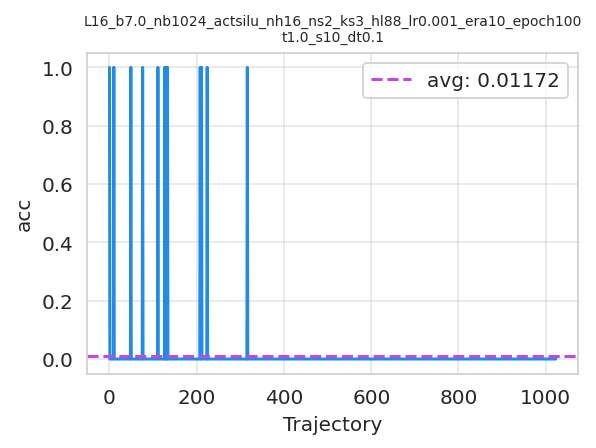

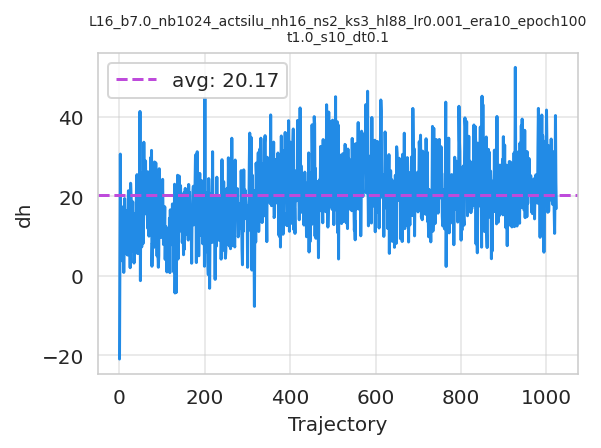

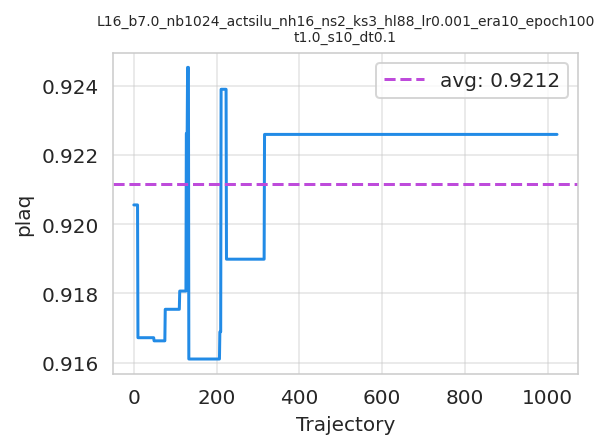

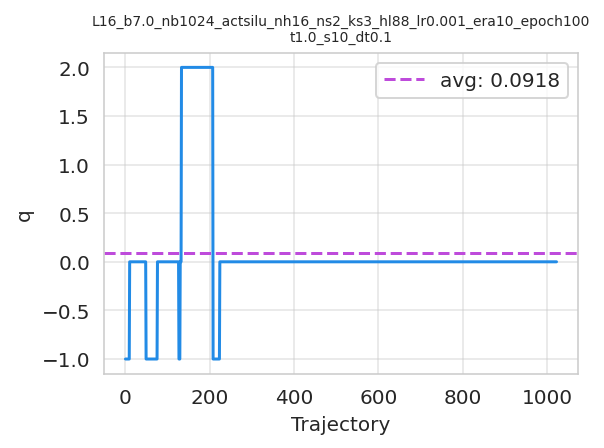

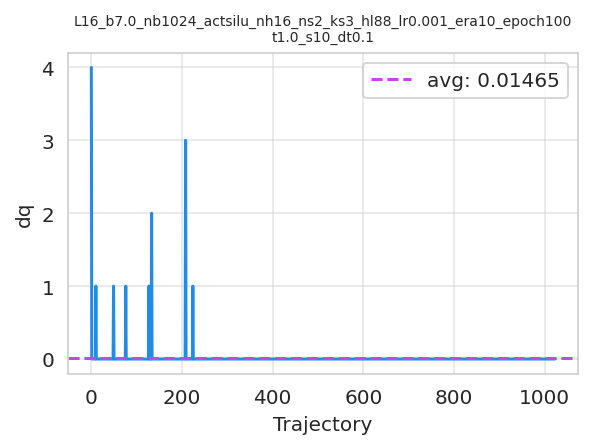

In [16]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=1.0, nstep=10)
Lnew = 2 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[13:43:03]  Running ftHMC with tau=0.1, nsteps=5

            plaq=0.713 q=-1.000

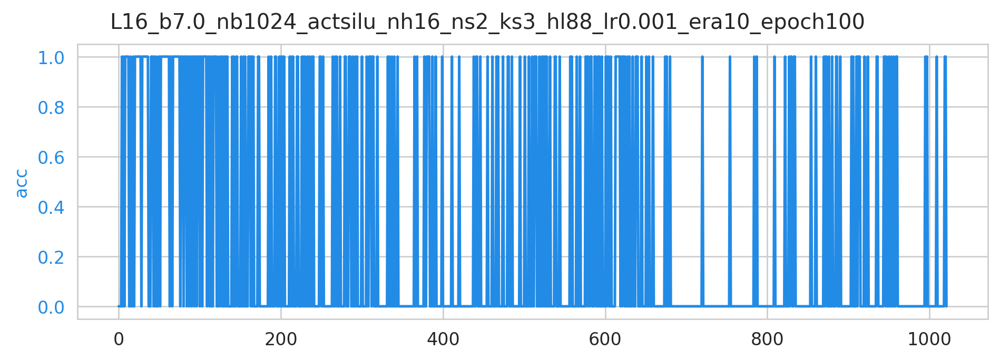

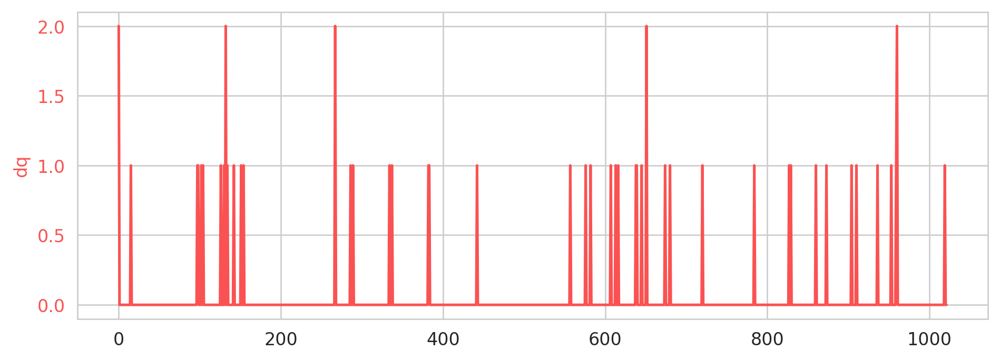

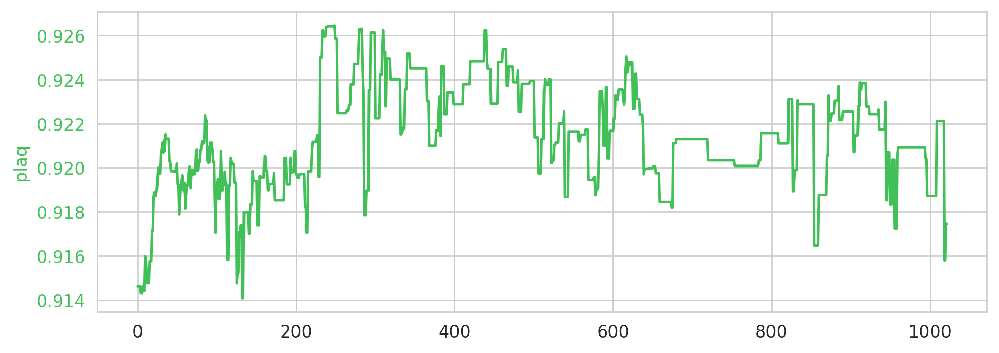

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[13:43:04]  traj=0 dt=0.453 acc=0.000 dh=3.546 plaq=0.915 q=-3.000 dq=2.000

[13:43:31]  traj=50 dt=0.445 acc=1.000 dh=0.535 plaq=0.919 q=-2.000 dq=0.000

[13:43:59]  traj=100 dt=0.449 acc=0.000 dh=1.485 plaq=0.919 q=-2.000 dq=0.000

[13:44:26]  traj=150 dt=0.447 acc=0.000 dh=6.369 plaq=0.919 q=-0.000 dq=0.000

[13:44:53]  traj=200 dt=0.447 acc=1.000 dh=0.074 plaq=0.920 q=0.000 dq=0.000

[13:45:21]  traj=250 dt=0.447 acc=0.000 dh=5.370 plaq=0.926 q=-0.000 dq=0.000

[13:45:48]  traj=300 dt=0.448 acc=1.000 dh=1.953 plaq=0.922 q=-2.000 dq=0.000

[13:46:16]  traj=350 dt=0.465 acc=0.000 dh=9.180 plaq=0.925 q=-2.000 dq=0.000

[13:46:43]  traj=400 dt=0.447 acc=0.000 dh=5.772 plaq=0.923 q=-2.000 dq=0.000

[13:47:11]  traj=450 dt=0.449 acc=0.000 dh=3.459 plaq=0.923 q=-1.000 dq=0.000

[13:47:38]  traj=500 dt=0.456 acc=0.000 dh=20.940 plaq=0.924 q=-1.000 dq=0.000

[13:48:06]  traj=550 dt=0.448 acc=0.000 dh=3.090 plaq=0.922 q=-1.000 dq=0.000

[13:48:33]  traj=600 dt=0.446 acc=0.000 dh=1.734 plaq=0.922 q=-2.000 dq=0.000

[13:49:01]  traj=650 dt=0.448 acc=0.000 dh=3.359 plaq=0.920 q=0.000 dq=0.000

[13:49:28]  traj=700 dt=0.447 acc=0.000 dh=4.495 plaq=0.921 q=0.000 dq=0.000

[13:49:56]  traj=750 dt=0.447 acc=0.000 dh=11.007 plaq=0.920 q=-1.000 dq=0.000

[13:50:24]  traj=800 dt=0.448 acc=0.000 dh=7.490 plaq=0.922 q=0.000 dq=0.000

[13:50:52]  traj=850 dt=0.447 acc=0.000 dh=2.275 plaq=0.923 q=-0.000 dq=0.000

[13:51:19]  traj=900 dt=0.449 acc=0.000 dh=0.405 plaq=0.923 q=-0.000 dq=0.000

[13:51:47]  traj=950 dt=0.448 acc=1.000 dh=0.069 plaq=0.918 q=-1.000 dq=0.000

[13:52:14]  traj=1000 dt=0.449 acc=0.000 dh=7.095 plaq=0.919 q=1.000 dq=0.000

[13:52:28]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_
            ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/beta7.0/L16_b7.0_nb1024_act
            silu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHMC/t0.1_s5_dt0.02/plots

[13:52:28]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferre
            d_16x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/
            ftHMC/t0.1_s5_dt0.02/plots

[13:52:29]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t0.1_s5_dt0.02/plots/traj.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t0.1_s5_dt0.02/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t0.1_s5_dt0.02/plots/acc.png

[13:52:30]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t0.1_s5_dt0.02/plots/dh.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t0.1_s5_dt0.02/plots/plaq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t0.1_s5_dt0.02/plots/q.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7
            .0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16
            x16/beta7.0/L16_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/ftHM
            C/t0.1_s5_dt0.02/plots/dq.png

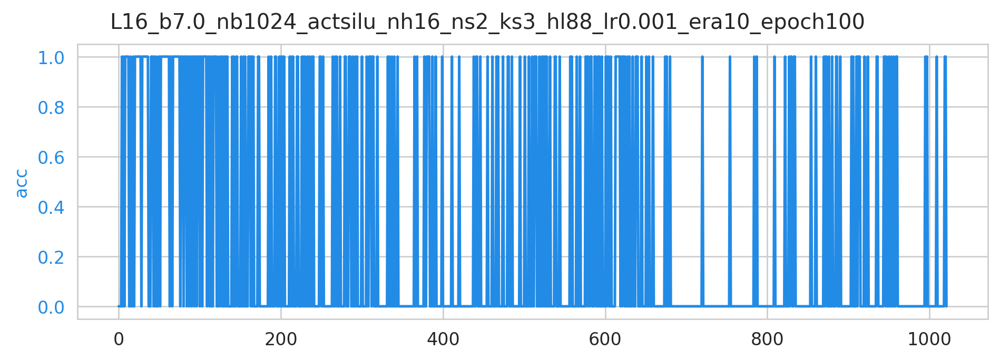

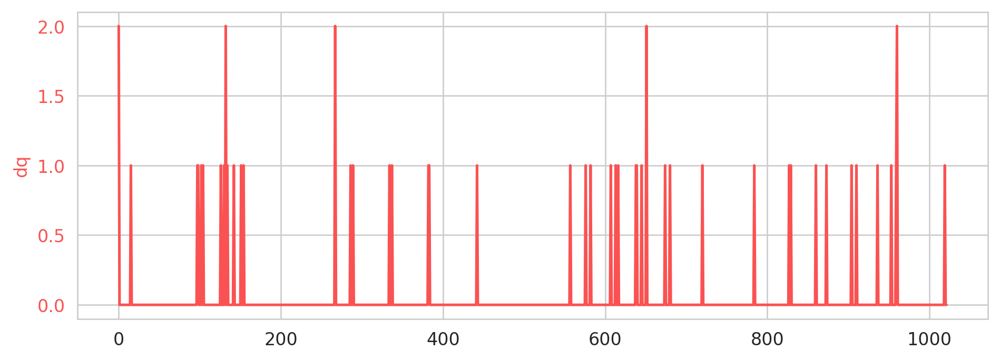

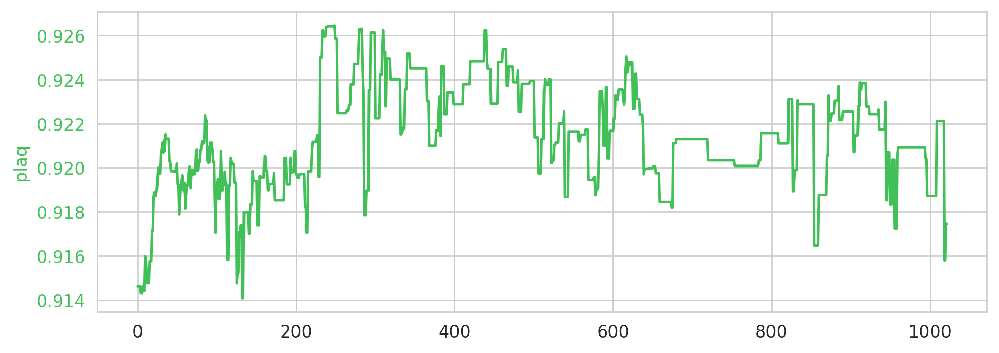

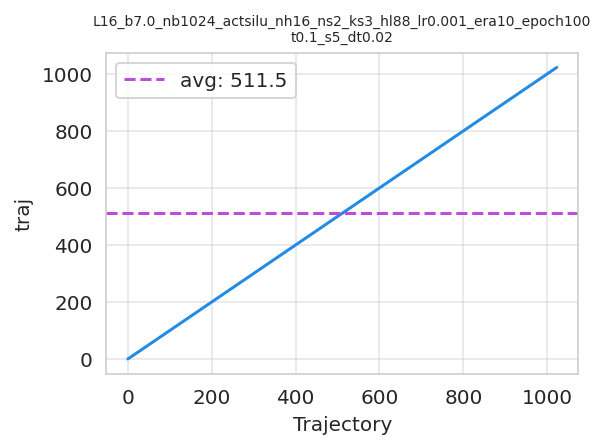

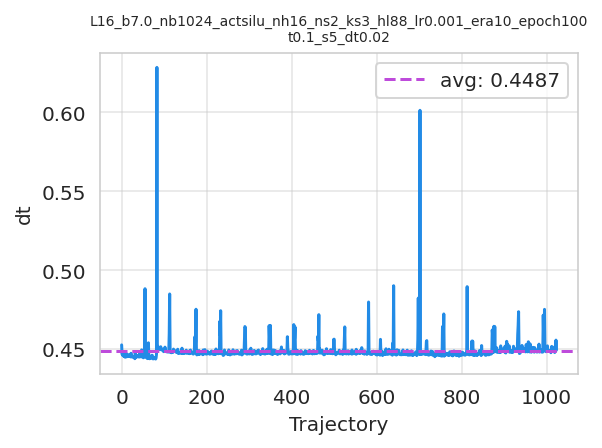

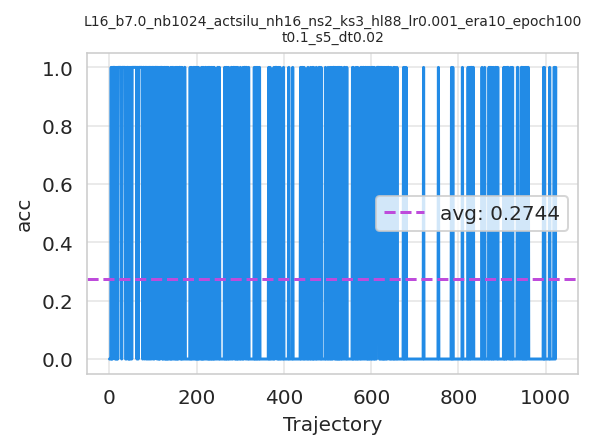

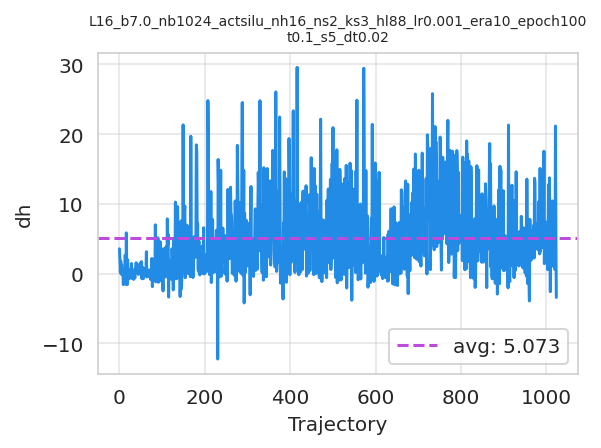

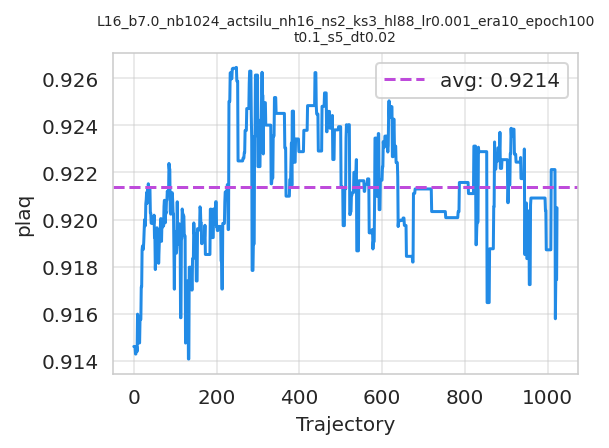

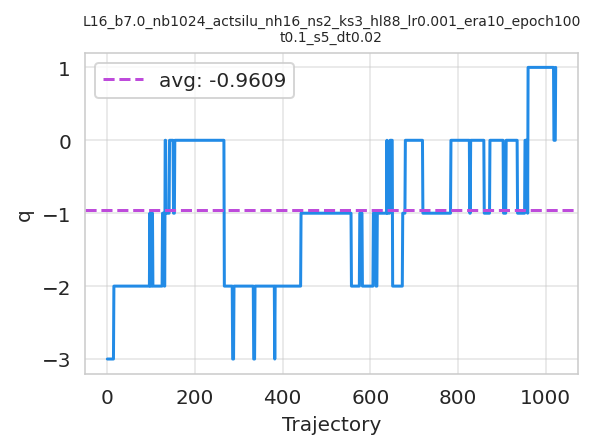

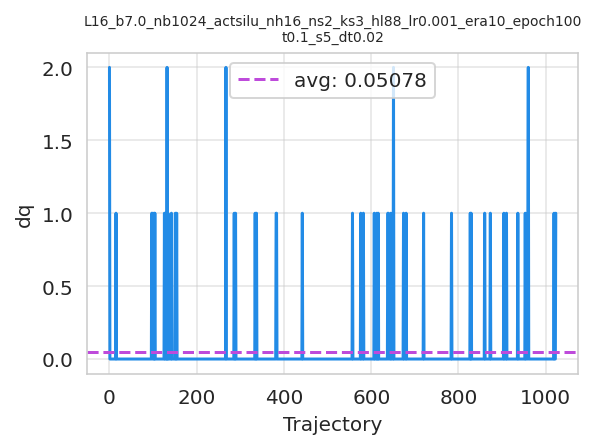

In [17]:
config16 = transfer_out['config']
model16 = transfer_out['model']
flow16 = model16.layers
ftconfig16 = ftConfig(tau=0.1, nstep=5)
fthmc_outputs16 = run_fthmc(flow=flow16,
                            num_trajs=1024,
                            config=config16,
                            ftconfig=ftconfig16)

──────────────────────── Transferring trained model to 32x32 lattice ────────────────────────

───────────────────── Running HMC for 1 runs, each of 1000 trajectories ─────────────────────

[08:13:49 AM]  Creating directory:                                                           
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/plots

[08:13:49 AM]  Param:                                                                        
               ----------------                                                              
               beta=7.0                                                                      
               L=32                                                                          
               tau=0.5                                                                       
               nstep=5                                                                       
               ntraj=1000                                                                    
               nrun=1                                                                        
               nprint=100                                                                    
               seed=1331                                                                     
               randinit=False                                                                
               nth_interop=2                                                                 
               nth=2                                                                         
               lat=[32, 32]                                                                  
               nd=2                                                                          
               shape=[2, 32, 32]                                                             
               volume=1024                                                                   
               dt=0.1                                                                        
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/beta7.0/t32x32
               _b7.0_n1000_t0.5_s5

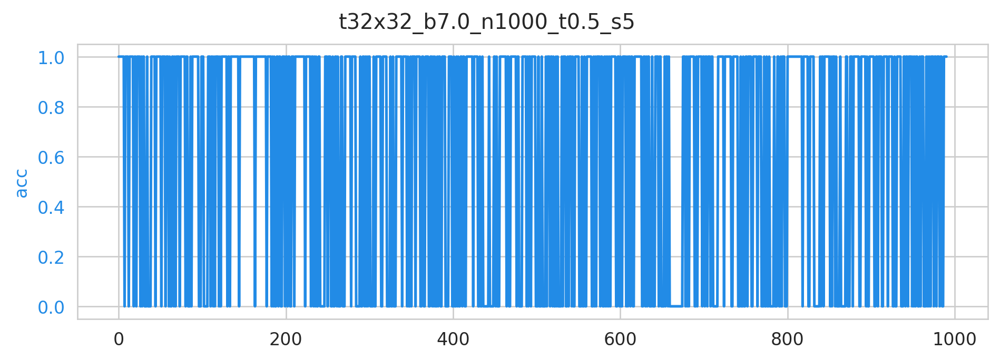

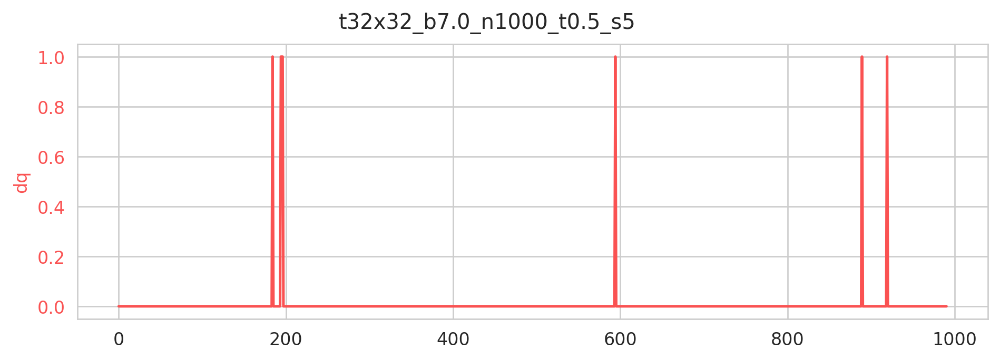

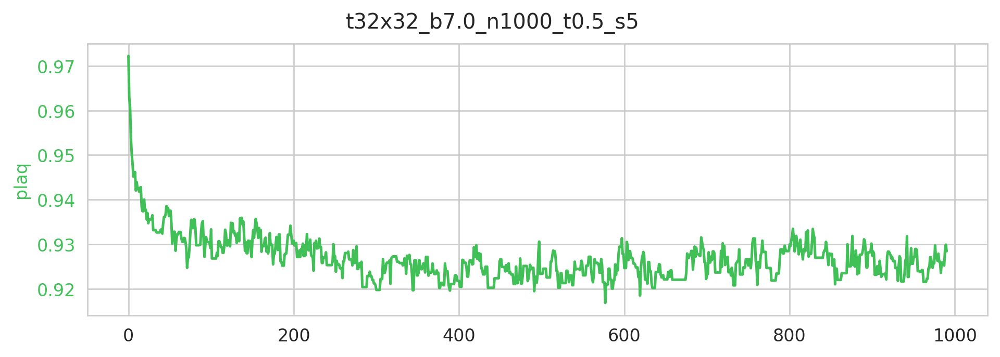

──────────────────────────────── RUN: 0, last took: 0 m 0 s ─────────────────────────────────

[08:13:51 AM]  plaq=1.000 q=0.000

               traj=2 dt=0.004 acc=1.000 dH=-4.568 plaq=0.963 q=0 dq=0.000

[08:13:58 AM]  traj=102 dt=0.004 acc=1.000 dH=-2.783 plaq=0.927 q=0 dq=0.000

[08:14:04 AM]  traj=202 dt=0.004 acc=1.000 dH=-0.108 plaq=0.930 q=1 dq=0.000

[08:14:11 AM]  traj=302 dt=0.004 acc=0.000 dH=1.275 plaq=0.920 q=1 dq=0.000

[08:14:18 AM]  traj=402 dt=0.004 acc=1.000 dH=0.604 plaq=0.920 q=1 dq=0.000

[08:14:25 AM]  traj=502 dt=0.004 acc=0.000 dH=1.971 plaq=0.923 q=1 dq=0.000

[08:14:31 AM]  traj=602 dt=0.004 acc=0.000 dH=0.088 plaq=0.925 q=1 dq=0.000

[08:14:39 AM]  traj=702 dt=0.004 acc=0.000 dH=1.103 plaq=0.923 q=1 dq=0.000

[08:14:46 AM]  traj=802 dt=0.004 acc=1.000 dH=0.435 plaq=0.930 q=1 dq=0.000

[08:14:53 AM]  traj=902 dt=0.004 acc=1.000 dH=-0.104 plaq=0.928 q=1 dq=0.000

[08:14:59 AM]  Creating directory:                                                           
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0

[08:14:59 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/traj.png

[08:15:00 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/dt.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/acc.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/dH.png

[08:15:01 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/plaq.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/q.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/hmc/lat32x32/bet
               a7.0/t32x32_b7.0_n1000_t0.5_s5/plots/run0/dq.png

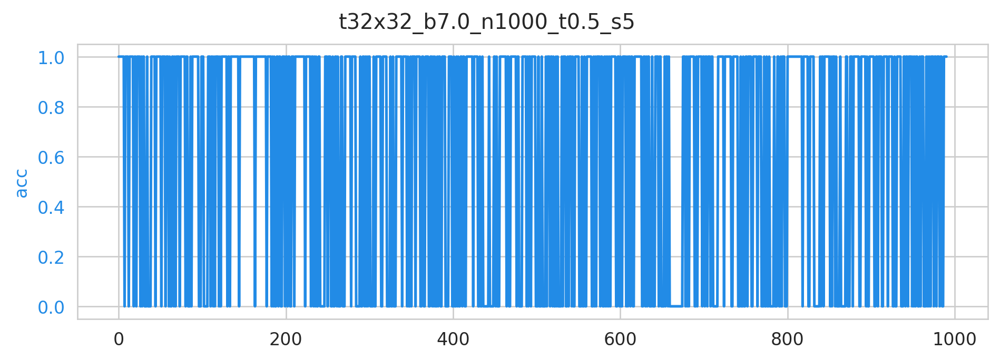

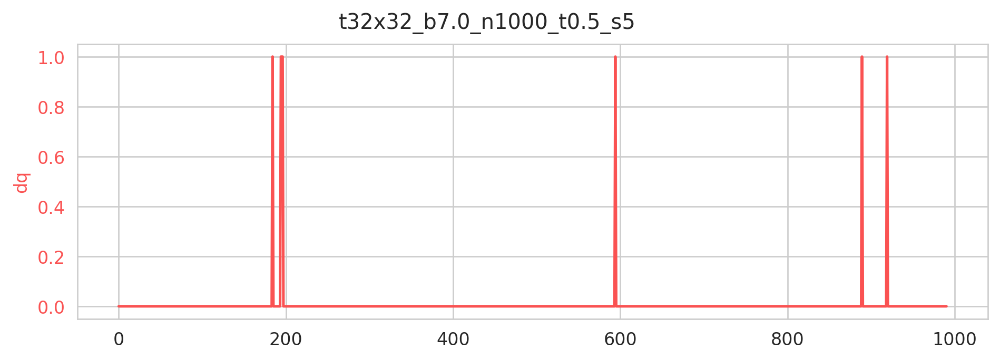

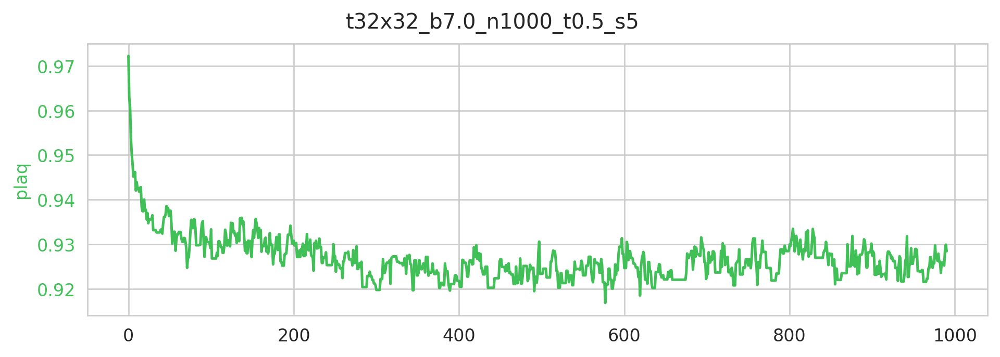

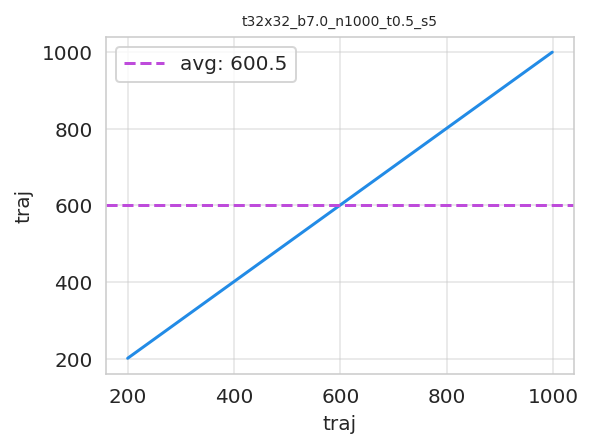

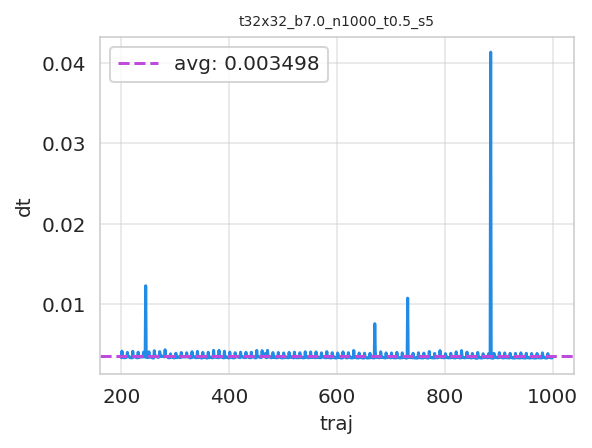

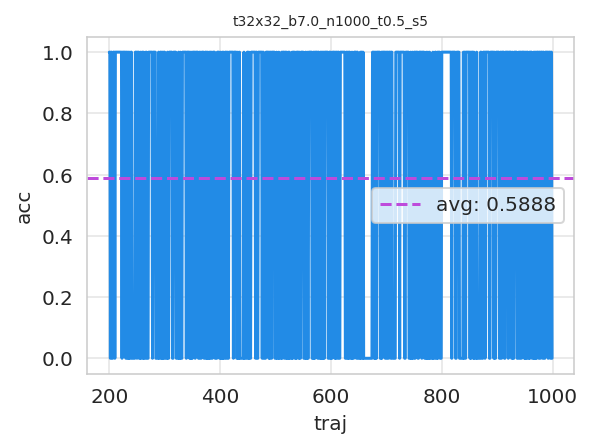

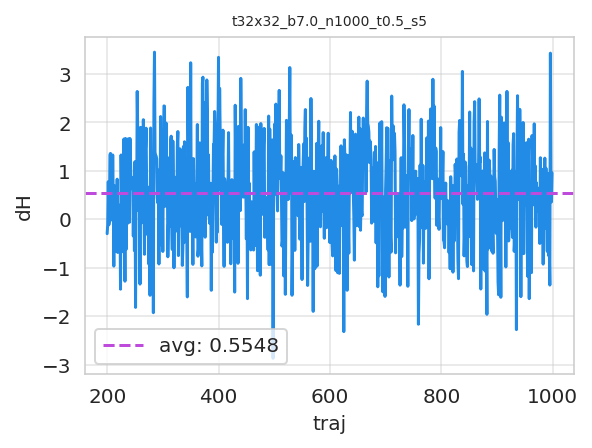

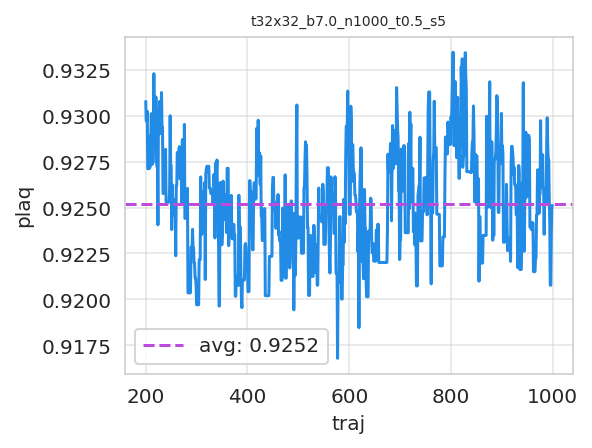

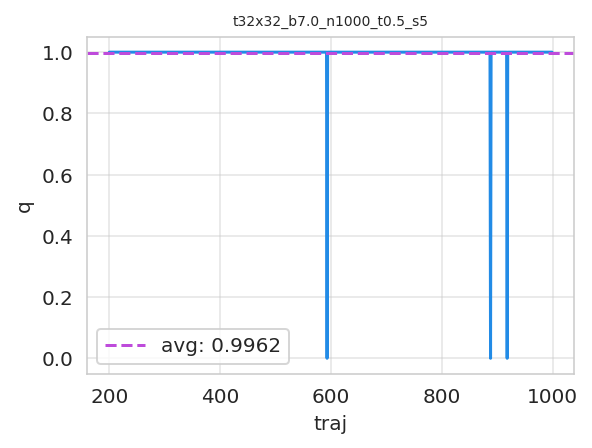

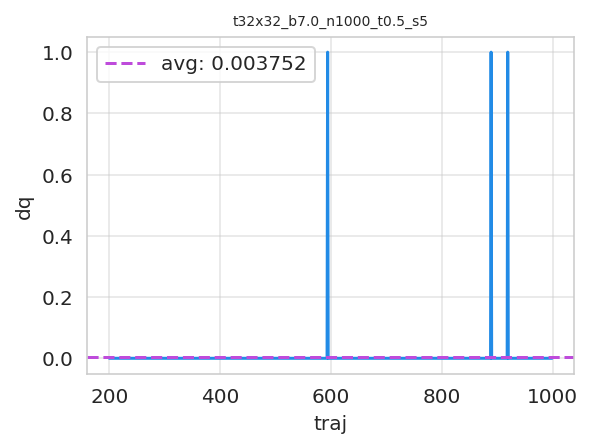

[08:15:03 AM]  Run times: ['68.7831']

               Per trajectory: ['0.0688']

[08:15:03 AM]  Saving hmc_histories to                                                       
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/hmc_histories.z.

[08:15:03 AM]  Saving hmc_fields_arr to                                                      
               ../../logs/hmc/lat32x32/beta7.0/t32x32_b7.0_n1000_t0.5_s5/hmc_fields_arr.z.

──────────────────── Training FlowModel for 10 era, each of 1000 epochs ─────────────────────

[08:15:04 AM]  TrainConfig:                                                                  
               ------------                                                                  
               L=32                                                                          
               beta=7.0                                                                      
               restore=False                                                                 
               activation_fn=silu                                                            
               n_era=10                                                                      
               n_epoch=1000                                                                  
               batch_size=1024                                                               
               base_lr=0.001                                                                 
               n_s_nets=2                                                                    
               n_layers=16                                                                   
               kernel_size=3                                                                 
               with_force=False                                                              
               print_freq=500                                                                
               plot_freq=100                                                                 
               log_freq=100                                                                  
               hidden_sizes=[8, 8]                                                           
               lat=[32, 32]                                                                  
               nd=2                                                                          
               shape=[2, 32, 32]                                                             
               volume=1024                                                                   
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7
               .0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/
               beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000     
               dirs:                                                                         
               -----                                                                         
               logdir=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7
               .0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/
               beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000     
               training=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_
               b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x3
               2/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tr
               aining                                                                        
               inference=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8
               _b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x
               32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/i
               nference                                                                      
               ckpts=/lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta7.0/L8_b7.
               0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/b
               eta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/train
               ing/checkpoints

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04/plots

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04/checkpoints

[08:15:04 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-0815
               04/summaries

[08:15:04 AM]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/summaries

               Scheduler created!

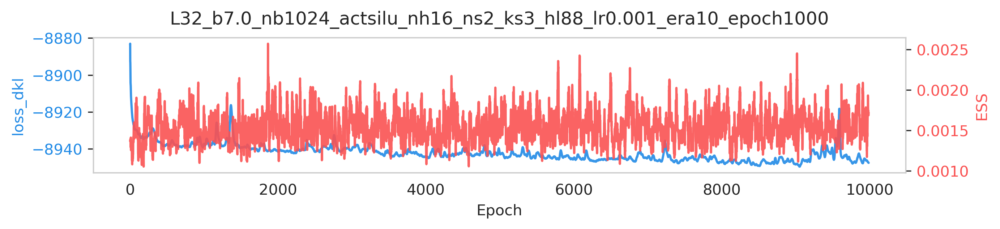

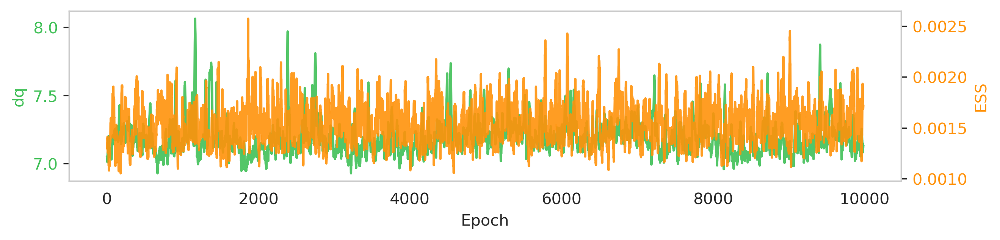

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[08:16:54 AM]  epoch=500 dt=0.201 ess=0.001 logp=6571.128 logq=-2365.863 loss_dkl=-8936.991  
               dq=7.249 plaq=0.917

[08:18:43 AM]  epoch=1000 dt=0.201 ess=0.004 logp=6578.432 logq=-2358.962 loss_dkl=-8937.395 
               dq=7.150 plaq=0.918

[08:18:44 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era0-epoch999.tar

───────────────────────────── ERA=1, last took: 3 min 39.42 sec ─────────────────────────────

[08:20:33 AM]  epoch=1500 dt=0.200 ess=0.001 logp=6575.519 logq=-2364.321 loss_dkl=-8939.840 
               dq=7.065 plaq=0.917

[08:22:23 AM]  epoch=2000 dt=0.200 ess=0.003 logp=6573.559 logq=-2367.348 loss_dkl=-8940.906 
               dq=7.362 plaq=0.917

[08:22:23 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era1-epoch999.tar

───────────────────────────── ERA=2, last took: 3 min 39.32 sec ─────────────────────────────

[08:24:15 AM]  epoch=2500 dt=0.201 ess=0.001 logp=6581.884 logq=-2360.120 loss_dkl=-8942.004 
               dq=6.873 plaq=0.918

[08:26:05 AM]  epoch=3000 dt=0.201 ess=0.001 logp=6573.143 logq=-2367.637 loss_dkl=-8940.780 
               dq=6.906 plaq=0.917

[08:26:05 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era2-epoch999.tar

───────────────────────────── ERA=3, last took: 3 min 40.18 sec ─────────────────────────────

[08:27:55 AM]  epoch=3500 dt=0.201 ess=0.003 logp=6575.766 logq=-2366.537 loss_dkl=-8942.303 
               dq=7.081 plaq=0.917

[08:29:46 AM]  epoch=4000 dt=0.201 ess=0.001 logp=6574.759 logq=-2369.250 loss_dkl=-8944.010 
               dq=6.934 plaq=0.917

[08:29:47 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era3-epoch999.tar

───────────────────────────── ERA=4, last took: 3 min 40.7 sec ──────────────────────────────

[08:31:37 AM]  epoch=4500 dt=0.201 ess=0.001 logp=6569.304 logq=-2371.267 loss_dkl=-8940.571 
               dq=7.558 plaq=0.916

[08:33:27 AM]  epoch=5000 dt=0.201 ess=0.001 logp=6577.404 logq=-2363.420 loss_dkl=-8940.824 
               dq=6.926 plaq=0.918

[08:33:28 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era4-epoch999.tar

───────────────────────────── ERA=5, last took: 3 min 40.38 sec ─────────────────────────────

[08:35:19 AM]  epoch=5500 dt=0.201 ess=0.001 logp=6569.011 logq=-2372.507 loss_dkl=-8941.518 
               dq=7.366 plaq=0.916

[08:37:09 AM]  epoch=6000 dt=0.201 ess=0.001 logp=6577.097 logq=-2368.758 loss_dkl=-8945.855 
               dq=6.874 plaq=0.918

[08:37:10 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era5-epoch999.tar

───────────────────────────── ERA=6, last took: 3 min 40.76 sec ─────────────────────────────

[08:39:01 AM]  epoch=6500 dt=0.200 ess=0.002 logp=6582.521 logq=-2363.253 loss_dkl=-8945.775 
               dq=7.257 plaq=0.918

[08:40:51 AM]  epoch=7000 dt=0.201 ess=0.002 logp=6573.562 logq=-2371.126 loss_dkl=-8944.688 
               dq=6.891 plaq=0.917

[08:40:52 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era6-epoch999.tar

───────────────────────────── ERA=7, last took: 3 min 41.29 sec ─────────────────────────────

[08:42:44 AM]  epoch=7500 dt=0.201 ess=0.001 logp=6574.591 logq=-2371.089 loss_dkl=-8945.681 
               dq=7.500 plaq=0.917

[08:44:34 AM]  epoch=8000 dt=0.201 ess=0.001 logp=6581.997 logq=-2365.916 loss_dkl=-8947.913 
               dq=7.173 plaq=0.918

[08:44:35 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era7-epoch999.tar

───────────────────────────── ERA=8, last took: 3 min 41.35 sec ─────────────────────────────

[08:46:27 AM]  epoch=8500 dt=0.201 ess=0.001 logp=6581.771 logq=-2367.524 loss_dkl=-8949.295 
               dq=6.707 plaq=0.918

[08:48:21 AM]  epoch=9000 dt=0.201 ess=0.002 logp=6576.184 logq=-2371.662 loss_dkl=-8947.847 
               dq=7.326 plaq=0.917

[08:48:21 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era8-epoch999.tar

───────────────────────────── ERA=9, last took: 3 min 44.34 sec ─────────────────────────────

[08:50:13 AM]  epoch=9500 dt=0.201 ess=0.001 logp=6572.677 logq=-2366.299 loss_dkl=-8938.977 
               dq=7.347 plaq=0.917

[08:52:04 AM]  epoch=10000 dt=0.201 ess=0.003 logp=6588.085 logq=-2359.942 loss_dkl=-8948.027
               dq=6.985 plaq=0.919

[08:52:04 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era9-epoch999.tar

[08:52:07 AM]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/checkpoints/ckpt-era10-epoch1001.tar

[08:52:09 AM]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x
               8/beta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/tra
               nsferred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10
               _epoch1000/training/2021-07-12-081504/plots

[08:52:10 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/dt.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/ess.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/logp.png

[08:52:11 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/logq.png

[08:52:12 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/loss_dkl.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/q.png

[08:52:13 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/dq.png

[08:52:14 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/training/2021-07-12-081504/plots/plaq.png

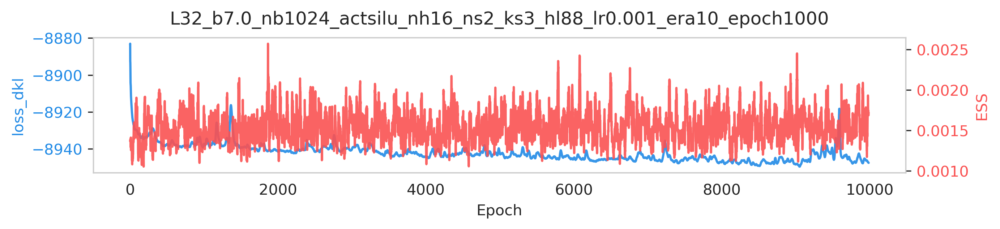

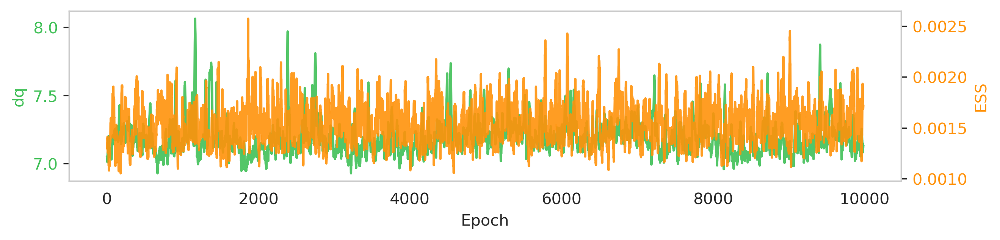

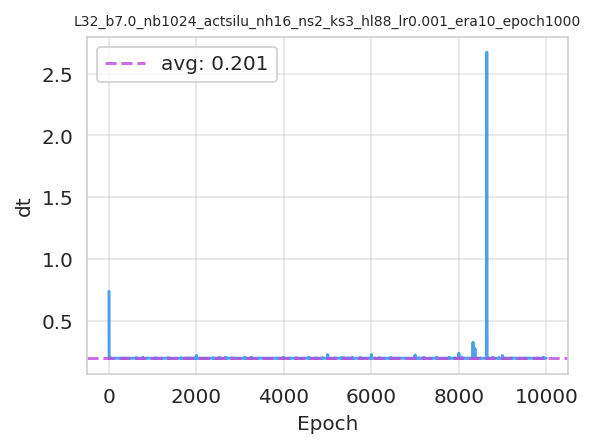

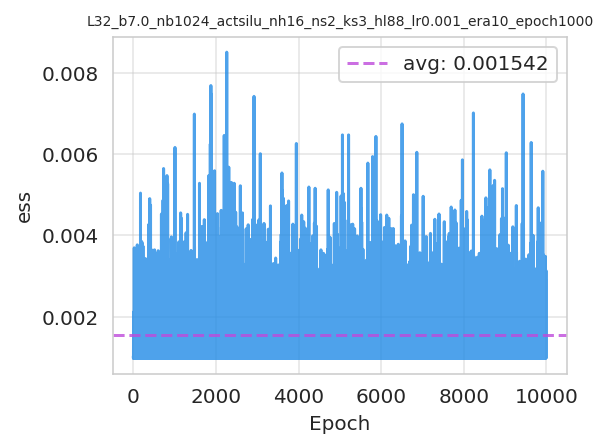

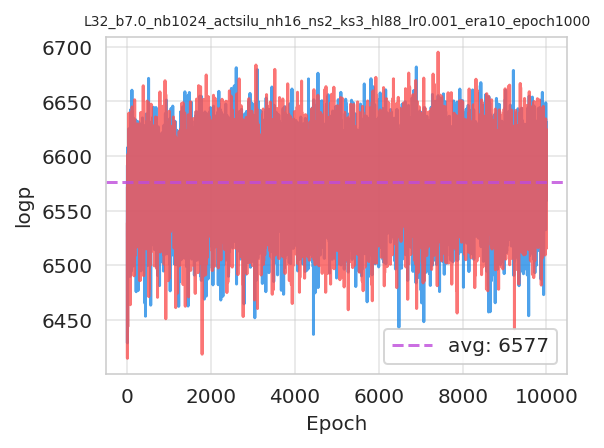

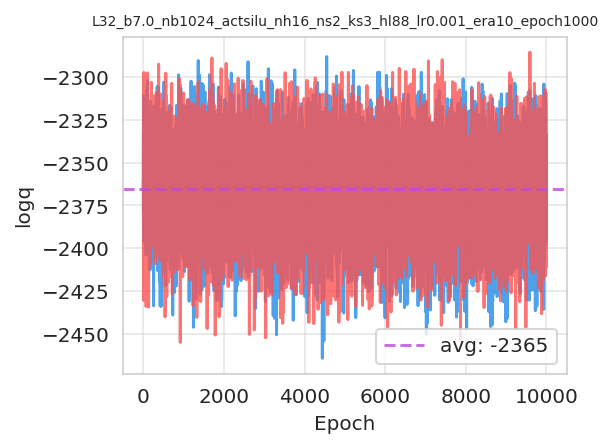

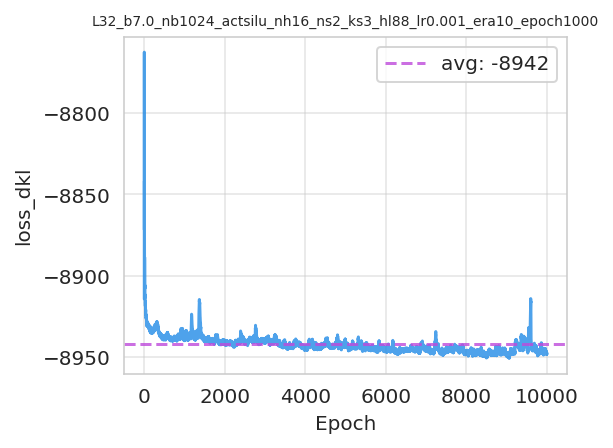

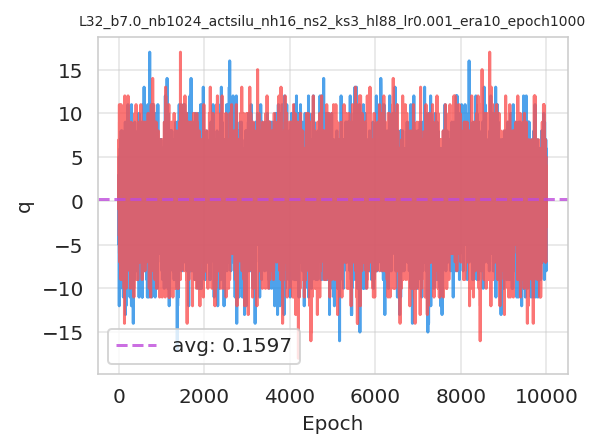

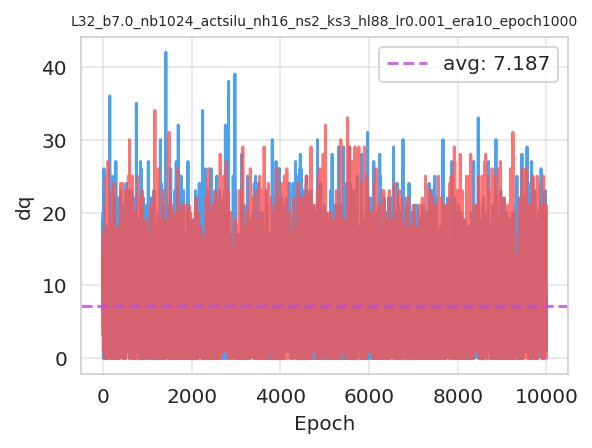

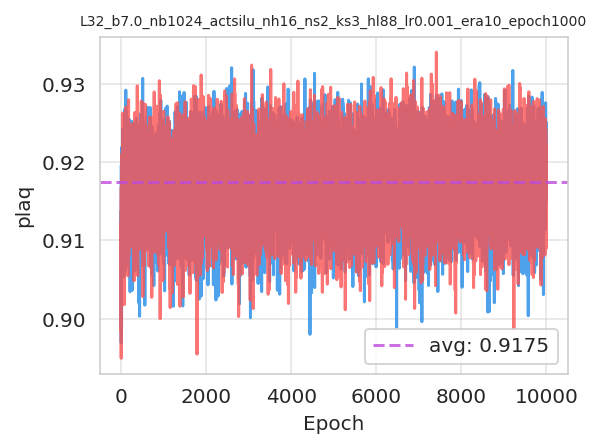

[08:52:17 AM]  Saving train_history to ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsil
               u_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0
               _nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/training/2021-07-12-
               081504/train_history.z.

─────────────────────── Using trained model to generate 8192 samples ────────────────────────

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/utils/inference.py:116: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[08:52:32 AM]  Creating directory: ../../logs/models/lat8x8/beta7.0/L8_b7.0_nb1024_actsilu_nh
               16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transferred_32x32/beta7.0/L32_b7.0_nb1
               024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/inference/plots

[08:52:32 AM]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/logq.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/logp.png

               Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/be
               ta7.0/L8_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch1000/transfe
               rred_32x32/beta7.0/L32_b7.0_nb1024_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epo
               ch1000/inference/plots/accepted.png

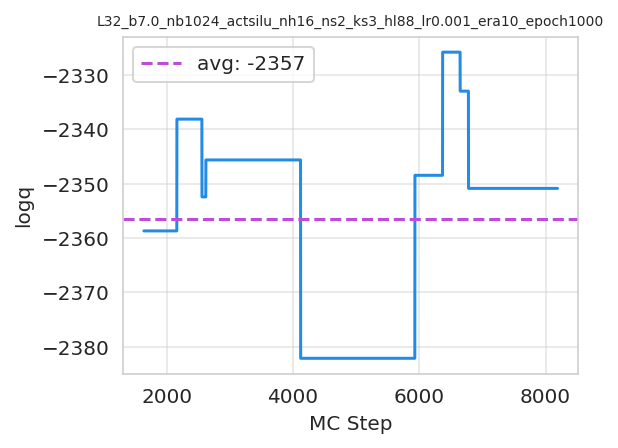

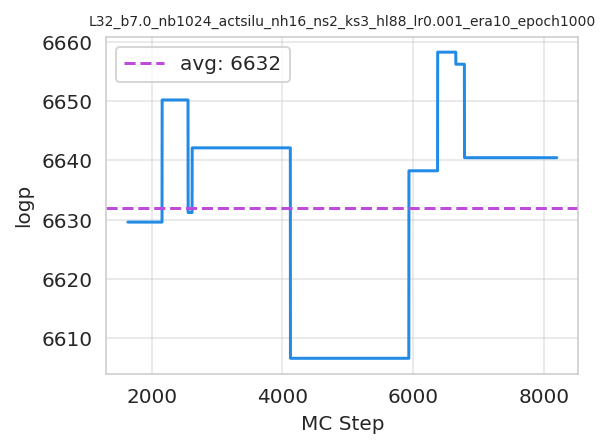

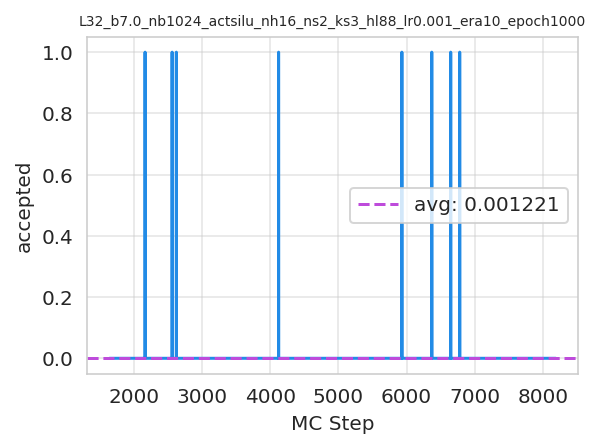

───────────────────── Running `ftHMC` using trained flow for 1024 trajs ─────────────────────

[08:52:33 AM]  Running ftHMC with tau=0.5, nsteps=10

               plaq=0.722 q=-7.000

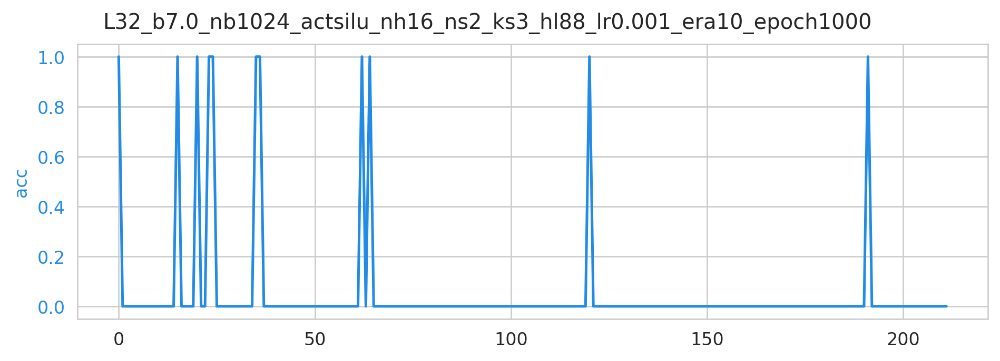

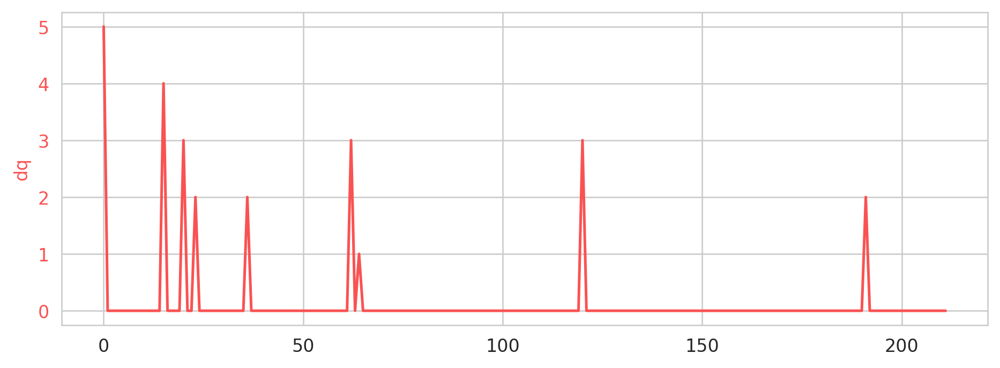

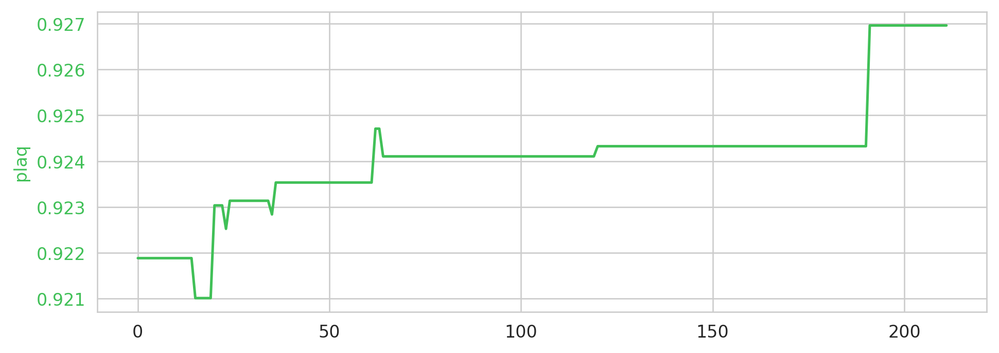

/lus/grand/projects/DLHMC/nftqcd/fthmc/fthmc/field_transformation.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val = torch.tensor(val, dtype=DTYPE)


[08:52:35 AM]  traj=0 dt=1.086 acc=1.000 dh=-20.972 plaq=0.922 q=-2.000 dq=5.000

[08:53:22 AM]  traj=50 dt=0.842 acc=0.000 dh=24.114 plaq=0.924 q=-3.000 dq=0.000

[08:54:09 AM]  traj=100 dt=0.842 acc=0.000 dh=3.565 plaq=0.924 q=1.000 dq=0.000

[08:54:56 AM]  traj=150 dt=0.843 acc=0.000 dh=45.793 plaq=0.924 q=-2.000 dq=0.000

[08:55:43 AM]  traj=200 dt=0.846 acc=0.000 dh=14.422 plaq=0.927 q=0.000 dq=0.000

In [ ]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=0.5, nstep=10)
Lnew = 4 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

In [ ]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=1.0, nstep=10)
Lnew = 8 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

In [ ]:
from fthmc.main import transfer

ftconfig = ftConfig(tau=1.0, nstep=10)
Lnew = 16 * train_config.L
layers = train_outputs['model'].layers
transfer_out = transfer(L=Lnew,
                        param=param,
                        layers=layers,
                        config=train_config,
                        ftconfig=ftconfig,
                        num_fthmc_trajs=1024)

In [32]:
from dataclasses import asdict
from fthmc.train import train, transfer_to_new_lattice

from torch import nn 

def transfer(
        L: int,
        param: Param,
        config: TrainConfig,
        scheduler_config: SchedulerConfig,
        layers: nn.ModuleList,
        new_lr: float = None,
        run_hmc: bool = True,
        figsize: tuple = None,
):
    if figsize is None:
        figsize = (9, 2)
        
    xfr = transfer_to_new_lattice(L=L,
                                  layers=layers,
                                  config=config)
    config_new = xfr['config']
    model_new = xfr['model']
    # ----------------------------------------------
    # Run HMC using new (transferred) `param` above
    # ----------------------------------------------
    #if run_hmc:
    #    from fthmc.hmc import run_hmc
    #    hmc_fields, hmc_history = run_hmc(param)


    if new_lr is not None:
        cfg_dict = asdict(config)
        cfg_dict['base_lr'] = new_lr
        config_new = TrainConfig(**cfg_dict)

    train_outputs = train(config_new,
                          model=model_new,
                          pre_model=None,
                          figsize=figsize,
                          scheduler_config=scheduler_config)
    return {
        #'param': param_new,
        'config': config_new,
        'model': model_new,
        'outputs': train_outputs
    }

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/plots

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/checkpoints

[20:45:58]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/summaries

[20:45:59]  Writing summaries to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/summaries

            Scheduler created!

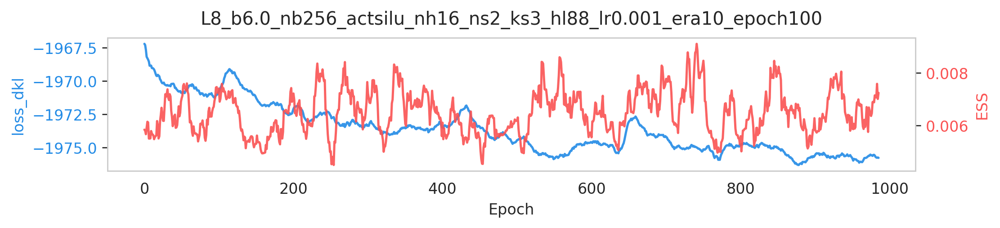

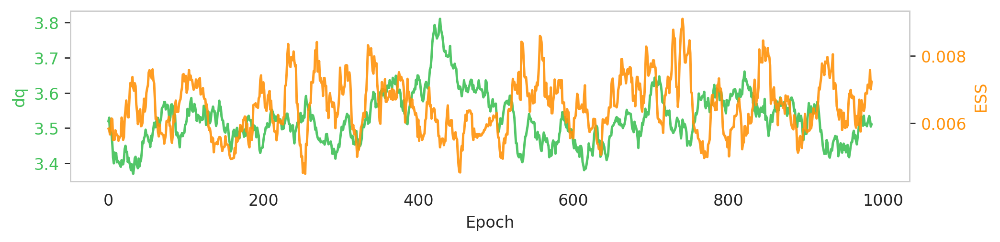

─────────────────────────────── ERA=0, last took: 0 min 0 sec ───────────────────────────────

[20:46:10]  epoch=100 dt=0.088 ess=0.004 logp=1351.456 logq=-619.231 loss_dkl=-1970.687      
            dq=3.430 plaq=3.519

[20:46:10]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era0-epoch99.tar

───────────────────────────── ERA=1, last took: 0 min 11.11 sec ─────────────────────────────

[20:46:19]  epoch=200 dt=0.088 ess=0.004 logp=1352.772 logq=-621.682 loss_dkl=-1974.455      
            dq=3.234 plaq=3.523

[20:46:20]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era1-epoch99.tar

───────────────────────────── ERA=2, last took: 0 min 9.645 sec ─────────────────────────────

[20:46:29]  epoch=300 dt=0.088 ess=0.013 logp=1351.876 logq=-621.552 loss_dkl=-1973.428      
            dq=3.465 plaq=3.521

[20:46:29]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era2-epoch99.tar

───────────────────────────── ERA=3, last took: 0 min 9.586 sec ─────────────────────────────

[20:46:39]  epoch=400 dt=0.089 ess=0.006 logp=1348.187 logq=-624.782 loss_dkl=-1972.969      
            dq=3.559 plaq=3.511

[20:46:39]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era3-epoch99.tar

───────────────────────────── ERA=4, last took: 0 min 9.725 sec ─────────────────────────────

[20:46:48]  epoch=500 dt=0.089 ess=0.005 logp=1354.221 logq=-621.353 loss_dkl=-1975.574      
            dq=3.543 plaq=3.527

[20:46:49]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era4-epoch99.tar

───────────────────────────── ERA=5, last took: 0 min 9.661 sec ─────────────────────────────

[20:46:58]  epoch=600 dt=0.092 ess=0.008 logp=1354.979 logq=-619.558 loss_dkl=-1974.537      
            dq=3.652 plaq=3.529

[20:46:59]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era5-epoch99.tar

───────────────────────────── ERA=6, last took: 0 min 9.675 sec ─────────────────────────────

[20:47:08]  epoch=700 dt=0.089 ess=0.005 logp=1351.781 logq=-622.783 loss_dkl=-1974.564      
            dq=3.918 plaq=3.520

[20:47:09]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era6-epoch99.tar

───────────────────────────── ERA=7, last took: 0 min 9.735 sec ─────────────────────────────

[20:47:18]  epoch=800 dt=0.090 ess=0.004 logp=1352.390 logq=-621.180 loss_dkl=-1973.570      
            dq=3.578 plaq=3.522

[20:47:18]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era7-epoch99.tar

───────────────────────────── ERA=8, last took: 0 min 9.701 sec ─────────────────────────────

[20:47:27]  epoch=900 dt=0.090 ess=0.011 logp=1353.170 logq=-622.655 loss_dkl=-1975.825      
            dq=3.270 plaq=3.524

[20:47:28]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era8-epoch99.tar

───────────────────────────── ERA=9, last took: 0 min 9.621 sec ─────────────────────────────

[20:47:37]  epoch=1000 dt=0.089 ess=0.008 logp=1358.712 logq=-617.487 loss_dkl=-1976.198     
            dq=3.461 plaq=3.538

[20:47:38]  Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era9-epoch99.tar

            Saving checkpoint to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/checkpoints/ckpt-era10-epoch101.tar

[20:47:38]  Saving live plots to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/b
            eta6.0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/20
            21-07-11-204558/plots

[20:47:39]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/dt.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/ess.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/logp.png

[20:47:40]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/loss_dkl.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/q.png

[20:47:41]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/dq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-0
            7-11-204558/plots/plaq.png

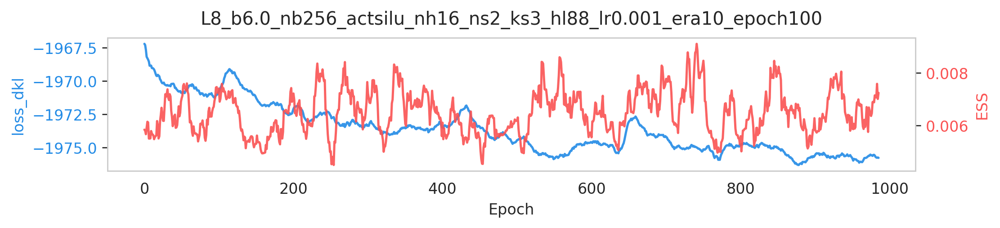

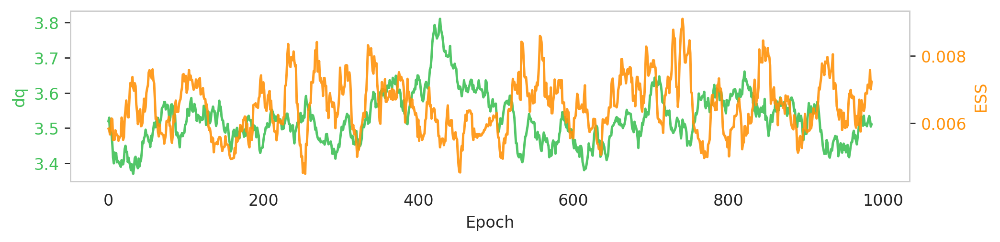

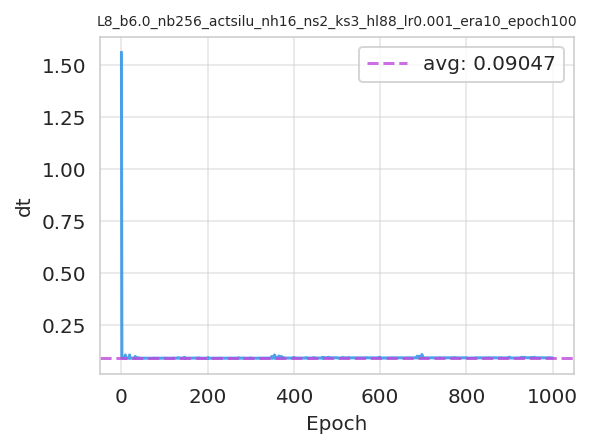

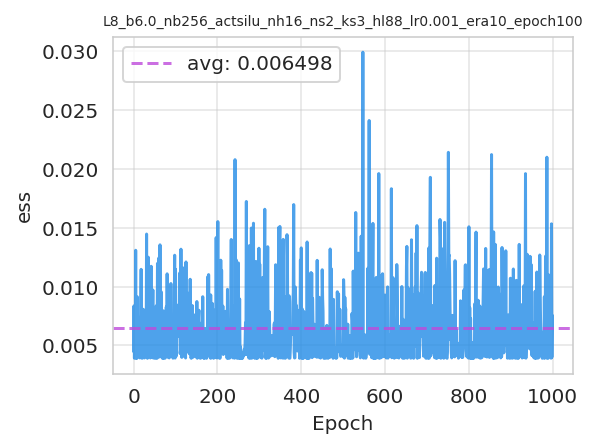

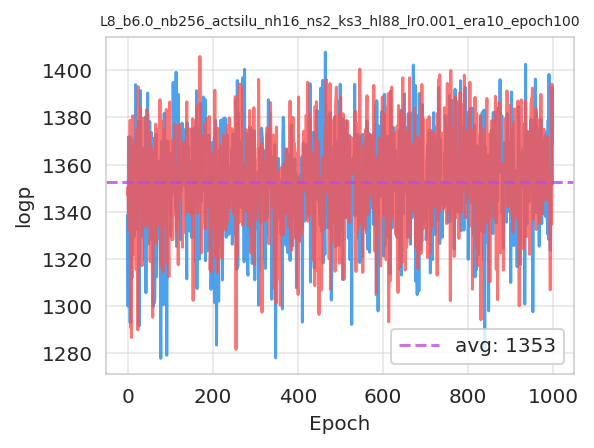

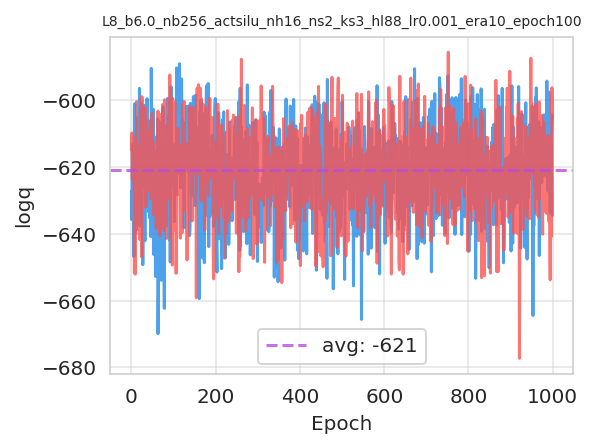

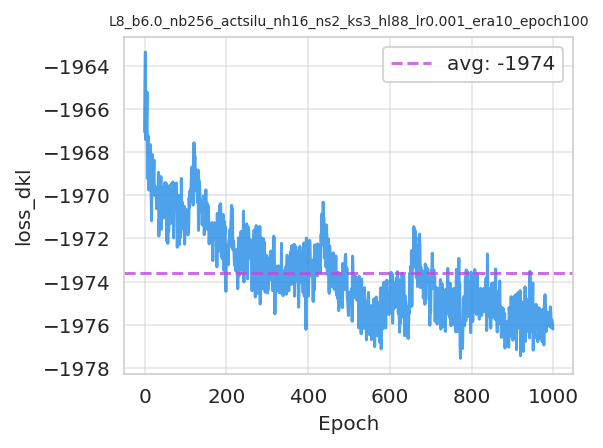

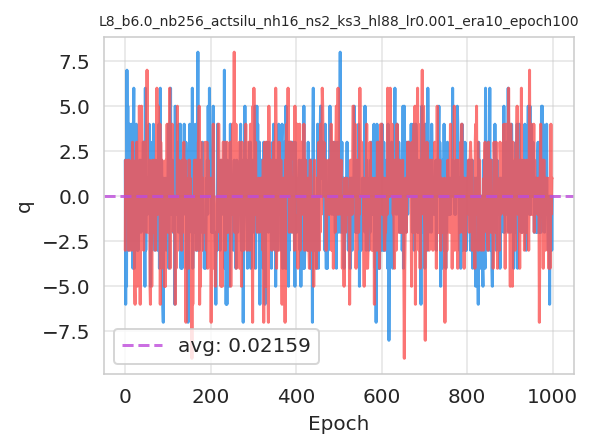

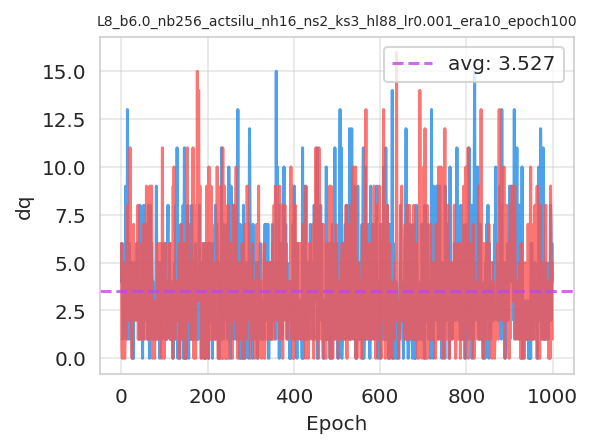

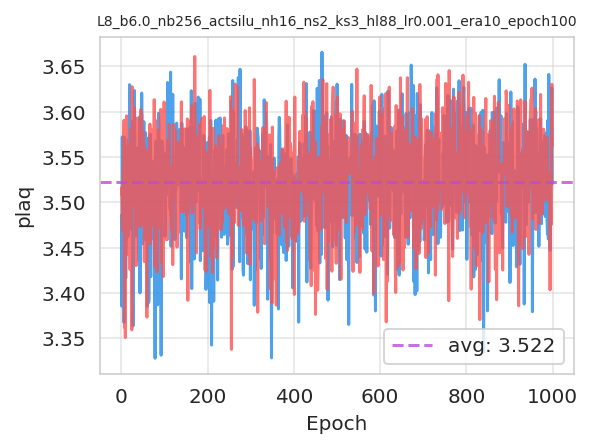

[20:47:43]  Saving train_history to ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh
            16_ns2_ks3_hl88_lr0.001_era10_epoch100/training/2021-07-11-204558/train_history.z
            .

In [33]:
layers8 = train_outputs['model'].layers #['layers']
layers8.train()
train_outputs16 = transfer(L=16, param=param,
                           config=train_config,
                           layers=layers8, 
                           scheduler_config=scheduler_config,
                           new_lr=0.001, run_hmc=False)

## Run inference on trained model

──────────────────── Running inference on trained model for 8192 samples ────────────────────

[20:51:37]  Creating directory: ../../logs/models/lat8x8/beta6.0/L8_b6.0_nb256_actsilu_nh16_n
            s2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x16/inference/plots

[20:51:37]  Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/x.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/logq.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/logp.png

            Saving figure to: /lus/grand/projects/DLHMC/nftqcd/fthmc/logs/models/lat8x8/beta6
            .0/L8_b6.0_nb256_actsilu_nh16_ns2_ks3_hl88_lr0.001_era10_epoch100/transferred_16x
            16/inference/plots/accepted.png

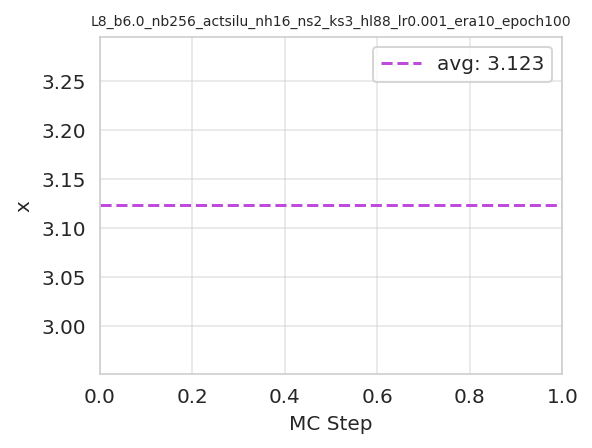

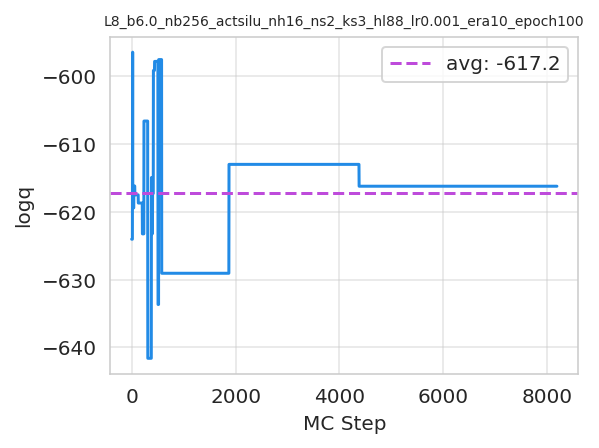

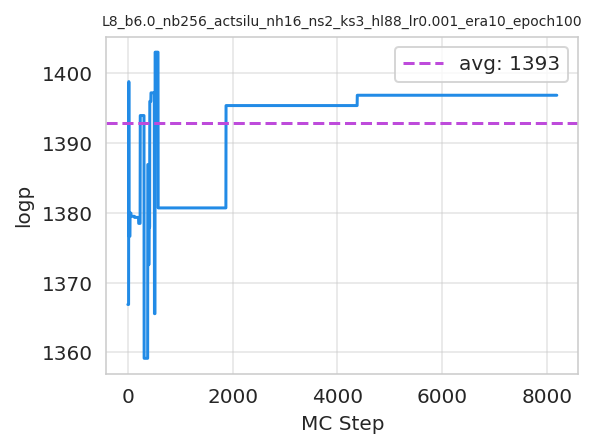

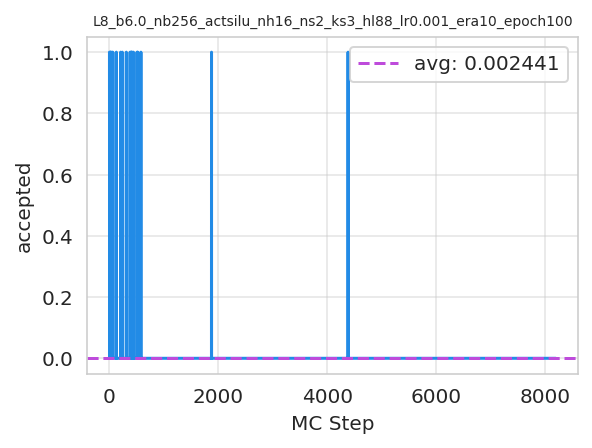

In [38]:
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.inference import U1GaugeAction, make_mcmc_ensemble
from torch.utils.tensorboard import SummaryWriter

NUM_SAMPLES = 8192

logger.rule(f'Running inference on trained model for '
            f'{NUM_SAMPLES} samples')

#param16 = train_outputs16['param']
config16 = train_outputs16['config']
model16 = train_outputs16['model']
outputs16 = train_outputs16['outputs']
#action_fn = qed.BatchAction(train_config.beta)
action_fn16 = U1GaugeAction(config16.beta)
logdir16 = os.path.join(config16.logdir, 'transferred_16x16')
if not os.path.isdir(logdir16):
    os.makedirs(logdir16)
    
#logdir16 = train_config.logdir

inf_dir16 = os.path.join(logdir16, 'inference')
inf_pdir16 = os.path.join(inf_dir16, 'plots')
inf_sdir16 = os.path.join(inf_dir16, 'summaries')

writer16 = SummaryWriter(log_dir=inf_sdir16)

nb = config16.batch_size
history16 = make_mcmc_ensemble(model16,
                               #action=action_fn,
                               action_fn16,
                               batch_size=nb, 
                               num_samples=NUM_SAMPLES,
                               writer=writer16)
                                 #num_samples=NUM_SAMPLES,
                                 #writer=writer)
plot_history(history=history16,
             hline=True,
             config=config16, #skip=['epoch', 'x'],
             num_chains=4, therm_frac=0., xlabel='MC Step',
             outdir=inf_pdir16)

In [ ]:
param16 = train_outputs16['param']
config16 = train_outputs16['config']
model16 = train_outputs16['model']
outputs16 = train_outputs16['outputs']

In [ ]:
action_fn16 = qed.BatchAction(param16.beta)

history16 = make_mcmc_ensemble(model=model16,
                               action_fn=action_fn16,
                               batch_size=config16.batch_size,
                               num_samples=8192)
plot_history(history=history16,
             param=param16, config=config16, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step')#, outdir=inf_pdir8)

## Run `ftHMC` on trained model

In [ ]:
from dataclasses import asdict
from fthmc.utils.plot_helpers import update_plot
from fthmc.field_transformation import FieldTransformation
from fthmc.config import ftConfig

ftconfig16 = ftConfig(tau=1., nstep=15) 

flow16 = train_outputs16['model'].layers
    
if torch.cuda.is_available():
    flow16.to('cuda')
    
flow16.eval()
#pdict = asdict(param)
#pdict['tau'] = 0.1
#pdict['nstep'] = 5


field_transformation16 = FieldTransformation(flow=flow16, config=config16, ftconfig=ftconfig16)

In [27]:
#x_ = hmc_fields[-1][-1].cuda()
#x_ = field_transformation16.wrap(torch.zeros((1, 2, 16, 16)).uniform_(-np.pi, np.pi))

logdir16 = config16.logdir

ftstr16 = ftconfig16.uniquestr()
fthmcdir16 = os.path.join(logdir16, 'ftHMC', ftstr16)

pdir16 = os.path.join(fthmcdir16, 'plots')
sdir16 = os.path.join(fthmcdir16, 'summaries')

writer16 = SummaryWriter(log_dir=sdir16)

runs_history16 = field_transformation16.run(nprint=50,
                                            figsize=(9., 2.),
                                            num_trajs=1024,
                                            writer=writer16,
                                            plotdir=pdir16,
                                            dpi=120, nplot=5, window=1)

RuntimeError: The size of tensor a (16) must match the size of tensor b (8) at non-singleton dimension 2

In [ ]:
from dataclasses import asdict
from fthmc.utils.plot_helpers import update_plot
from fthmc.field_transformation import FieldTransformation

flow16 = model16.layers
    
if torch.cuda.is_available():
    flow16.to('cuda')
    
flow16.eval()

field_transformation16 = FieldTransformation(flow=flow16, param=param16)
x16_ = param16.initializer().cuda()
#x_ = hmc_fields[-1][-1].cuda()

runs_history = field_transformation16.run(x=x16_, nprint=50,
                                          figsize=(9., 2.),
                                          num_runs=2, num_trajs=1000,
                                          dpi=120, nplot=5, window=1)

In [ ]:
# ----------------------------------------------------------------
# Run inference on transferred model and evaluate / plot metrics
# ----------------------------------------------------------------
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history
from fthmc.utils.samplers import make_mcmc_ensemble

sns.set_context('paper')
action_fn8 = qed.BatchAction(param8.beta)
dirs8 = train_outputs8['dirs']
logdir8 = dirs8['logdir']

inf_dir8 = os.path.join(logdir8, 'inference')
inf_pdir8 = os.path.join(inf_dir8, 'plots')
history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=action_fn8,
                               batch_size=train_config8.batch_size,
                               num_samples=1000)
plot_history(history=history8,
             param=param8, config=train_config8, skip=['epoch', 'x'],
             num_chains=4, therm_frac=0.0, xlabel='MC Step', outdir=inf_pdir8)

In [ ]:
%debug